<a href="https://colab.research.google.com/github/nielsrolf/GAN-TUBerlin/blob/master/report_proposal.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Introduction

In this notebook, I have some notes for a report about GANs and code for the corresponding experiments. The topic is not really related to our original task, instead I tried to think of something that is interesting and for what we have the most interesting experiments implemented already.


## Repo Setup
Clone or update the repo, then import it, get the data and
plot it

This connects to google drive and clones the repo if necessary
It imports the files from google drive, since the import works a bit different it cannot import stuff directly into the main namespace and we have some renamings in the code

If you have Google Drive on your computer installed, you can edit the files with an editor and just run this cell again to make the changes actiactive

In [6]:
%load_ext autoreload
%autoreload 2

from os.path import join
from google.colab import drive
import os

ROOT = "/content/drive"
drive.mount(ROOT, force_remount=True)

# Defining the right path
# It depends on how you have organized your folders
PROJECT_PATH = "/content/drive/My Drive/gan_tu/"
# os.makedirs(PROJ, exist_ok=True)

# !cd "{PROJ}" && git clone https://github.com/nielsrolf/GAN-TUBerlin.git
!ls "{PROJECT_PATH}"

from importlib.machinery import SourceFileLoader
gan = SourceFileLoader('gan', join(PROJECT_PATH, 'gan.py')).load_module()
callbacks = SourceFileLoader('callbacks', join(PROJECT_PATH, 'callbacks.py')).load_module()
d2 = SourceFileLoader('d2', join(PROJECT_PATH, 'two_d_utils.py')).load_module()

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
Mounted at /content/drive
2d_experiments.ipynb			  forked_keras_gan.ipynb
AE_enc.h5				  gan.py
AEGAN_d.h5				  gzip
AEGAN_enc.h5				  gzip.zip
AEGAN_g.h5				  keras_gan_mnist.ipynb
AE_g.h5					  mnist_predictor.h5
badgan_d.h5				  models
badgan_g.h5				  more_2d_experiments.ipynb
callbacks.py				  notes
colab_gan_that_imports_from_github.ipynb  plots
data					  __pycache__
DCGAN_d.h5				  README.md
DCGAN_g.h5				  two_d_utils.py


Loading the needed modules

In [0]:
# The modules are loaded, renamings happen here. Add the ones you need
GradientInverser = gan.GradientInverser
DCGAN = gan.DCGAN
Uniform = gan.Uniform
Unconnected = gan.Unconnected
AutoencodingGAN = gan.AutoencodingGAN

OverfittingCallback = callbacks.OverfittingCallback   
InverseDistributionCallback = callbacks.InverseDistributionCallback
EvolvingImageCallback = callbacks.EvolvingImageCallback
InterpolationCallback = callbacks.InterpolationCallback
show = callbacks.show

## Dataset Setup

11493376/11490434 [==============================] - 0s 0us/step


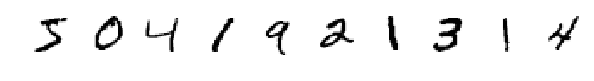

In [8]:
from tensorflow.keras.datasets import mnist

import matplotlib.pyplot as plt
import sys
import numpy as np

# Load the dataset
(X_train, Y_train), (X_test, Y_test) = mnist.load_data()

# Rescale -1 to 1
X_train = X_train / 127.5 - 1.
X_test = X_test / 127.5 - 1.

X_train = np.reshape(X_train, [-1, 28, 28, 1])
X_test = np.reshape(X_test, [-1, 28, 28, 1])

X_train.shape
callbacks.show(X_train[:10])

# transform it to one hot encoding
Y_train = np.eye(10)[Y_train]
Y_test = np.eye(10)[Y_test]

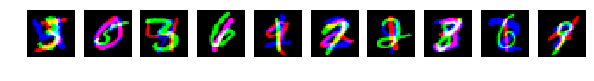

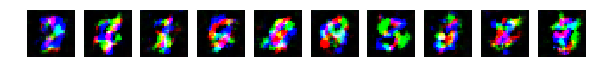

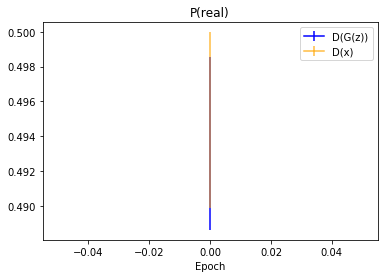

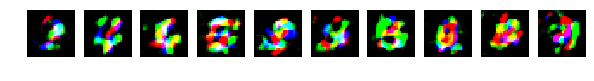

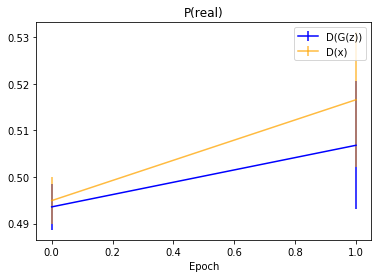

...

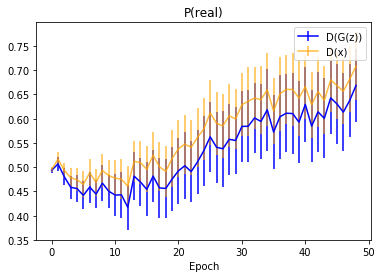

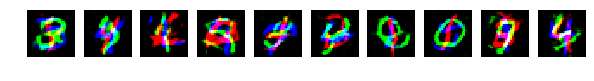

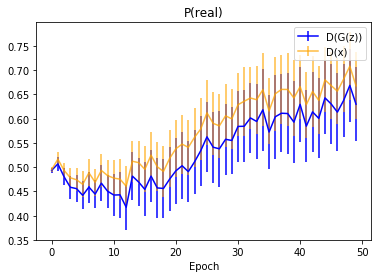

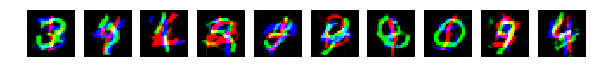

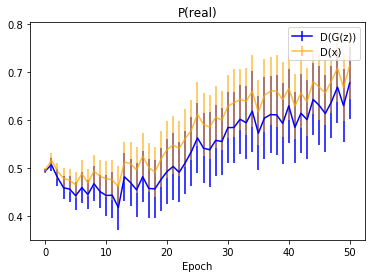

In [27]:
batches = gan.batches

class MNIST3GAN(DCGAN):
    def train(self, X_train, epochs, batch_size=128, callbacks=[], d_steps=1, g_steps=1):

        # Adversarial ground truths
        valid = np.ones((batch_size, 1))
        fake = np.zeros((batch_size, 1))

        for epoch in range(epochs):

            # ---------------------
            #  Train Discriminator
            # ---------------------

            for batch_id, channels in enumerate(zip(batches(X_train, batch_size), batches(X_train, batch_size), batches(X_train, batch_size))):
                imgs = np.stack(channels, axis=-1)
                imgs = np.reshape(imgs, [-1]+self.img_shape)
                self.train_step(imgs, d_steps, g_steps)
                
            for callback, period in callbacks:
                if (epoch+1) % period == 0:
                    callback()
                    
#gan3 = MNIST3GAN(Uniform(100, low=-1, high=1), img_shape=[28, 28, 3], load_from='models_mnist3')

def show3(images):
    images = np.reshape(images, [-1, 28, 28, 3])
    n = images.shape[0]
    fig, axes = plt.subplots(nrows=1, ncols=n, figsize=(n, 2),
                                    sharex=True, sharey=True)
    for i, img, ax in zip(range(n), images, axes):
        ax.imshow((img+1)/2)
        ax.axis('off')
    plt.show()
    
show3(np.stack([X_train[:10], X_train[10:20], X_train[20:30]], axis=-1))

noise = gan3.prior(10)
def plt3():
    show3(gan3.generate(noise))
    
plt3()

pmetric = callbacks.PMetrics(gan3, np.squeeze(np.stack([X_train[:1000], X_train[1000:2000], X_train[2000:3000]], axis=-1)))
pmetric.track()
pmetric.plot()
period = 1
train_callbacks = [
    (plt3, period),
    (pmetric.track, 1),
    (pmetric.plot, period),
    (lambda: gan3.save('models_mnist3'), 1),
]

# Train the GAN
gan3.train(X_train, epochs=50, batch_size=128, callbacks=train_callbacks)

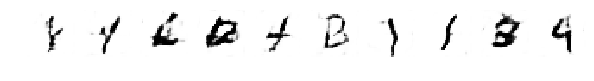

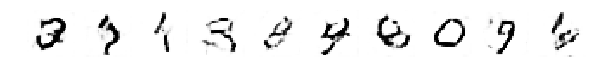

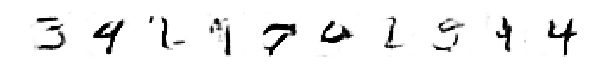

In [28]:

images = gan3.generate(noise)
for i in range(3):
    show(images[:,:,:,i])

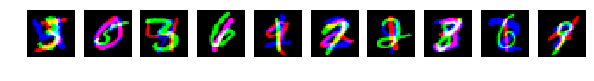

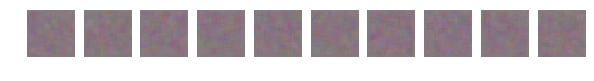

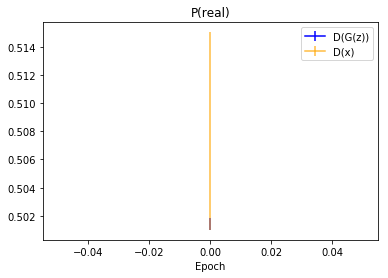

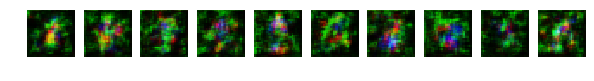

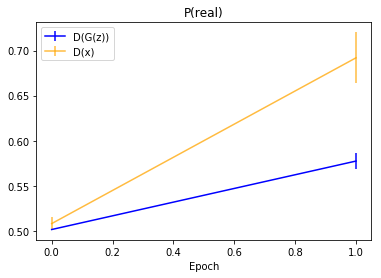

...

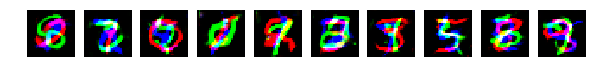

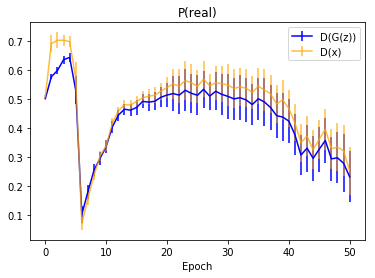

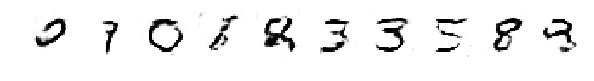

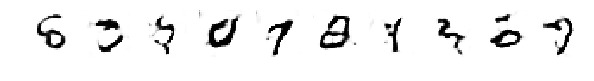

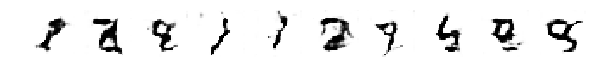

In [52]:
class AEGAN3(MNIST3GAN, AutoencodingGAN):
    pass

aegan3 = AEGAN3(Uniform(100, low=-1, high=1), img_shape=[28, 28, 3], train_decoder=True) #, load_from='models_aegan3')

    
show3(np.stack([X_train[:10], X_train[10:20], X_train[20:30]], axis=-1))

noise = aegan3.prior(10)
def plt3():
    show3(aegan3.generate(noise))
    
plt3()

pmetric = callbacks.PMetrics(aegan3, np.squeeze(np.stack([X_train[:1000], X_train[1000:2000], X_train[2000:3000]], axis=-1)))
pmetric.track()
pmetric.plot()
period = 1
train_callbacks = [
    (plt3, period),
    (pmetric.track, 1),
    (pmetric.plot, period),
    (lambda: aegan3.save('models_aegan3'), 1),
]

# Train the GAN
aegan3.train(X_train, epochs=50, batch_size=128, callbacks=train_callbacks)

images = aegan3.generate(noise)
for i in range(3):
    show(images[:,:,:,i])

In [53]:
np.random.randint(3)

0

#Classes  AEGAN 1000


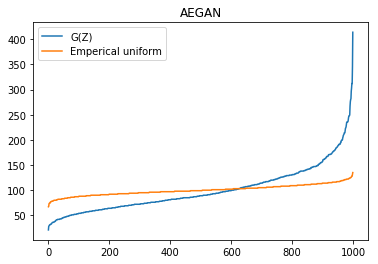

array([[6., 8., 0.],
       [1., 6., 0.],
       [0., 6., 7.],
       ...,
       [5., 3., 3.],
       [8., 3., 6.],
       [3., 1., 8.]])

In [54]:
from tensorflow.keras.models import load_model
from collections import Counter

clf = load_model(PROJECT_PATH+'/mnist_predictor.h5')
def clf3(x):
    y = np.zeros([len(x), 3])
    for i in range(3):
        y[:,i] = np.argmax(clf.predict(x[:,:,:,i,None]), axis=1)
    return y

# count number of classes
def eval_modes(g3, title):
    z = g3.prior(100000)
    y = clf3(gan3.generate(z))
    occurences = Counter([str(i) for i in y]).values()
    print('#Classes ',title, len(occurences))
    plt.plot(sorted(occurences), label='G(Z)')
    plt.plot(sorted(Counter(np.random.randint(1000, size=len(y))).values()), label='Emperical uniform')
    plt.legend()
    plt.title(title)
    plt.show()
    return y
    
# eval_modes(gan3, 'DCGAN')

eval_modes(aegan3, 'AEGAN')
# modes_aegan = eval_modes(aegan3)
# print('#Classes aegan', modes_aegan)
        

# show single channel

# gd inv with only one sample to start with

#Classes aegan 1000
#Classes gan 1000


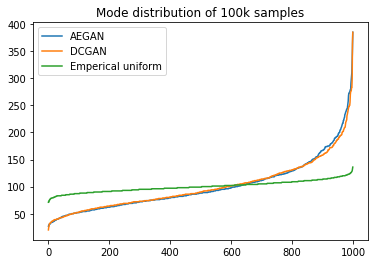

In [56]:
z = aegan3.prior(100000)
y = clf3(aegan3.generate(z))
occurences = Counter([str(i) for i in y]).values()
print('#Classes aegan', len(occurences))
plt.plot(sorted(occurences), label='AEGAN')

y = clf3(gan3.generate(z))
occurences = Counter([str(i) for i in y]).values()
print('#Classes gan', len(occurences))
plt.plot(sorted(occurences), label='DCGAN')

plt.plot(sorted(Counter(np.random.randint(1000, size=len(y))).values()), label='Emperical uniform')


plt.legend()
plt.title('Mode distribution of 100k samples')
plt.show()

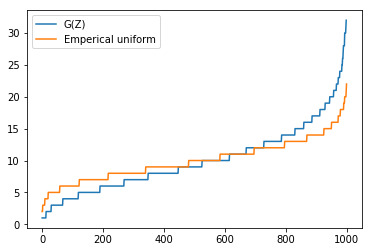

In [41]:
occurences()

dict_values([16, 13, 14, 9, 17, 14, 10, 12, 5, 12, 18, 8, 14, 17, 30, 15, 10, 28, 17, 9, 6, 3, 10, 9, 6, 7, 13, 8, 10, 11, 19, 25, 7, 13, 6, 6, 10, 7, 16, 15, 10, 9, 14, 8, 19, 15, 13, 8, 13, 16, 17, 14, 9, 17, 15, 15, 17, 6, 22, 9, 11, 6, 20, 11, 12, 23, 11, 16, 8, 5, 20, 9, 5, 10, 4, 4, 13, 10, 13, 4, 2, 7, 10, 10, 16, 13, 6, 12, 12, 10, 17, 14, 13, 14, 24, 11, 16, 12, 24, 5, 11, 11, 16, 8, 20, 11, 28, 14, 5, 17, 6, 13, 5, 7, 16, 13, 10, 19, 12, 9, 18, 14, 6, 7, 15, 4, 19, 11, 16, 21, 24, 21, 17, 12, 28, 6, 12, 13, 4, 23, 15, 4, 15, 7, 8, 7, 6, 7, 6, 24, 19, 7, 27, 14, 3, 9, 10, 7, 13, 10, 11, 6, 15, 19, 17, 10, 15, 9, 14, 19, 14, 6, 12, 7, 8, 9, 5, 12, 9, 6, 9, 11, 9, 17, 12, 9, 10, 11, 17, 11, 9, 6, 6, 7, 20, 14, 9, 13, 10, 26, 4, 30, 4, 9, 16, 8, 3, 11, 6, 8, 12, 11, 12, 11, 8, 8, 19, 12, 14, 6, 16, 9, 8, 22, 3, 11, 10, 10, 10, 11, 9, 14, 7, 11, 3, 8, 10, 10, 6, 13, 4, 16, 8, 30, 24, 5, 13, 13, 18, 13, 8, 6, 15, 15, 5, 11, 22, 14, 6, 9, 19, 17, 17, 16, 11, 11, 18, 12, 23, 31, 6, 7

## Small code tutorial
Now let's walk through the following:
- Loading MNIST or 2D dataset
- Training a GAN on MNIST
- Creating a new architecture
- Changing the training and implement the T-approach

Data loading is simple, MNIST format is as you see above, 2D format is as you see in the corresponding cell. It's just np arrays for X and Y.

We have all the actual GAN stuff in the gan module, and in callbacks we have a number of visualization methods that can be called during training to see what happens. Some of these methods have a state, eg a callback to plot how D(real) and D(fake) behave (state is how it was in previous time steps). These callbacks are handled by classes.
This is a nice way to experiment with training without too many changes of the code.

The standard GAN class is a DCGAN for MNIST sized data. Let's train it and use some callbacks:
- pmetric: tracks D(reals), D(fakes) during the training. It's a class that needs access to the gan instance and some real samples to evaluate on, so it is created as `PMetrics(gan_instance, test_data)`. It has two methods that can be run as callback: `.track()` evaluates the probabilities and save them, `.plot()` plots the tracked data
- `EvolvingImageCallback` plots generated images from a fixed noise batch each time `.plot()` is called
- `InterpolationCallback` also needs acces to the gan and gets it in the constructor. It fixes two random points in the latent space, does a linear interpolation between them and plots the corresponding images each time `.plot()` is called
- `InverseDistributionCallback` needs access to the gan and some real samples that are passed to the constructor. Each time .plot is called, it does a gradient descent inversion of the samples and shows a 2D projection of the latent codes that represent the samples and shows the reconstructed images.

The train method takes a list of callback tuples, that work as follows:
it's a list of tuples like `(function, epoch_interval)`
. The function is executed every `epoch_interval` epochs and does not take any parameters.

Other callbacks are:
For 2D: 
- `InterpolationCallback2D` shows how a grid in the latent space is transformed by the GAN and therefore shows the pdf of the generated points.
- `EvolvingImageCallback2D` shows how the points are moving during the training
- `ModeCollapseObserver` takes a trained classifier and plots a histogram of the predicted labels of the generated images

We need some new visualizations for the 3D dataset.

In [0]:
# Train a regular DCGAN on MNIST
dcgan = gan.DCGAN(gan.Uniform(100))
m = dcgan.generator
m.layers

# Defining the callbacks to be used
# pmetric = callbacks.PMetrics(dcgan, X_test[:1000])
# period = 1
# train_callbacks = [
#     (callbacks.EvolvingImageCallback(dcgan).plot, period),
#     (callbacks.InterpolationCallback(dcgan).plot, period),
#     (pmetric.track, 1),
#     (pmetric.plot, period),
#     (lambda: dcgan.save('models_mnist'), period),
#     (callbacks.InverseDistributionCallback(dcgan, X_test[:100], "X_test").plot, period)
# ]

# # Train the GAN
# dcgan.train(X_train, epochs=50, batch_size=128, callbacks=train_callbacks)

W0716 15:55:42.240639 140527949969280 deprecation.py:506] From /usr/local/lib/python3.6/dist-packages/tensorflow/python/ops/init_ops.py:1251: calling VarianceScaling.__init__ (from tensorflow.python.ops.init_ops) with dtype is deprecated and will be removed in a future version.
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
W0716 15:55:42.995639 140527949969280 deprecation.py:323] From /usr/local/lib/python3.6/dist-packages/tensorflow/python/ops/nn_impl.py:180: add_dispatch_support.<locals>.wrapper (from tensorflow.python.ops.array_ops) is deprecated and will be removed in a future version.
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


In [0]:
m.layers[1].layers[6].output

<tf.Tensor 'up_sampling2d_1/ResizeNearestNeighbor:0' shape=(?, 28, 28, 128) dtype=float32>

The 2D callbacks are used in the `more_2d_experiments` notebook.

In order to change something about the GAN, e.g. the architecture, just override specific methods and inherent the rest from DCGAN. Here is an mplementation of the architecture that supposedly had mode collapse, which I did not check very precisely but it didnt look like it in my case:

W0629 16:46:12.591691 139810894927744 nn_ops.py:4224] Large dropout rate: 0.8 (>0.5). In TensorFlow 2.x, dropout() uses dropout rate instead of keep_prob. Please ensure that this is intended.
W0629 16:46:12.991288 139810894927744 nn_ops.py:4224] Large dropout rate: 0.8 (>0.5). In TensorFlow 2.x, dropout() uses dropout rate instead of keep_prob. Please ensure that this is intended.


Model: "model_9"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_14 (InputLayer)           [(None, 28, 28, 1)]  0                                            
__________________________________________________________________________________________________
flatten_3 (Flatten)             (None, 784)          0           input_14[0][0]                   
__________________________________________________________________________________________________
dropout_11 (Dropout)            (None, 784)          0           flatten_3[0][0]                  
__________________________________________________________________________________________________
dense_18 (Dense)                (None, 1200)         942000      dropout_11[0][0]                 
____________________________________________________________________________________________

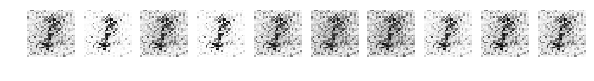

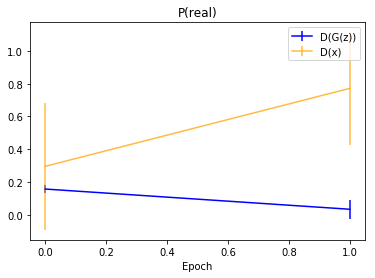

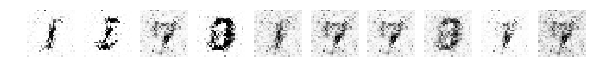

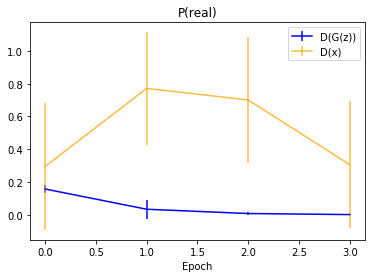

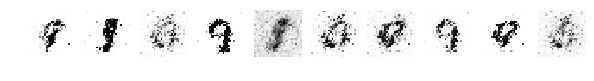

...

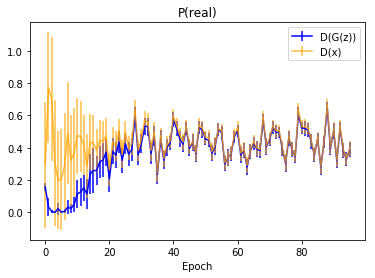

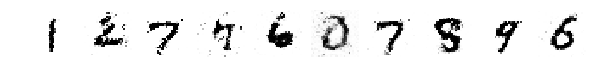

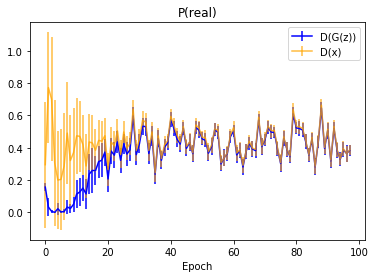

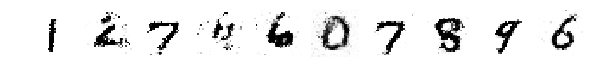

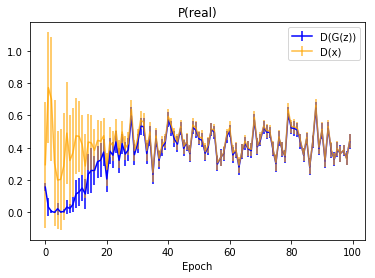

In [0]:
from tensorflow.keras.layers import Input, Dense, Reshape, Flatten, Dropout, maximum
from tensorflow.keras.models import Sequential, Model


class OtherGAN(DCGAN):
    def build_generator(self):

        model = Sequential()

        model.add(Dense(1200, activation="relu", input_dim=self.prior.d))
        model.add(Dense(1200, activation="relu"))
        model.add(Dense(784, activation="tanh"))
        model.add(Reshape(self.img_shape))

        noise = Input(shape=(self.prior.d,))
        img = model(noise)

        return Model(noise, img)

    def build_discriminator(self):

        img = Input(shape=self.img_shape)
        x = Flatten()(img)
        x = Dropout(0.8)(x)
        x = maximum([Dense(1200)(x) for _ in range(5)])
        x = Dropout(0.5)(x)
        x = maximum([Dense(1200)(x) for _ in range(5)])
        x = Dropout(0.5)(x)
        y = Dense(1, activation='sigmoid')(x)
        model = Model(img, y)
        model.summary()
        return model
    

class Uniform():
    def __init__(self, d=100, low=-1, high=1):
        self.d = d
        self.low = low
        self.high = high
    
    def __call__(self, n):
        return np.random.uniform(low=self.low, high=self.high, size=(n, self.d))
    
# Choose whether to load an architecture or create a new one 
# by setting 'use_loaded_gan' to respectively True or False  
use_loaded_gan = False
if use_loaded_gan is True:
  badgan = OtherGAN(Uniform(100, -np.sqrt(3), np.sqrt(3)), load_from=PROJECT_PATH+'/badgan')
else:
  badgan = OtherGAN(Uniform(100, -np.sqrt(3), np.sqrt(3)))

pmetric = callbacks.PMetrics(badgan, X_test[:1000])
period = 2
train_callbacks = [
    (callbacks.EvolvingImageCallback(badgan).plot, period),
    (pmetric.track, 1),
    (pmetric.plot, period),
    (lambda: badgan.save(PROJECT_PATH+'/badgan'), period)
]

badgan.train(X_train, epochs=100, batch_size=128, callbacks=train_callbacks, d_steps=1)

I interrupted because I wanted to check if mode collapse happened:

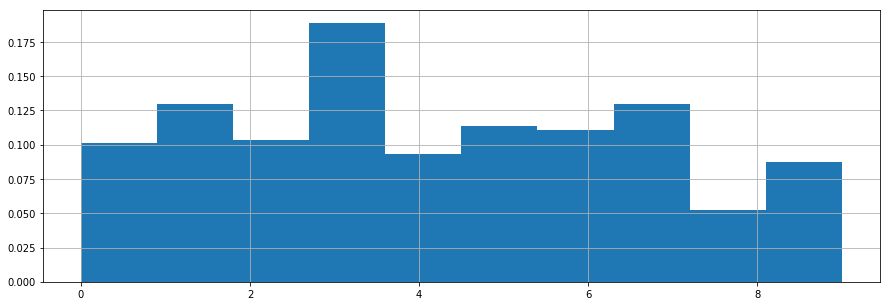

In [0]:
from tensorflow.keras.models import load_model
clf = load_model(f"{PROJECT_PATH}/mnist_predictor.h5")
modes = clf.predict(badgan.generator.predict(badgan.prior(1000)))

plt.figure(figsize=(15, 5))
plt.hist(modes.argmax(1), bins=10, density=True)
plt.grid(axis='x')
plt.show()

# Report notes: Comparing GANs and Autoencoders

Here are the condensed notes, [number] means reference to an experiment

## GAN introduction
- Purpose: sample from high dimensional distribution
- graphic [1] show learned pdf of 2D problem
- Setup: generator vs discriminator
- objective

## Autoencoder introduction
- Train setup: Encoder -> $z$ -> Decoder
- objective

## Comparison to GAN
- Common: latent space and decoder/generator
- Argue: if:
  - the latent space of an auto encoder is constraint to the same closed set $ Z$, e.g. the box $ [-1, 1]^d $ (a subset of $ R^d $)
  - $(2)$ There exists no common probability distribution $ P_{data,z} $ and $ P_{z} $ such that $ H(P_{data,z} | P_{z}) = 0 $. This means a lossless compression is not possible
  - THEN the optimal encoder learns to map the distribution $ D_{data} $ to a uniform distribution over  $Z$, and the decoder learns to map a uniform distribution over $Z$ to the probability distribution that minimizes the $ MSE(x, decoded(encoded(x))) $
  
Plain English: if an optimal encoding of some data is not possible within a constraint latent space, an optimal decoder uses the available space optimally. Most information can be stored if the $z_s$ are uniformly distributed. So the encoder will map the data distribution to a uniform distribution, and that to one that minimises the error of reconstructed data, because we train it to do so.

- GAN as autoencoder: Encoding a GAN by training encoder vs gradient descent
  - experiment [2] Comparison of encoding power: GAN is also good (how good)
  - Combined auto encoding gan: is it better at encoding?
  - Applications (each section very short), compare auto encoder and gan on each task
    - [2.2] filling image patches
    - [2.3] interpolating
    - [2.4] feature extraction: linear classifier on encoded vs original problem
- [3] Comparison of generating power: Why is the auto encoder worse at generating stuff?
  - $(2)$  is likely not true: bits in image/bits in 1000 dimensional vector =: necessary compression rate
If we sample that many random images, there will likely be none of the support of P_data, i.e. there will be no image that looks like it could really be in the dataset
That means such a portion of the image space does not need to be encoded
The encoder can allow to ‘waste’ some of the available bits for encoding and create areas that are never mapped to as well
If we sample from these areas, the decoder was not trained to generate something from the support of P_data, i.e. an realistic image
- Conslusion:  gan objective is ‘harder’: perfect gan can encode perfectly, but perfect auto encoder often doesn’t need to generate perfectly

Experiments:

[1] show learned pdf of 2D problem

[2]
Encoding with GAN, auto encoder and auto encoding GAN
Training the generator as gan decoder brings no performance improvement in any of these categories:
Quality of generated samples
Reconstruction loss compared to gradient inversion of normal gan
Reconstruction loss compared to an additionally trained encoder?
Reconstruction loss hierarchy?

[2.2] filling image patches
Show samples that are filled with gan vs autoencoder

[2.3] interpolating
Show interpolations in latent space with gan and autoencoder
Are the sets of encoded modes convex sets? 

[2.4] feature extraction:
 linear classifier on encoded vs original problem, again with auto encoder vs gan

[3] Show Decoded(z) for random z, poor quality



Future work:
Comparing to VAE:
Optimal vae vs optimal gan
Optimal vae vs optimal autoencoder


## Experiment [1] $P_G$ in 2D
We train a GAN on an artificial toy dataset that has four modes. Then we generate a 2D grid and use the generator on each point of them - we can see how it transforms the probability distribution that we enter into something that is much denser in the areas close to the original modes, but it cannot fully recover this distribution.

- Top: Points sampled from $P_{real}$
- Below: G(grid)

TODO: plot $P_data$


### 2D Dataset

In [0]:
X_train = d2.generate_2d(10000, 0.5)/2
X_test = d2.generate_2d(1000, 0.5)/2
d2.show_2d(X_test)

## Training

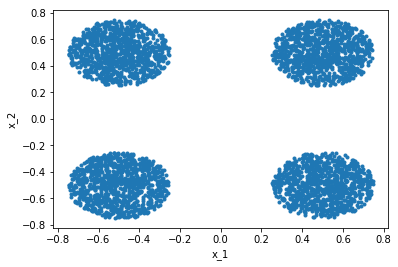

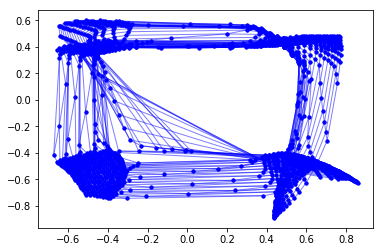

In [0]:
minigan = gan.MiniGan(Uniform(2))
minigan.train(X_train, epochs=10, batch_size=128, d_steps=4)
callbacks.InterpolationCallback2D(minigan).plot()

## [2] Encoding with GAN, auto encoder and auto encoding GAN 

We can use various combinations of GANs and autoencoders to achieve

Training the generator as gan decoder brings no performance improvement in any of these categories: Quality of generated samples Reconstruction loss compared to gradient inversion of normal gan Reconstruction loss compared to an additionally trained encoder? Reconstruction loss hierarchy?

In [0]:
# Gianluca's Path to the models
mPath = '/content/drive/My Drive/TUB/NIPP/models/MNIST/Normal/'

### MNIST Dataset

In [0]:
from tensorflow.keras.datasets import mnist
import matplotlib.pyplot as plt
import numpy as np

(X_train, Y_train), (X_test, Y_test) = mnist.load_data()

# Rescale -1 to 1
X_train = X_train / 127.5 - 1.
X_test = X_test / 127.5 - 1.

X_train = np.reshape(X_train, [-1, 28, 28, 1])
X_test = np.reshape(X_test, [-1, 28, 28, 1])

### Autoencoding GANs

Loading: NOT WORKING $\downarrow$

In [0]:
# we don't train the decoder with ae objective
dcgan = AutoencodingGAN(gan.Uniform(100), train_decoder=False, 
                        load_from=mPath+'dcgan')

From scratch

In [0]:
dcgan = AutoencodingGAN(gan.Uniform(100), train_decoder=False) # we don't train the decoder with ae objective

Loading:  WORKING $\downarrow$

In [0]:
# we train the generator
aegan = AutoencodingGAN(gan.Uniform(100), train_decoder=True,
                        load_from=mPath+'aegan')

From scratch

In [0]:
aegan = AutoencodingGAN(gan.Uniform(100), train_decoder=True) 

Training (takes a humongus amout of time)

In [0]:
dcgan.train(X_train, epochs=50, batch_size=128, d_steps=5)
dcgan.save('dcgan')

In [0]:
aegan.train(X_train, epochs=50, batch_size=128, d_steps=5)
aegan.save('aegan')

# aegan.generator.save_weights(f"{mPath+'aegan_1'}_g.h5")
# aegan.discriminator.save_weights(f"{mPath+'aegan_1'}_d.h5")


### Pure AutoEncoder

Loading: NOT WORKING $\downarrow$ (doesn't load the autoencoder)

In [0]:
# Pure autoencoder
ae = AutoencodingGAN(gan.Uniform(100), train_decoder=True,
                    load_from=mPath+'ae')

From scratch

In [0]:
# Pure autoencoder
ae = AutoencodingGAN(gan.Uniform(100), train_decoder=True)

Training

In [0]:
ae.train(X_train, epochs=100, batch_size=128,d_steps=0, g_steps=0, ae_steps=1)
ae.save('ae')

  0%|          | 0/100 [00:00<?, ?it/s]

Training AutoencodingGAN


100%|██████████| 100/100 [45:48<00:00, 27.71s/it]


## [2.0] Exploring the AutoEncoder's latent space

I want to understand which latent points are mapped onto images of actual numbers and which points, instead, lesd to just messed up images.

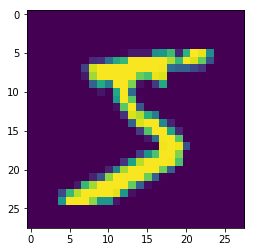

In [0]:
# Gathering Images from the real MNIST dataset
sample = X_train[0, ...].reshape(1, 28, 28, 1)
plt.imshow(sample[0, :, :, 0])
plt.show()

In [0]:
encoded = ae.encode(sample)

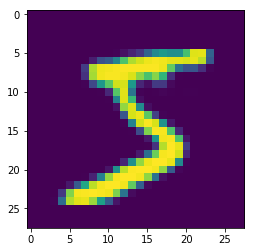

In [0]:
plt.imshow(ae.generate(encoded)[0, :, :, 0])
plt.show()

In [0]:
# Defining the interpolation points
from scipy import interpolate 

# Random end
# end = dcgan.prior(1)
# Fixed end
end = np.ones_like(dcgan.prior(1))[0]
# Interpolation Function
f_interp = interpolate.interp1d(encoded[0, :], end)
# Interpolation points
points = np.linspace(encoded[0, :], end, num=10, endpoint=True)

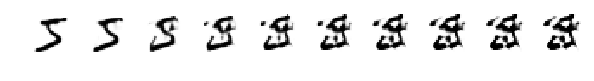

In [0]:
show(ae.generate(points))

Nice, this means that the AutoEncoder actually works but doesn't map everything nicely!

It would be really cool to actually see where there are legit examples and where, instead, the images are messed up. However to do this we would need a neural network trained on MNIST and the bad examples too. It would be a 11-way classification with the 11th class being the bad examples. Probem: How to get all the types of bad examples? 

## [2.1] Comparison of samples

DCGAN samples


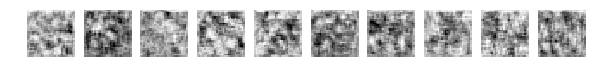

Autoencoding GAN samples


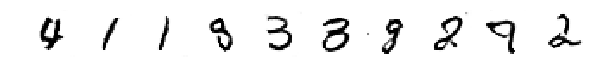

Autoencoder samples


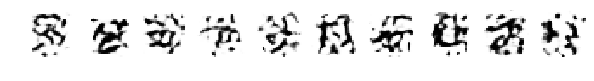

In [0]:
dcgan = DCGAN(Uniform(100), )

# Show generated samples
print('DCGAN samples')
show(dcgan.generate(dcgan.prior(10)))

print('Autoencoding GAN samples')
show(aegan.generate(dcgan.prior(10)))

print('Autoencoder samples')
show(ae.generate(dcgan.prior(10)))

Not working at all $ \downarrow$

In [0]:
# Reconstruction error

print('# [2] Comparison of Reconstruction error MSE(Decode(Encode(images)))')

samples = X_test[:10]

def reconstruction_exp(enc, dec):
    reconstruction = dec(enc(samples))
    show(reconstruction)
    return np.square(reconstruction-samples).mean()
    


# print('DCGAN + gradient descent: ', reconstruction_exp(dcgan.invert, dc.generate))
print('DCGAN + trained encoder: ', reconstruction_exp(dcgan.encode, dc.generate))
print('Autoencoding GAN: ', reconstruction_exp(ae.encode, ae.generate))
print('Autoencoder: ', reconstruction_exp(ae.encode, ae.generate))



## [2.2] filling image patches Show samples that are filled with gan vs autoencoder


In [0]:
# TODO


## [2.3] interpolating Show interpolations in latent space with gan and autoencoder Are the sets of encoded modes convex sets?


In [0]:
# Defining the interpolation points
from scipy import interpolate 

# Random (start, end)
start, end = dcgan.prior(2)
# Fixed (start, end)
# start, end = np.ones_like(dcgan.prior(1))[0], np.zeros_like(dcgan.prior(1))[0]
# Interpolation Function
f_interp = interpolate.interp1d(start, end)
# Interpolation points
points = np.linspace(start, end, num=10, endpoint=True)

DCGAN samples


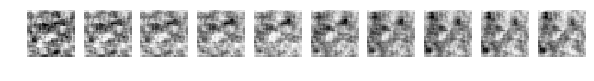

Autoencoding GAN samples


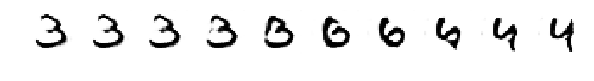

Autoencoder samples


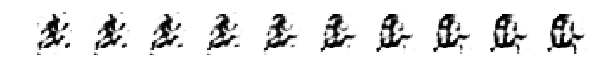

In [0]:
print('DCGAN samples')
show(dcgan.generate(points))

print('Autoencoding GAN samples')
show(aegan.generate(points))

print('Autoencoder samples')
show(ae.generate(points))

### Trying to filter out the bad samples with GAN

In [0]:
random_points = ae.generate(np.random.rand(40000, 100))

In [0]:
discriminant = aegan.discriminate(random_points).T[0]

In [0]:
bad_points = random_points[discriminant==0, ...]
# Explicitely maxing it out to 10K samples
bad_points = bad_points[:10000, ...]

In [0]:
bad_points.shape

(10000, 28, 28, 1)

Generating the **dataset** with **bad examples**

In [0]:
(BX_train, BY_train), (BX_test, BY_test) = mnist.load_data()

# Rescale -1 to 1
BX_train = BX_train / 127.5 - 1.
BX_test = BX_test / 127.5 - 1.

BX_train = np.reshape(BX_train, [-1, 28, 28, 1])
BX_test = np.reshape(BX_test, [-1, 28, 28, 1])

In [0]:
bad_train = bad_points[:6000, ...]
bad_test = bad_points[6000:, ...]

In [0]:
bad_labels_train = (np.zeros(bad_train.shape[0])+10).astype(int)
bad_labels_test = (np.zeros(bad_test.shape[0])+10).astype(int)

In [0]:
BX_train = np.vstack([BX_train, bad_train])
BX_test = np.vstack([BX_test, bad_test])

In [0]:
BY_train = np.hstack([BY_train, bad_labels_train])
BY_test = np.hstack([BY_test, bad_labels_test])

In [0]:
set(BY_test)

{0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10}

### Training the 11-way Classifier Neural Net

In [0]:
import tensorflow as tf
from tensorflow.keras import layers


def Classifier():
  model = tf.keras.Sequential()

  model.add(layers.Conv2D(64, (5, 5), strides=(2, 2), padding='same', input_shape=[28, 28, 1]))
  model.add(layers.LeakyReLU())
  model.add(layers.Dropout(0.3))

  model.add(layers.Conv2D(128, (5, 5), strides=(2, 2), padding='same'))
  model.add(layers.LeakyReLU())
  model.add(layers.Dropout(0.3))
  
  model.add(layers.Flatten())
  model.add(layers.Dense(11, activation='softmax'))
  
  return model

In [0]:
classifier = Classifier()
classifier.compile(loss=tf.keras.losses.categorical_crossentropy,
                   optimizer=tf.keras.optimizers.Adam(1e-4), 
                   metrics=['accuracy'])

In [0]:
from tensorflow.keras.utils import to_categorical
train_labels_binary = to_categorical(BY_train)
test_labels_binary = to_categorical(BY_test)

In [0]:
train_labels_binary.shape

(66000, 11)

In [0]:
classifier.fit(BX_train, 
               train_labels_binary,
               batch_size=64,
               epochs=20,
               verbose=1)

Epoch 1/20
66000/66000 [==============================] - 11s 163us/sample - loss: 0.4764 - acc: 0.8659
Epoch 2/20
66000/66000 [==============================] - 10s 155us/sample - loss: 0.2044 - acc: 0.9403
Epoch 3/20
66000/66000 [==============================] - 10s 156us/sample - loss: 0.1457 - acc: 0.9570
Epoch 4/20
66000/66000 [==============================] - 10s 155us/sample - loss: 0.1128 - acc: 0.9667
Epoch 5/20
66000/66000 [==============================] - 10s 156us/sample - loss: 0.0953 - acc: 0.9716
Epoch 6/20
66000/66000 [==============================] - 10s 156us/sample - loss: 0.0850 - acc: 0.9749
Epoch 7/20
66000/66000 [==============================] - 10s 156us/sample - loss: 0.0788 - acc: 0.9767
Epoch 8/20
66000/66000 [==============================] - 10s 155us/sample - loss: 0.0713 - acc: 0.9783
Epoch 9/20
66000/66000 [==============================] - 10s 157us/sample - loss: 0.0672 - acc: 0.9790
Epoch 10/20
66000/66000 [==============================] - 11s 1

In [0]:
score = classifier.evaluate(BX_test, test_labels_binary, verbose=1)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

14000/14000 [==============================] - 2s 134us/sample - loss: 0.0295 - acc: 0.9904
Test loss: 0.029475856286814404
Test accuracy: 0.99042857


Save the 11-way classifier

In [0]:
from tensorflow.keras.models import save_model
save_model(classifier,  mPath+'11classifier', include_optimizer=True)

Load the 11-way classifier

In [0]:
from tensorflow.keras.models import load_model
classifier = load_model(mPath+'11classifier', compile=True)

W0704 09:27:45.913626 140652892645248 deprecation.py:506] From /usr/local/lib/python3.6/dist-packages/tensorflow/python/ops/init_ops.py:97: calling GlorotUniform.__init__ (from tensorflow.python.ops.init_ops) with dtype is deprecated and will be removed in a future version.
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
W0704 09:27:45.923994 140652892645248 deprecation.py:506] From /usr/local/lib/python3.6/dist-packages/tensorflow/python/ops/init_ops.py:97: calling Zeros.__init__ (from tensorflow.python.ops.init_ops) with dtype is deprecated and will be removed in a future version.
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor


### Testing the Classifier

In [0]:
image = 61000

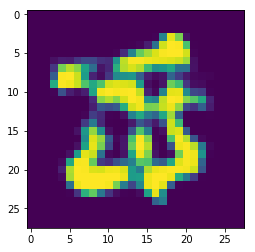

In [0]:
plt.imshow(BX_train[image, :, :, 0])

In [0]:
nine = BX_train[image, ...].reshape(1, -28, 28, 1)
classifier.predict(nine).argmax(1)

array([10])

Testing on interpolated images

Images to be classified


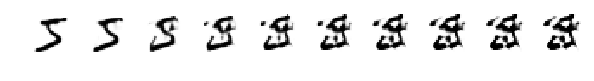

In [0]:
print('Images to be classified')
show(ae.generate(points))

In [0]:
classifier.predict(ae.generate(points)).argmax(1)

array([ 5,  5,  3, 10, 10, 10, 10, 10, 10, 10])

### Spanning a slice of the AutoEncoder latent space

In [0]:
# Pick random features in the prior
prior_d = dcgan.prior(1).shape[1]
d1, d2 = np.random.randint(0, prior_d, size=2)
d1, d2

(29, 72)

In [0]:
sqrt_n_samples = 20
grid = make_2Dgrid(sqrt_n_samples)
grid.shape

(400, 2)

In [0]:
latent_points = np.random.rand(grid.shape[0], prior_d)
latent_points[:, d1] = grid[:, 0]
latent_points[:, d2] = grid[:, 1]

In [0]:
fake = ae.generate(latent_points)
fake.shape

(400, 28, 28, 1)

In [0]:
classification = classifier.predict(fake)
classification.shape

(400, 11)

In [0]:
labels = np.argmax(classification, axis=1)
labels.shape

(400,)

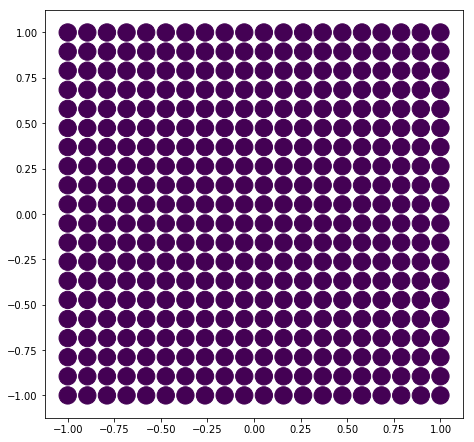

In [0]:
plt.figure(figsize=(7.5, 7.5))
plt.scatter(latent_points[:, d1], latent_points[:, d2], s=300, c=labels, marker='o')
plt.show()

It is **EXTREMELY** hard to find points in the AutoEncoder latent space that lead to images that look like digits.

New discovery: *the classifier must be trained every time the encoder is trained from scratch* because it is not able to generalize on two different autoencoders trained from scratch!

**IDEA**: In order to see something we could find a latent point that leads to a digit, then apply gaussian transformations on it so that we have points near it and then apply the grid slicing.

### Spanning a slice of a multivariate gaussian noise centered in a particular point

In [0]:
# Adding a gaussian noise to the latent points 
# that correspond to a real digit image in the 
# AutoEncoder latent space

n_samples = sqrt_n_samples**2
prior_shape = ae.prior(n_samples).shape
prior_shape

(400, 100)

Gaussian Noise

In [0]:
mean = np.zeros(prior_shape[1])
cov = np.eye(prior_shape[1])*0.05
gauss_noise = np.random.multivariate_normal(mean, cov, prior_shape[0])
gauss_noise.shape

(400, 100)

Particular Point encoded with Autoencoder

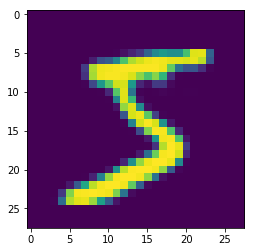

In [0]:
particular_point = points[0, :].reshape(1, -1)
particular_image = ae.generate(particular_point)
plt.imshow(particular_image[0, :, :, 0])

Space to be spanned

In [0]:
gauss_space = gauss_noise + particular_point

In [0]:
gauss_space.shape

(400, 100)

In [0]:
gauss_classification = classifier.predict(ae.generate(gauss_space))

gauss_labels = np.argmax(gauss_classification, axis=1)
gauss_labels.shape

(400,)

Let's see the generated images

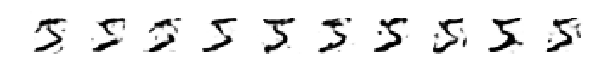

In [0]:
show(ae.generate(gauss_space[:10, :]))

In [0]:
gauss_labels[:10]

array([5, 5, 3, 5, 5, 3, 5, 5, 5, 3])

Not that nice to be honest

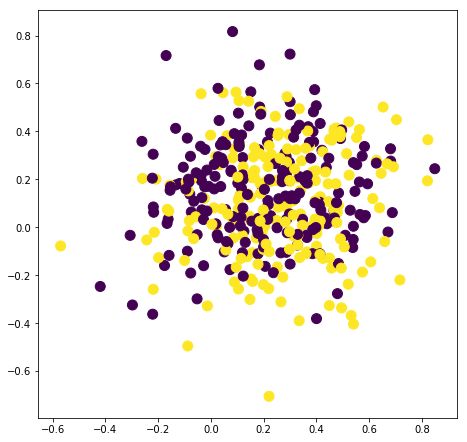

In [0]:
plt.figure(figsize=(7.5, 7.5))
plt.scatter(gauss_space[:, d1], gauss_space[:, d2], s=100, c=gauss_labels, marker='o')
plt.show()

## [2.4] feature extraction: linear classifier on encoded vs original problem, again with auto encoder vs gan



In order to do this we need believable examples. 

Right now the encoder is not outputting some messed up examples. How to filter out the bad examples? What about using the GAN discriminator? 

### [2.4.1] Encoded GAN

Generating the Fake Dataset

In [0]:
n_samples = 50000
latent_points = aegan.prior(n_samples)
image_points = aegan.generate(latent_points)

latent_points.shape, image_points.shape

((50000, 100), (50000, 28, 28, 1))

Loading the classifier

In [0]:
from tensorflow.keras.models import load_model
classifier = load_model(f"{PROJECT_PATH}/mnist_predictor.h5")

Generating labels

In [0]:
labels = classifier.predict(image_points)

In [0]:
labels = np.argmax(labels, axis=1)
labels.shape

(50000,)

Linear Classifier: Logistic Regression on Softmax.

In [0]:
N = latent_points.shape[0]

train_X = latent_points[int(N*0.2):, :]
train_y = labels[int(N*0.2):]

test_X = latent_points[:int(N*0.2), :]
test_y = labels[:int(N*0.2)]

In [0]:
test_y.shape

(10000,)

In [0]:
from sklearn.linear_model import LogisticRegression


softmax_logreg = LogisticRegression(random_state=0, solver='lbfgs', multi_class='multinomial')
softmax_logreg.fit(train_X, train_y)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='multinomial', n_jobs=None, penalty='l2',
                   random_state=0, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [0]:
prediction = softmax_logreg.predict(test_X)
prediction.shape

(10000,)

Metric **Results**

In [0]:
from sklearn import metrics

balanced_accuracy = metrics.balanced_accuracy_score(test_y, prediction)
print('balanced_accuracy:\n', balanced_accuracy, '\n')

f1 = metrics.f1_score(test_y, prediction, average=None)
print('f1:\n', f1, '\n')

recall = metrics.recall_score(test_y, prediction, average=None)
print('recall:\n', recall, '\n')

precision = metrics.precision_score(test_y, prediction, average=None)
print('precision:\n', precision, '\n')

balanced_accuracy:
 0.7908802263485981 

f1:
 [0.85247686 0.88289963 0.7804878  0.74233716 0.79634332 0.7347876
 0.85135757 0.80798479 0.73933103 0.71597633] 

recall:
 [0.8623348  0.89118199 0.78737233 0.74879227 0.80991736 0.72153326
 0.85727525 0.81495686 0.72923777 0.68620038] 

precision:
 [0.84284177 0.8747698  0.77372263 0.7359924  0.78321678 0.74853801
 0.84552102 0.80113101 0.7497076  0.74845361] 



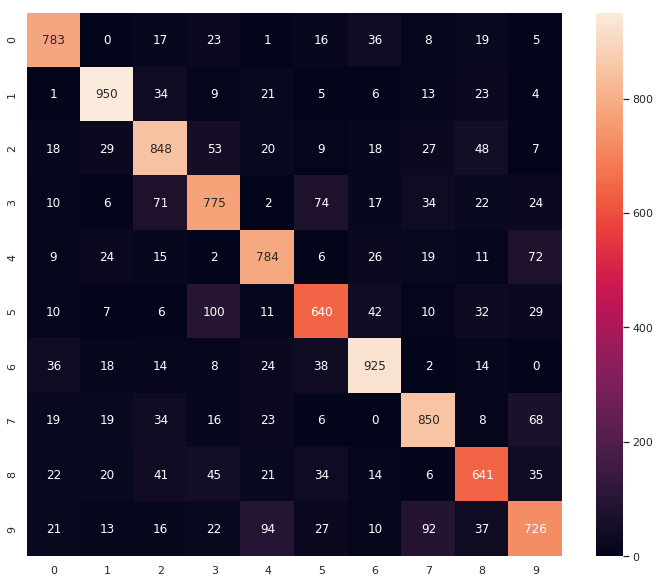

In [0]:
cf = metrics.confusion_matrix(test_y, prediction)

import seaborn as sns
sns.set()

plt.figure(figsize=(12, 10))
sns.heatmap(cf, annot=True, fmt="d")
plt.show()

### [2.4.2] TODO: USE LINEAR CLASSIFIER ON THE IMAGE SPACE TOO!

## [2.5] Are the sets that belong to a mode a convex set?

We could use a neural network to classify the examples and see wether the sets are convex or not using a grid. But still, we need believable examples. Moreover, we could see this only in with a two/three dimensional prior.

In [0]:
from tensorflow.keras.models import load_model
classifier = load_model(f"{PROJECT_PATH}/mnist_predictor.h5")

### [2.5.1] AutoEncoding GAN

In [0]:
import matplotlib.pyplot as plt

def make_2Dgrid(nd, show=False):
  ls = np.linspace(-1, 1, nd)

  grid = []
  for i1 in ls:
    for i2 in ls:
      grid.append([i1, i2]) 
  
  return np.array(grid)

**PCA** on the **Latent Space**

Finding the most important dimensions (not applied yet)

In [0]:
from sklearn.decomposition import PCA

pca = PCA(n_components=2)
pca.fit(X_flat) 
X_pca = pca.transform(X_flat)

Random Features from the Prior

In [0]:
# Pick random features in the prior
prior_d = dcgan.prior(1).shape[1]
d1, d2 = np.random.randint(0, prior_d, size=2)
d1, d2

(94, 78)

Prior Grid

In [0]:
grid = make_2Dgrid(20)
grid.shape

(400, 2)

In [0]:
latent_points = np.random.rand(grid.shape[0], prior_d)
latent_points[:, d1] = grid[:, 0]
latent_points[:, d2] = grid[:, 1]

In [0]:
fake = aegan.generate(latent_points)
fake.shape

(400, 28, 28, 1)

In [0]:
classification = classifier.predict(fake)
classification.shape

(400, 10)

In [0]:
labels = np.argmax(classification, axis=1)
labels.shape

(400,)

Showing the prior on the two chosen dimensions

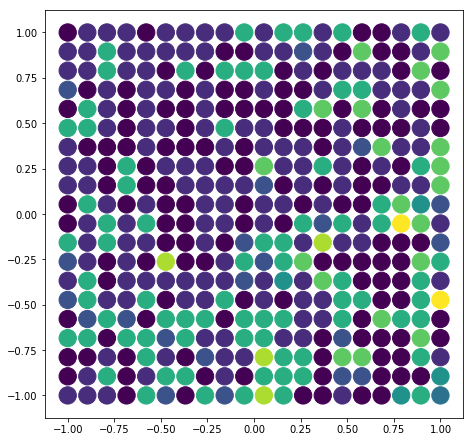

In [0]:
plt.figure(figsize=(7.5, 7.5))
plt.scatter(latent_points[:, d1], latent_points[:, d2], s=300, c=labels, marker='o')
plt.show()

As we can see, the sets are not convex.

That's weird, no 0 produced.

In [0]:
set(labels)

## [2.6] Are the sets that belong to a mode a solid set (meaning, are they somehow bounded or are they sparse)? Of course there must be a threshold of 'solidity' that enstablished when a set is solid and when it is not. Here I'm saying solidity but i pretty much refer to the transitive property.

In [0]:
# TODO

## [3] Show Decoded(z) for random z, poor quality

DCGAN


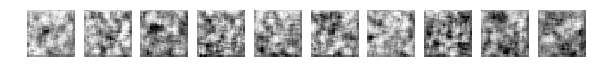

Autoencoding GAN


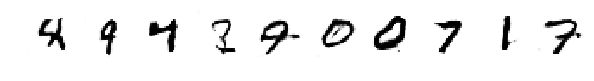

Autoencoder


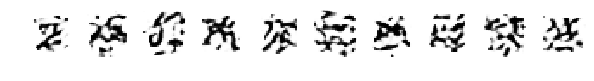

In [0]:
z = dcgan.prior(10)
print('DCGAN')
show(dcgan.generate(z))

print('Autoencoding GAN')
show(aegan.generate(z))

print('Autoencoder')
show(ae.generate(z))


# Autoencoding GAN

We can combine the GAN with an Autoencoder, where the generator is used as decoder. This can either be done by only training an additional encoder, or by training the generator to optimize both objectives, that of the autoencoder and that of the GAN setup.

We then have two different ways to invert a GAN, which we can compare. It will show that both methods yield quite different encodings, however yield in similar decoded images. This indicates that there are areas in z space that are all mapped to similar output in x space. Applying the difference of two encodings of the same image to another image shows, that the effect is here much bigger, which shows that the encodings don't differ in a dimension or length that the generator is in general invariant to, but that at different areas of the latent space, certain directions have a small gradient with respect to G.


## Train additional encoder without changing GAN training

W0629 19:08:07.837740 139810894927744 training.py:2197] Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
W0629 19:08:18.492857 139810894927744 training.py:2197] Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
W0629 19:08:21.800095 139810894927744 training.py:2197] Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?


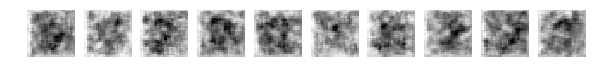

Train reconstruction


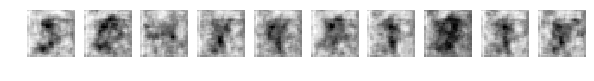

Original Train


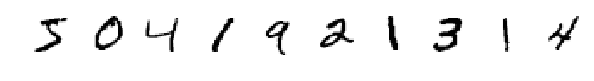

Test reconstruction


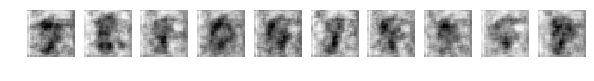

Original Test


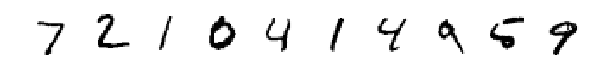

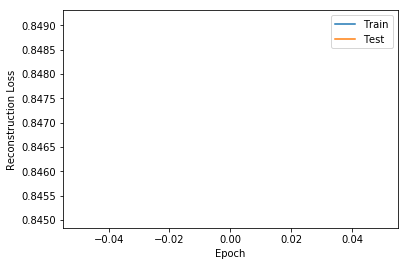

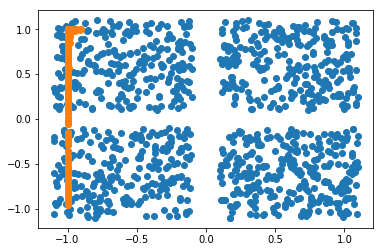

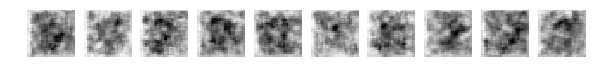

Train reconstruction


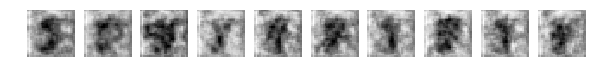

Original Train


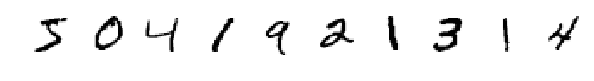

Test reconstruction


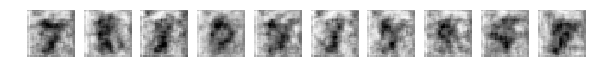

Original Test


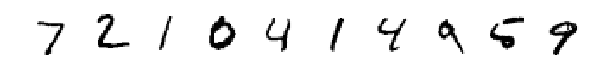

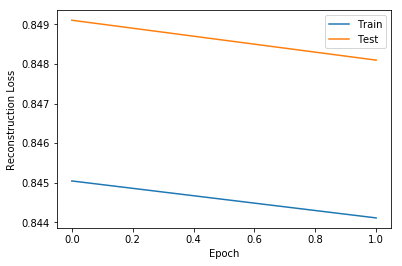

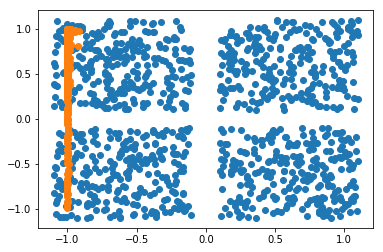

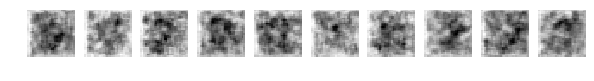

Train reconstruction


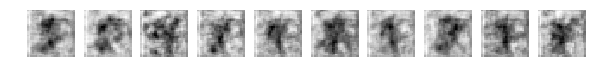

Original Train


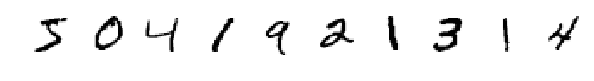

Test reconstruction


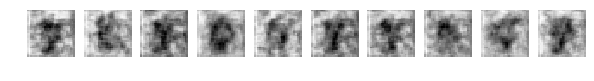

Original Test


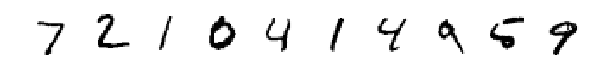

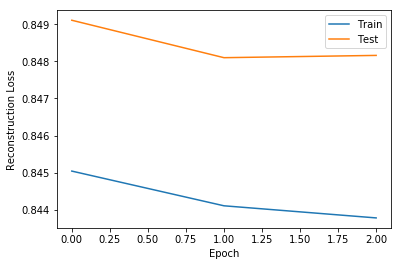

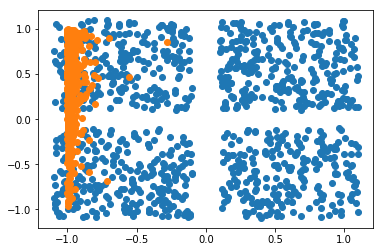

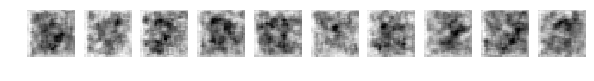

Train reconstruction


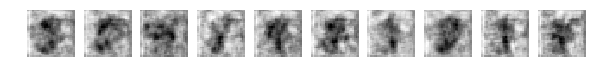

Original Train


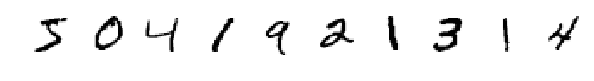

Test reconstruction


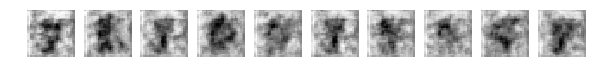

Original Test


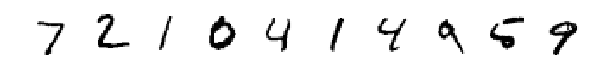

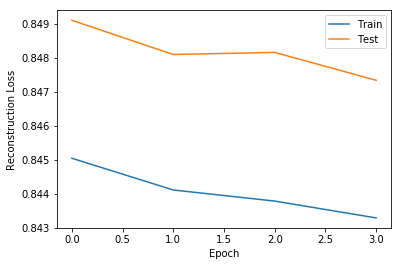

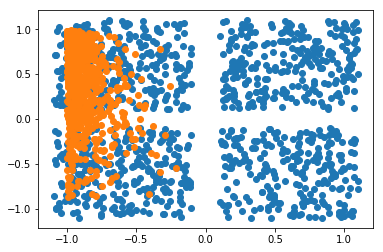

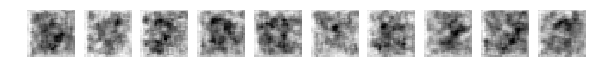

Train reconstruction


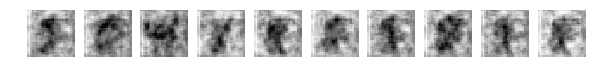

Original Train


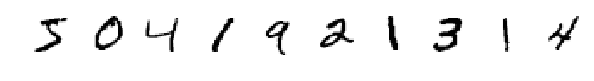

Test reconstruction


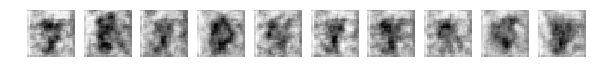

Original Test


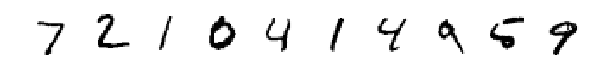

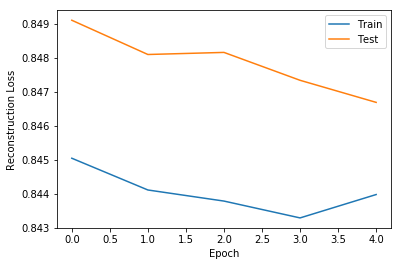

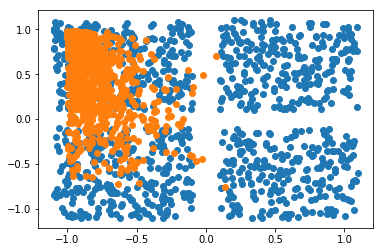

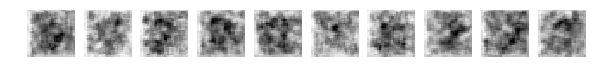

Train reconstruction


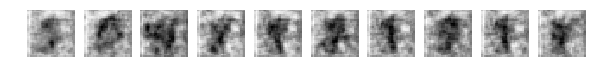

Original Train


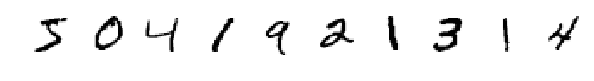

Test reconstruction


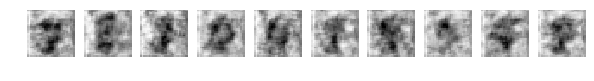

Original Test


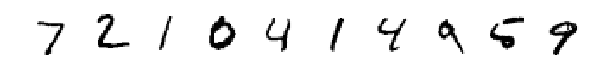

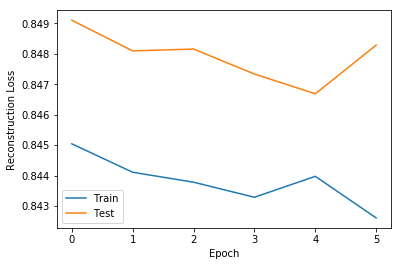

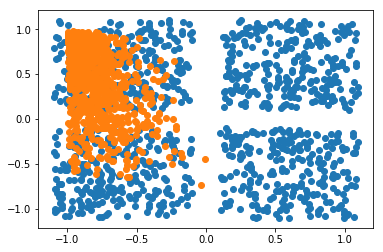

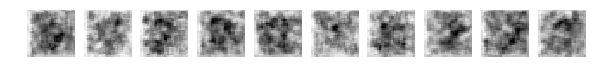

Train reconstruction


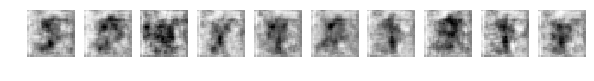

Original Train


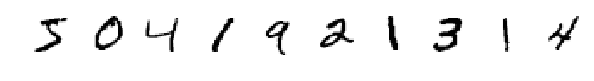

Test reconstruction


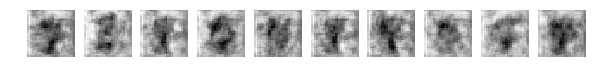

Original Test


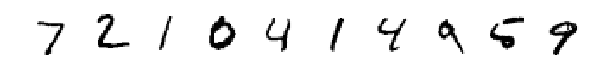

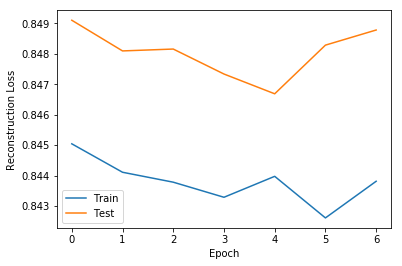

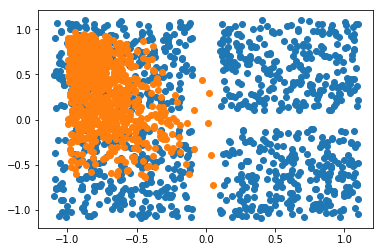

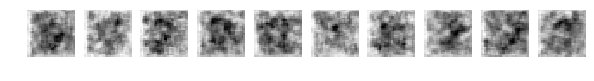

Train reconstruction


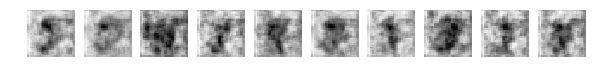

Original Train


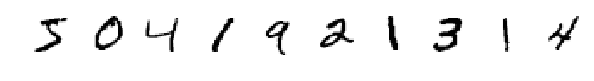

Test reconstruction


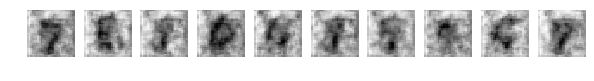

Original Test


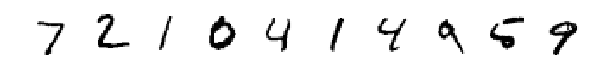

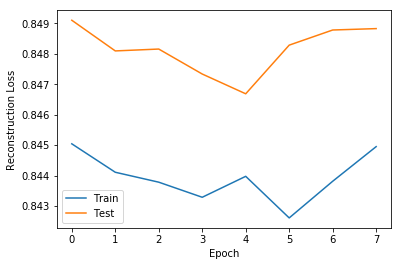

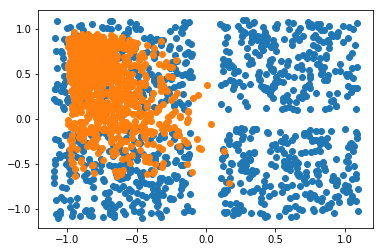

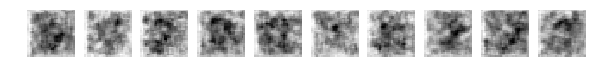

Train reconstruction


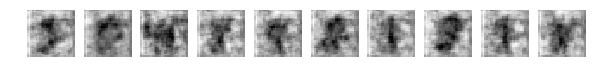

Original Train


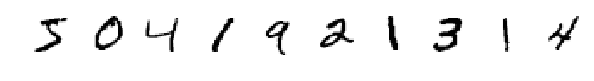

Test reconstruction


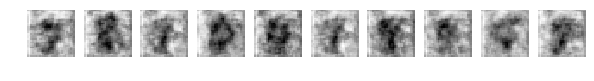

Original Test


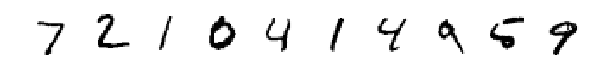

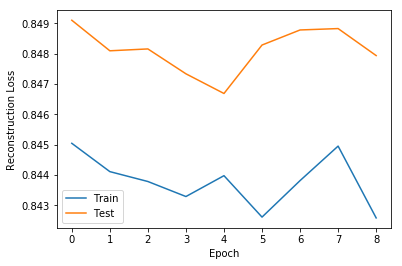

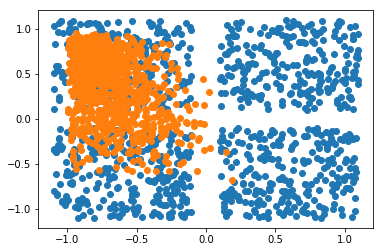

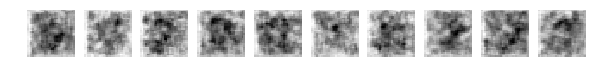

Train reconstruction


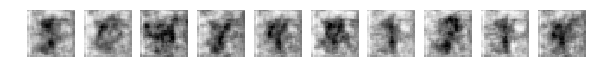

Original Train


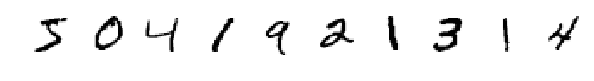

Test reconstruction


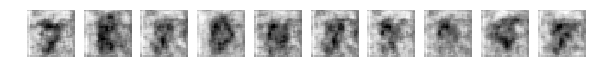

Original Test


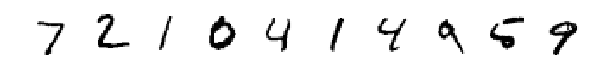

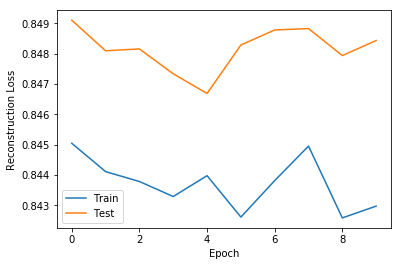

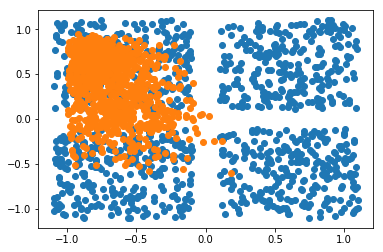

In [0]:
aegan = AutoencodingGAN(gan.Unconnected(100))

period = 10
overfitting_measure = OverfittingCallback(aegan, X_train[:100], X_test[:100], Inverser=aegan.encode)
inverse_distribution = InverseDistributionCallback(aegan, X_test[:1000], inverse=aegan.encode, show_samples=False)

train_callbacks = [
    (callbacks.EvolvingImageCallback(aegan).plot, 1),
    (overfitting_measure.track, 1),
    (overfitting_measure.plot, 1),
    (inverse_distribution.plot, 1)
]

aegan.train(X_train, epochs=10, batch_size=128, callbacks=train_callbacks, d_steps=5)

## Include generator in Aeutoencder training

Training AutoencodingGAN


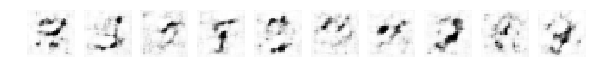

Train reconstruction


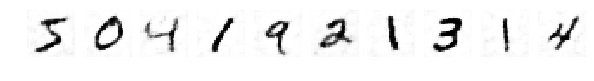

Original Train


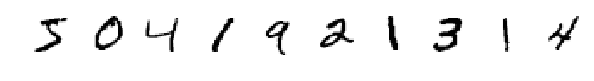

Test reconstruction


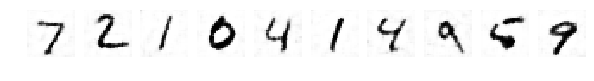

Original Test


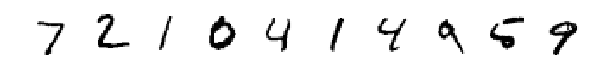

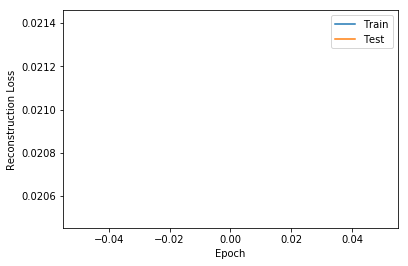

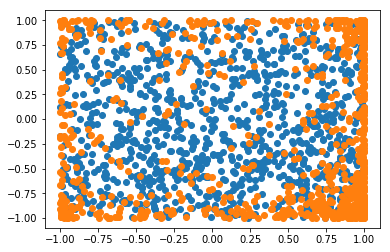

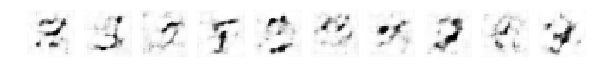

Train reconstruction


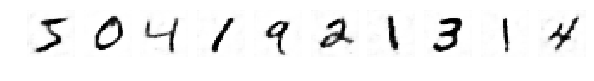

Original Train


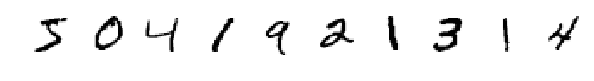

Test reconstruction


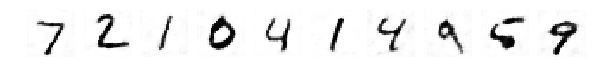

Original Test


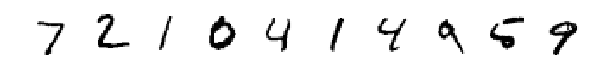

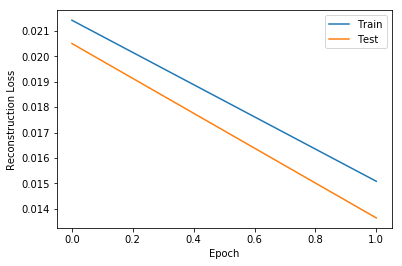

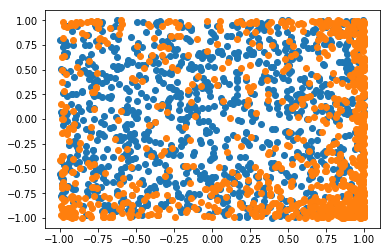

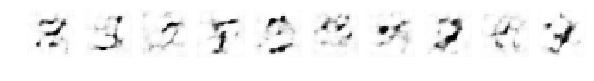

Train reconstruction


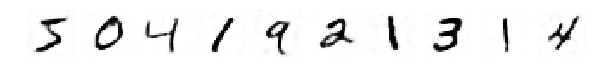

Original Train


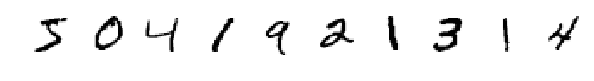

Test reconstruction


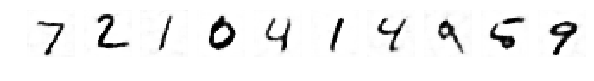

Original Test


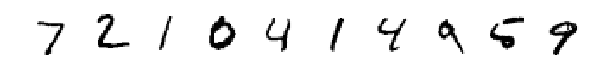

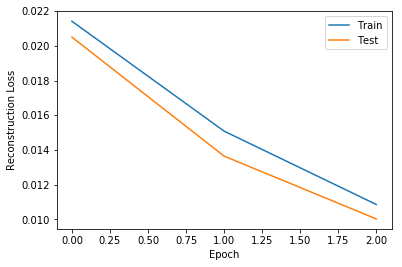

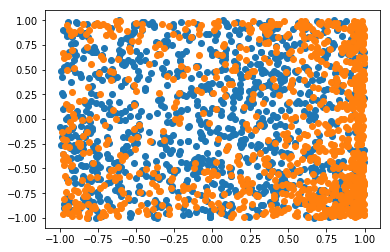

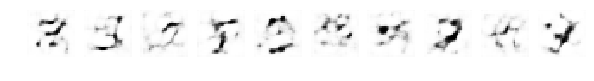

Train reconstruction


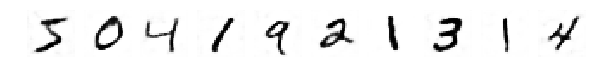

Original Train


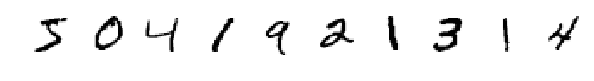

Test reconstruction


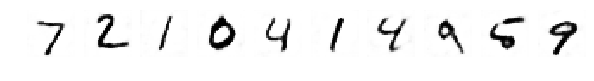

Original Test


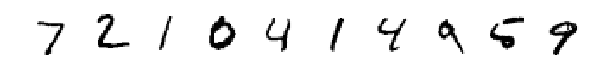

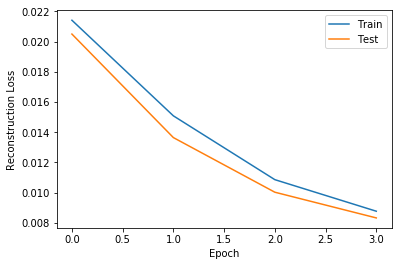

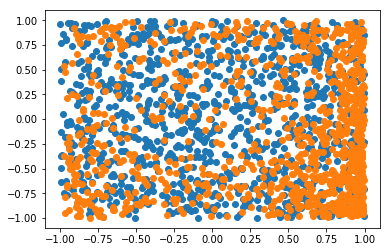

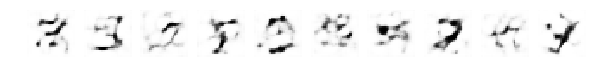

Train reconstruction


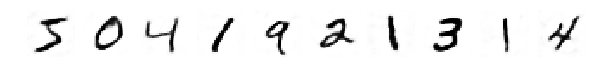

Original Train


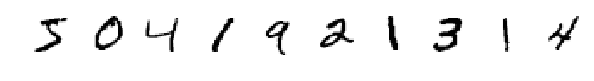

Test reconstruction


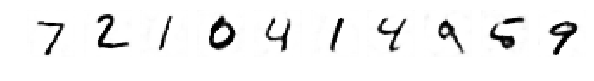

Original Test


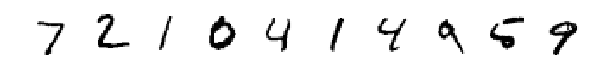

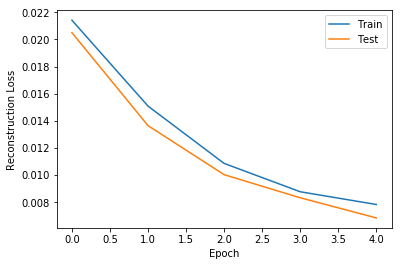

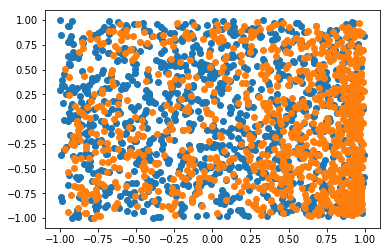

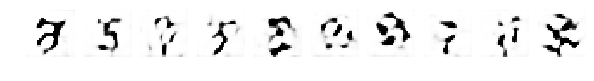

Train reconstruction


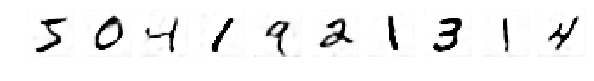

Original Train


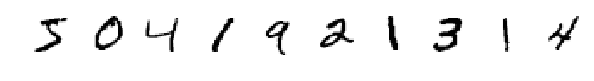

Test reconstruction


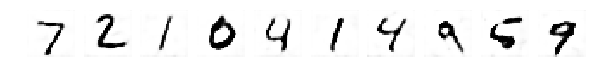

Original Test


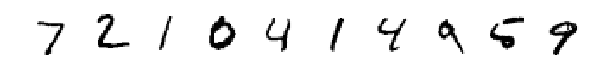

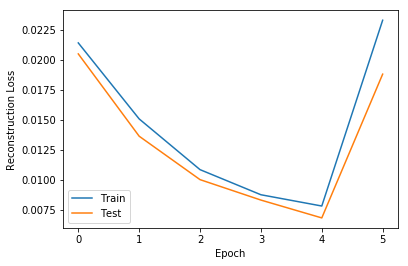

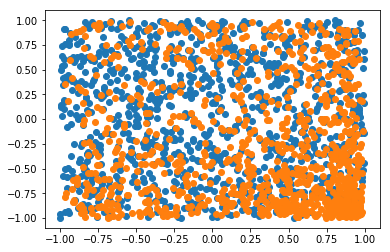

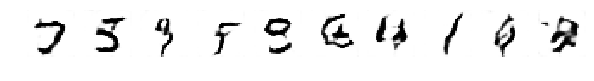

Train reconstruction


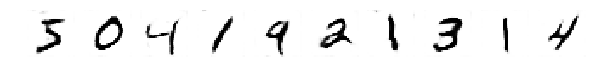

Original Train


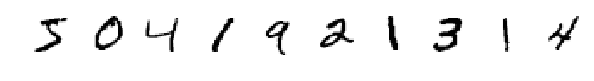

Test reconstruction


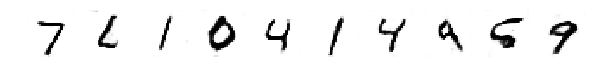

Original Test


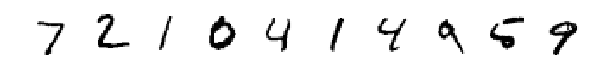

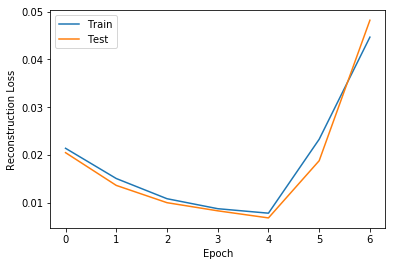

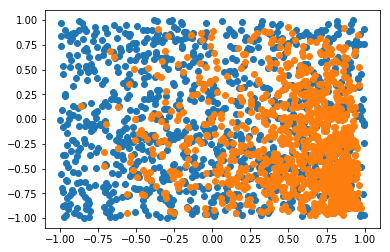

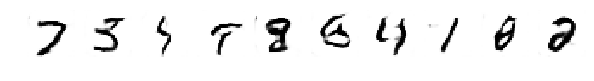

Train reconstruction


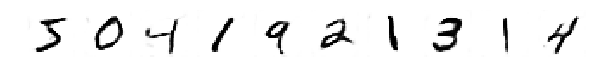

Original Train


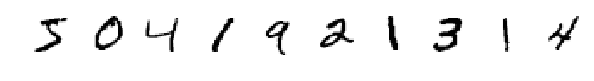

Test reconstruction


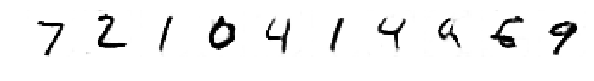

Original Test


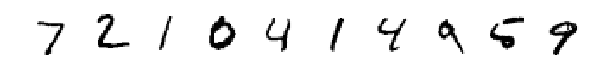

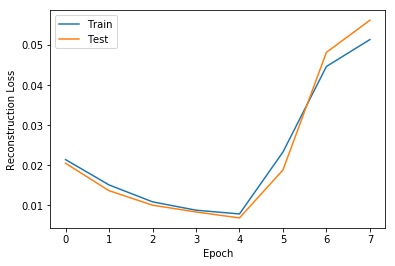

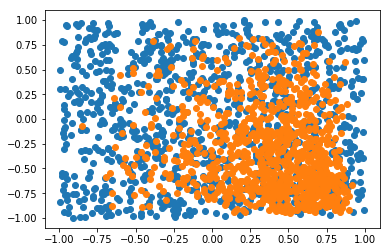

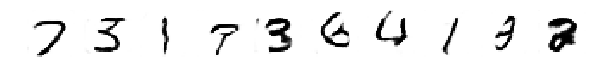

Train reconstruction


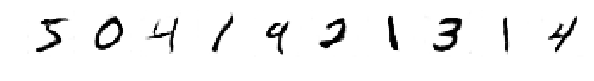

Original Train


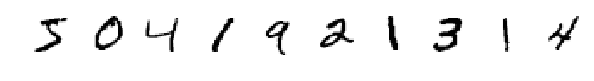

Test reconstruction


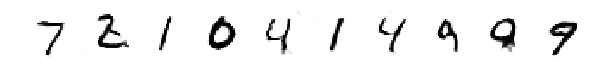

Original Test


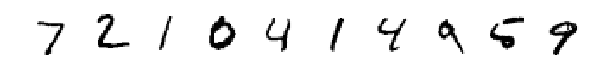

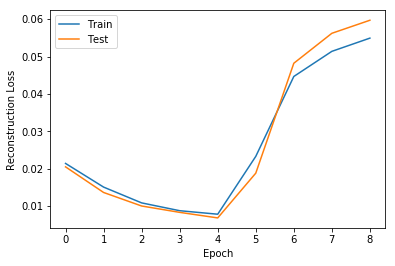

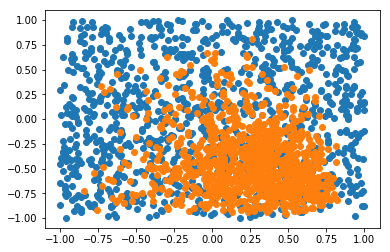

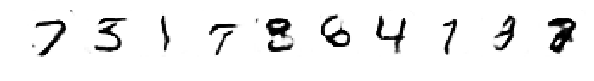

Train reconstruction


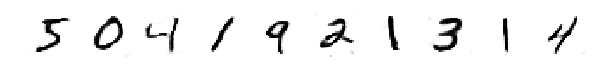

Original Train


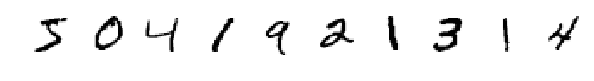

Test reconstruction


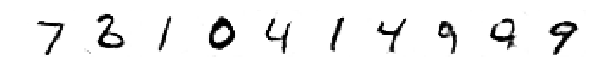

Original Test


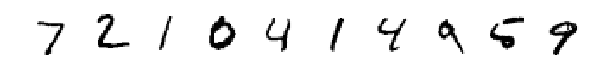

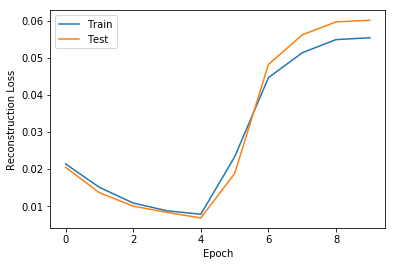

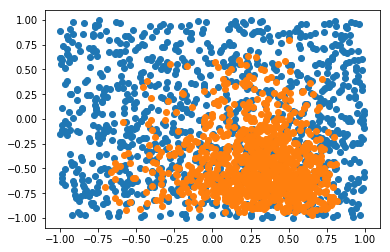

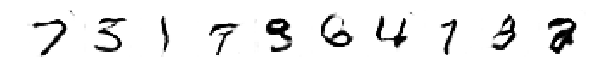

Train reconstruction


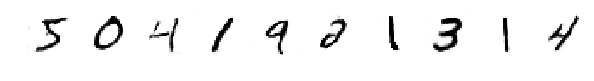

Original Train


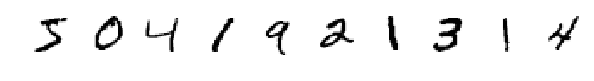

Test reconstruction


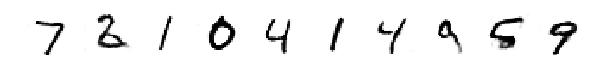

Original Test


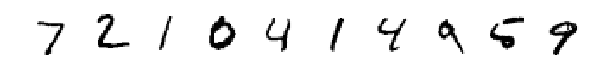

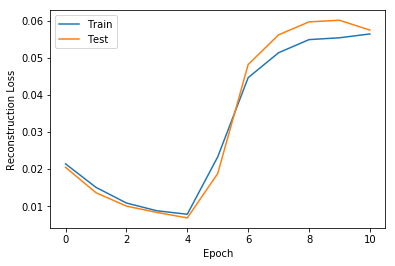

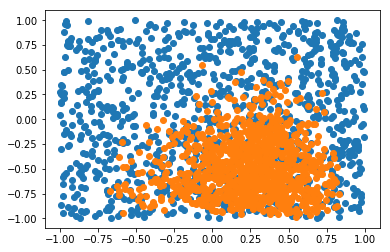

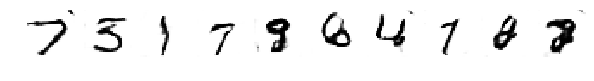

Train reconstruction


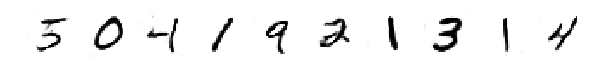

Original Train


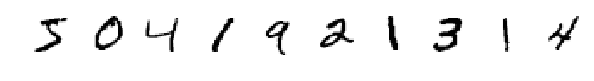

Test reconstruction


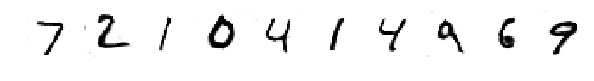

Original Test


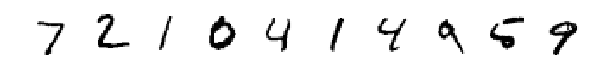

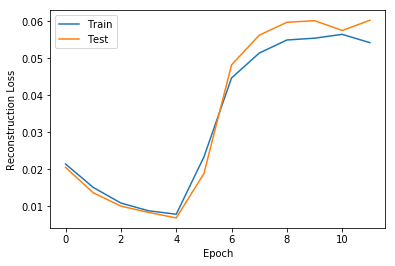

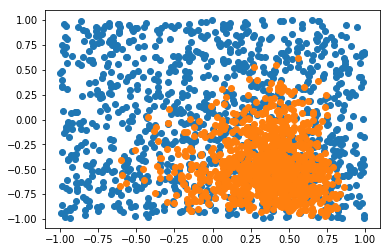

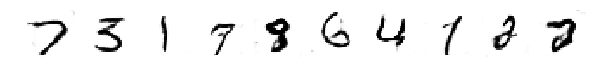

Train reconstruction


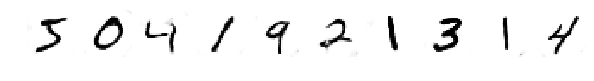

Original Train


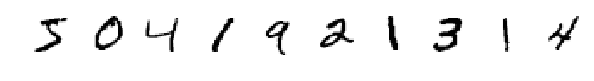

Test reconstruction


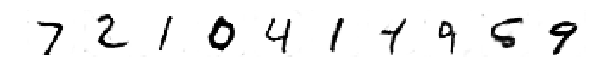

Original Test


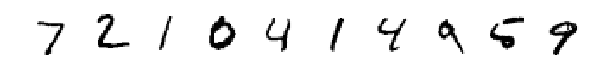

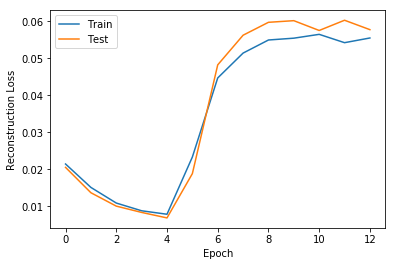

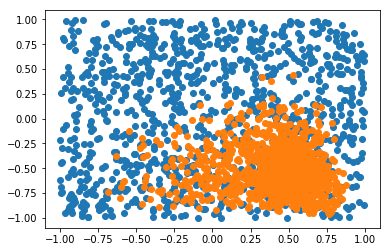

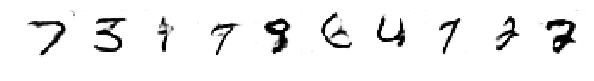

Train reconstruction


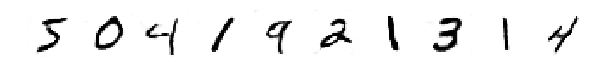

Original Train


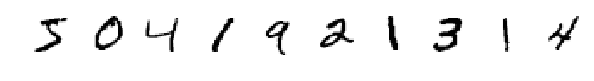

Test reconstruction


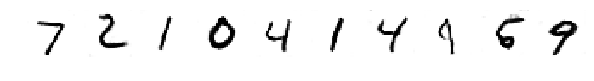

Original Test


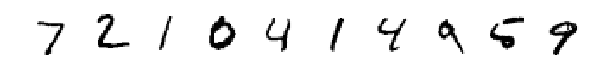

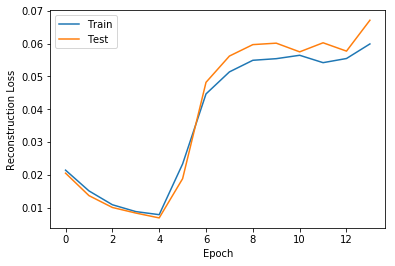

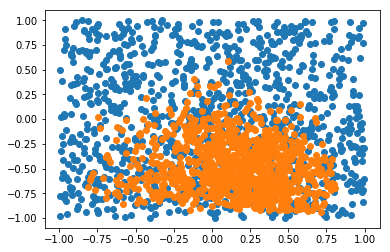

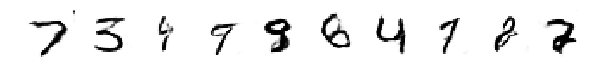

Train reconstruction


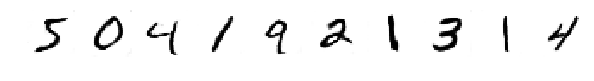

Original Train


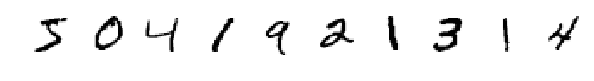

Test reconstruction


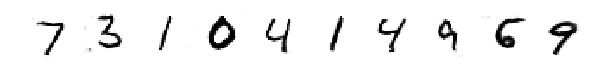

Original Test


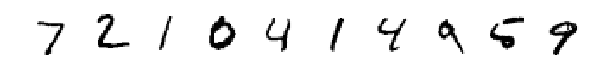

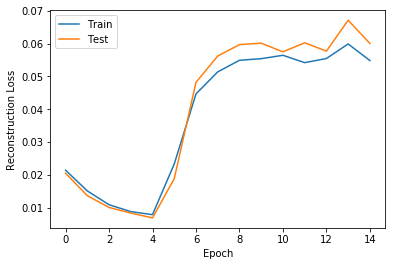

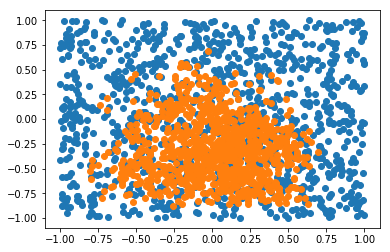

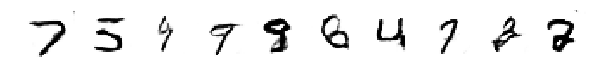

Train reconstruction


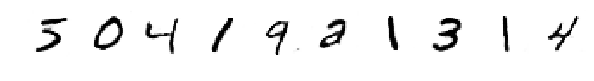

Original Train


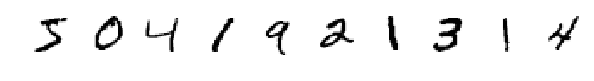

Test reconstruction


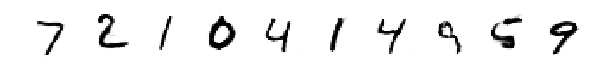

Original Test


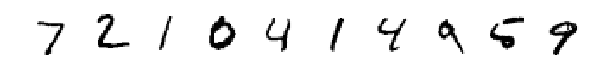

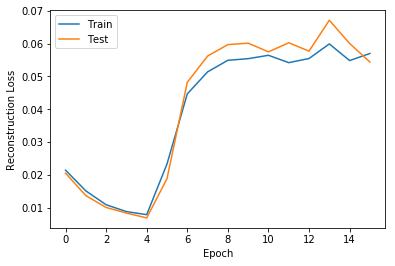

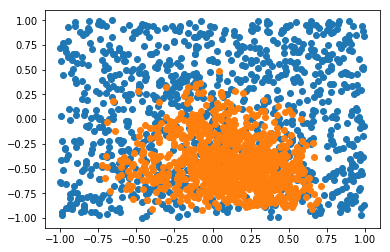

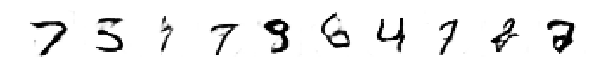

Train reconstruction


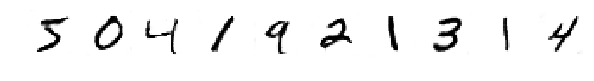

Original Train


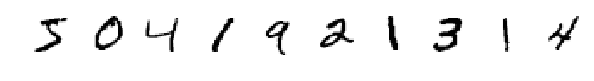

Test reconstruction


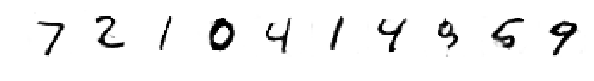

Original Test


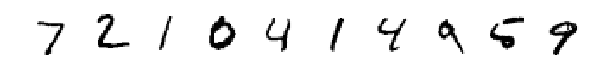

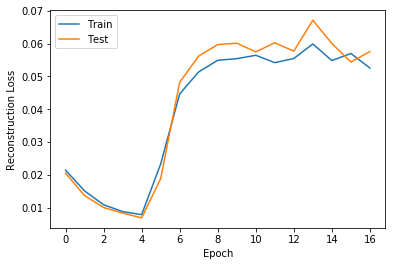

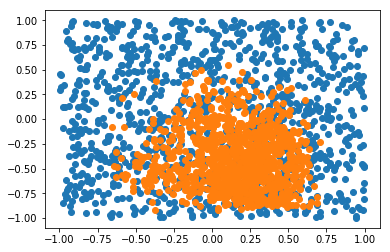

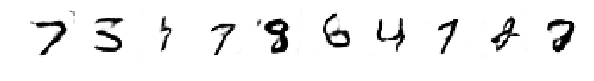

Train reconstruction


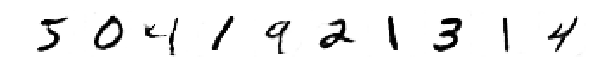

Original Train


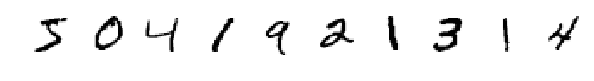

Test reconstruction


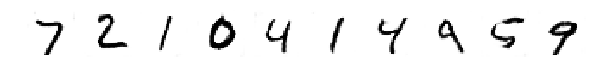

Original Test


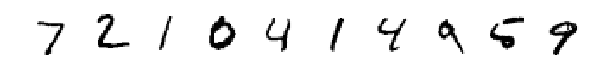

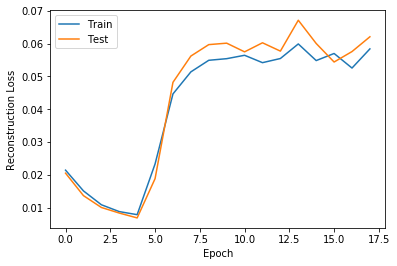

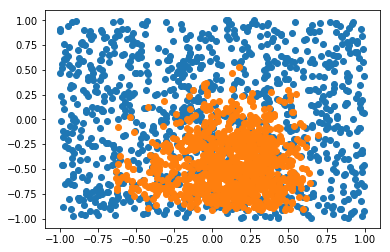

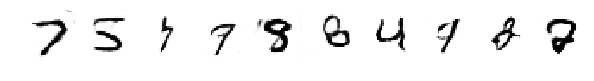

Train reconstruction


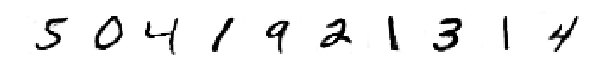

Original Train


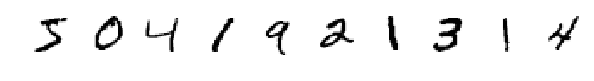

Test reconstruction


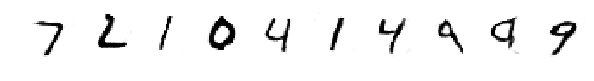

Original Test


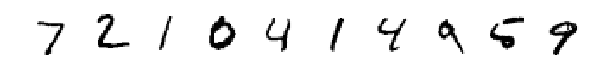

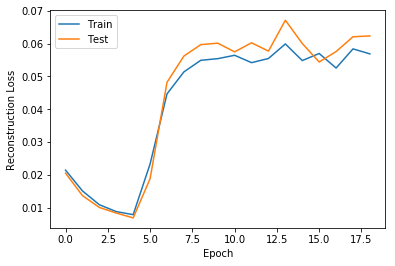

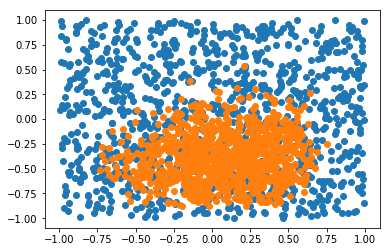

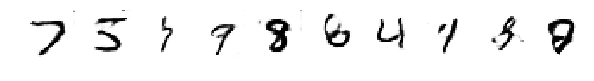

Train reconstruction


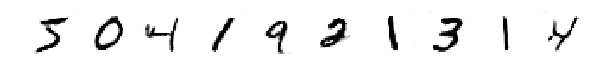

Original Train


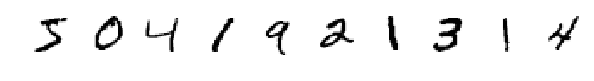

Test reconstruction


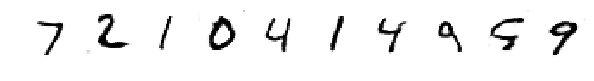

Original Test


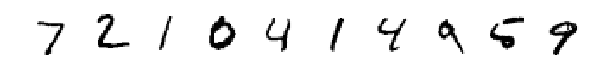

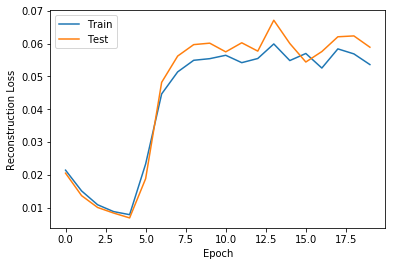

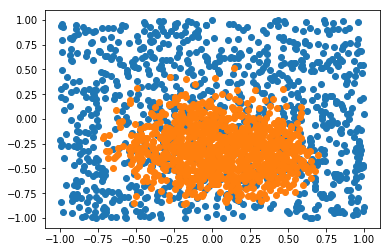

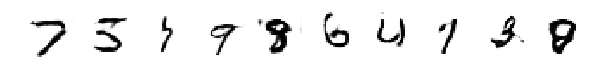

Train reconstruction


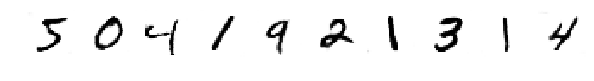

Original Train


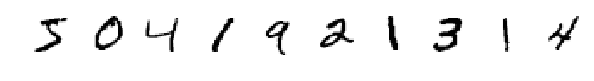

Test reconstruction


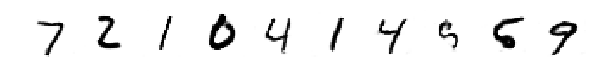

Original Test


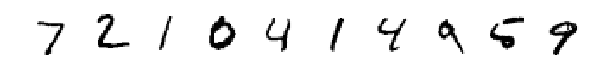

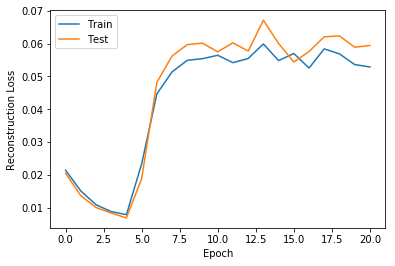

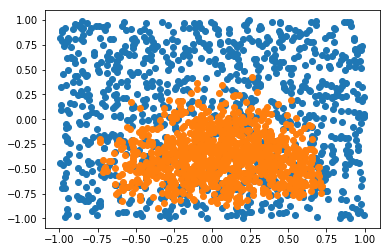

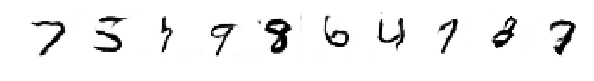

Train reconstruction


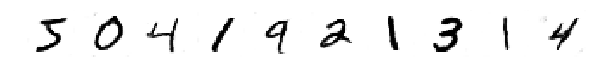

Original Train


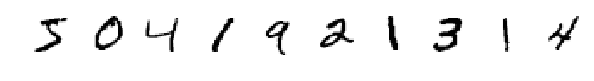

Test reconstruction


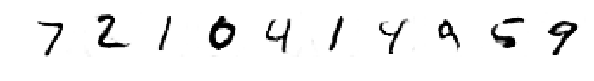

Original Test


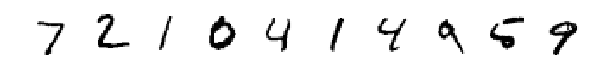

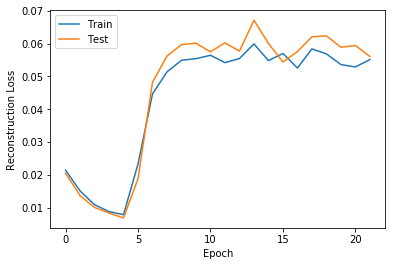

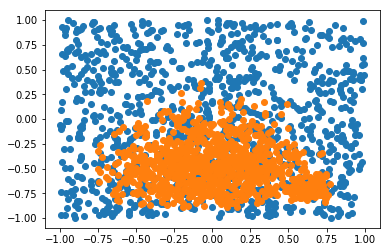

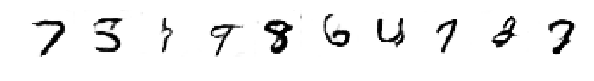

Train reconstruction


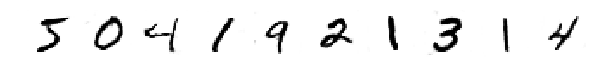

Original Train


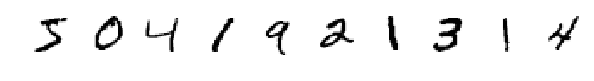

Test reconstruction


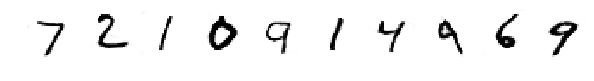

Original Test


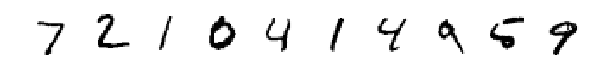

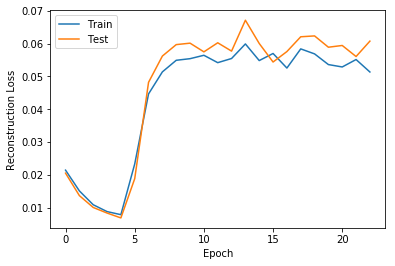

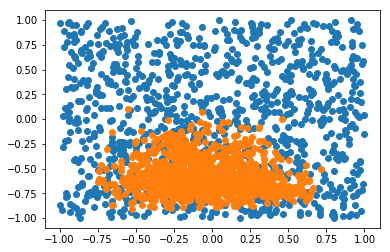

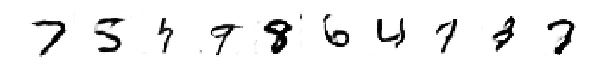

Train reconstruction


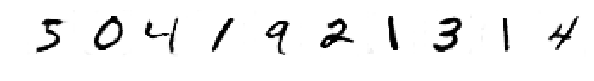

Original Train


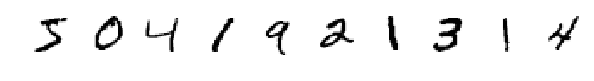

Test reconstruction


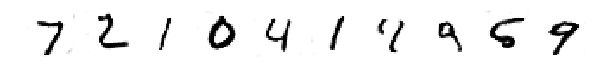

Original Test


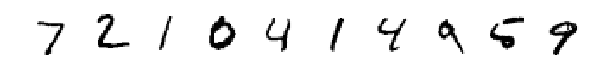

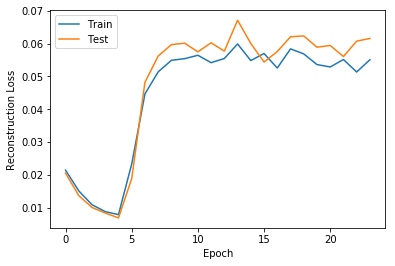

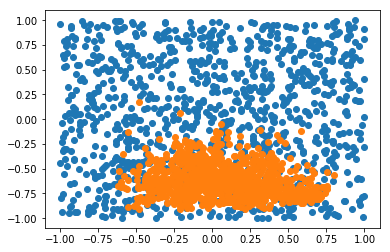

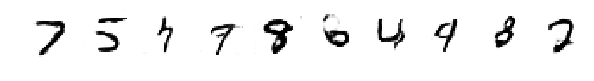

Train reconstruction


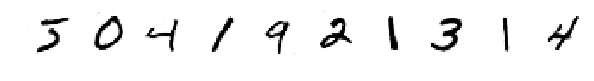

Original Train


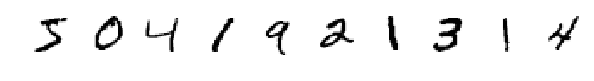

Test reconstruction


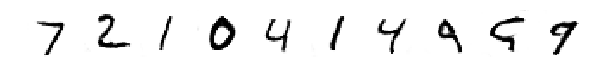

Original Test


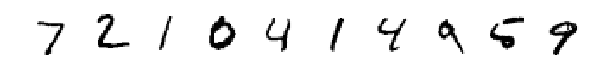

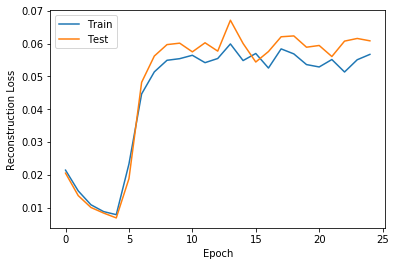

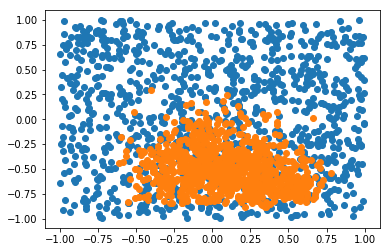

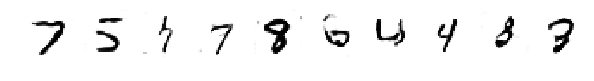

Train reconstruction


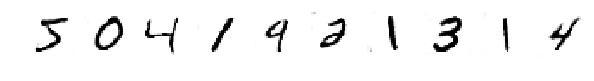

Original Train


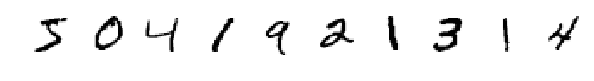

Test reconstruction


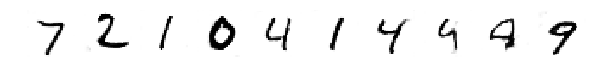

Original Test


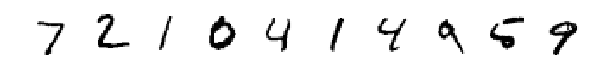

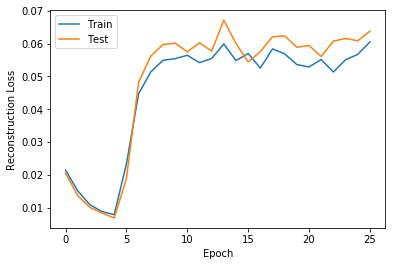

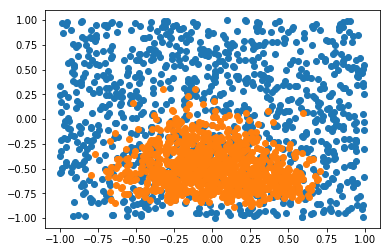

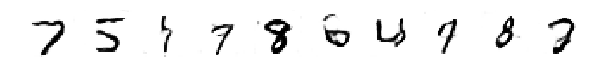

Train reconstruction


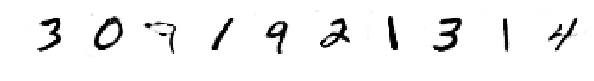

Original Train


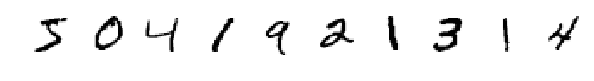

Test reconstruction


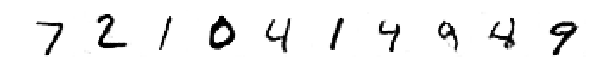

Original Test


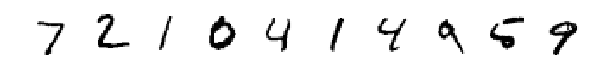

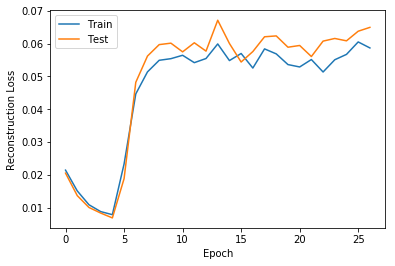

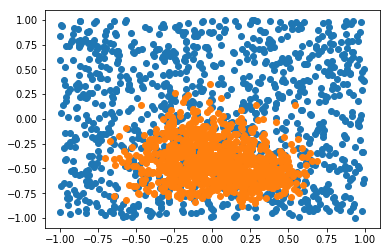

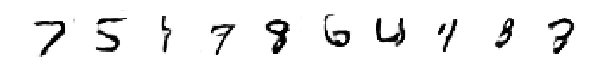

Train reconstruction


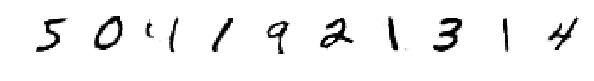

Original Train


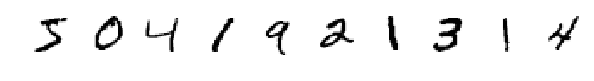

Test reconstruction


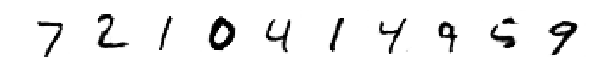

Original Test


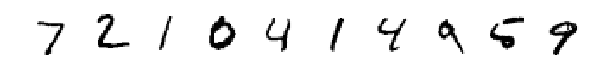

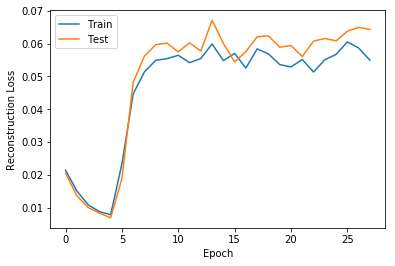

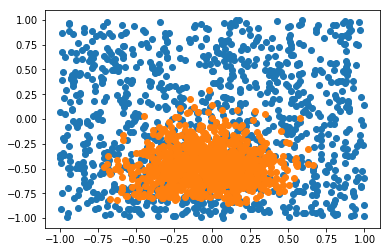

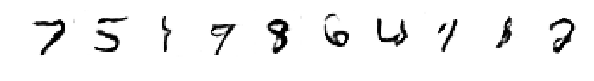

Train reconstruction


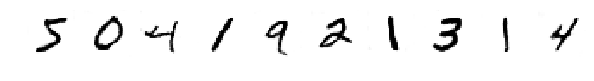

Original Train


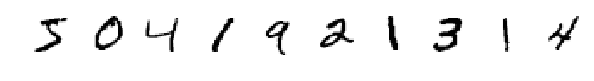

Test reconstruction


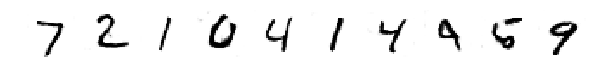

Original Test


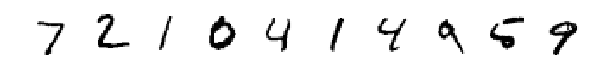

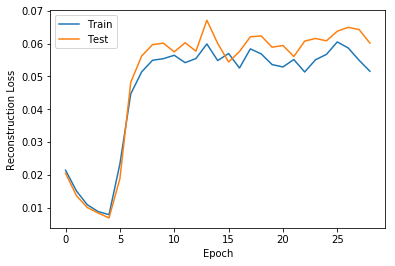

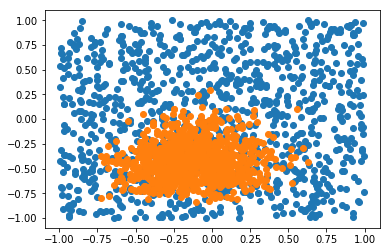

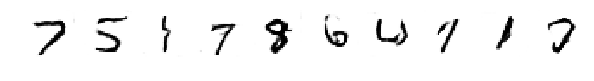

Train reconstruction


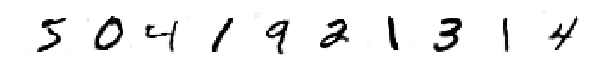

Original Train


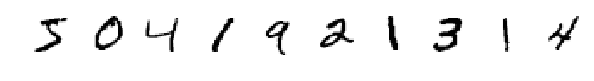

Test reconstruction


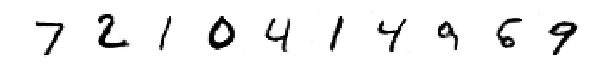

Original Test


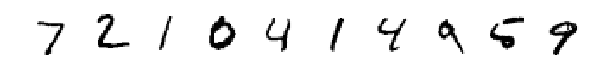

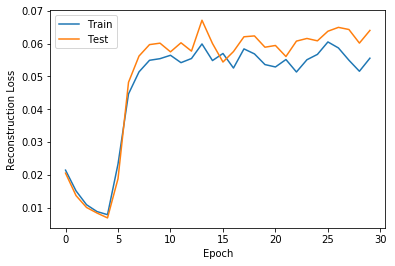

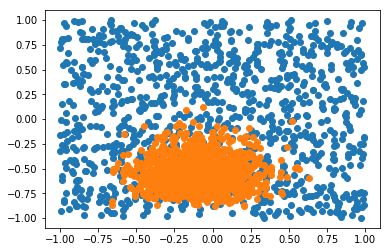

In [0]:
aegan = AutoencodingGAN(Uniform(100), train_decoder=True)

period = 10
overfitting_measure = OverfittingCallback(aegan, X_train[:100], X_test[:100], Inverser=aegan.encode)
inverse_distribution = InverseDistributionCallback(aegan, X_test[:1000], inverse=aegan.encode, show_samples=False)

train_callbacks = [
    (callbacks.EvolvingImageCallback(aegan).plot, 1),
    (overfitting_measure.track, 1),
    (overfitting_measure.plot, 1),
    (inverse_distribution.plot, 1),
    (lambda: aegan.save(f"{PROJECT_PATH}/models/ae_gan"), 5)
]

aegan.train(X_train, epochs=30, batch_size=128, callbacks=train_callbacks, d_steps=5)


In [0]:
aegan.save('aegan_dec')

In [0]:
aegan = AutoencodingGAN(Unconnected(100))
aegan.generator.load_weights(f"{PROJECT_PATH}/models/ae_gan_g.h5")
aegan.discriminator.load_weights(f"{PROJECT_PATH}/models/ae_gan_d.h5")
show(aegan.generate(aegan.prior(10)))

### Fill image patches with the GAN

In [72]:
from tensorflow.keras.layers import Input
from tensorflow.keras import backend as K
from scipy.spatial.distance import cdist


dcgan = DCGAN(Uniform(100), load_from=PROJECT_PATH+'/models/gan')



class ImageFiller():
    def __init__(self, gan):
        self.gan = gan
        g = gan.generator
        z = Input([gan.prior.d])
        mask = Input([gan.prior.d])
        reals = Input(gan.img_shape)
        fakes = g(z)
        loss = K.square((g.outputs[0]-reals)*mask)
        gradient = K.gradients(loss, g.inputs[0])[0]
        self.iterate = K.function([g.inputs[0], reals, mask], [loss, gradient])

    def fill(self, x, mask):
        # mask: one where we know the pixel, 0 where we don't
        z = self.gan.prior(1000)
        fakes = self.gan.generator.predict(z).reshape([1000, -1])
        x_ = x.reshape([-1, fakes.shape[1]])
        z=z[cdist(fakes, x.reshape([-1, fakes.shape[1]])).argmin(0)]
        lr = z*0+0.1
        momentum = 0.5
        old_gradient = 0
        for i in range(40):
            loss, gradient = self.iterate([z, x, mask])
            gradient = (1-momentum)*gradient + momentum*old_gradient
            old_gradient = gradient
            loss = np.sum(loss, axis=(1, 2, 3))[...,None]
            new_z = z - lr*gradient
            new_z = np.clip(new_z, -1, 1)
            new_loss, _ = self.iterate([new_z, x, mask])
            new_loss = np.sum(new_loss, axis=(1, 2, 3))[...,None]
            z = np.where(new_loss<loss, new_z, z+np.random.normal(0, 0.01, z.shape))
            lr = np.where(new_loss>loss, lr/2, lr*1.1)*0.9
        return self.gan.generator.predict(z)
    
    
samples = np.array(X_test[100:110])
mask = 0*samples + 1
mask[:,6:18, 10:18] = 0
samples*=mask
print('Manipulated samples')
show(samples)
print('Mask: where was manipulated')
show(mask)

filler = ImageFiller(ae)
filled_samples = filler.fill(samples, mask)
print('Reconstructed samples')
show(filled_samples)
print('Original samples')
show(X_test[100:110])

Model: "model_102"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_155 (InputLayer)       [(None, 100)]             0         
_________________________________________________________________
sequential_66 (Sequential)   (None, 28, 28, 1)         856193    
Total params: 856,193
Trainable params: 0
Non-trainable params: 856,193
_________________________________________________________________
Model: "model_104"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_159 (InputLayer)       [(None, 28, 28, 1)]       0         
_________________________________________________________________
sequential_67 (Sequential)   (None, 100)               799332    
Total params: 799,332
Trainable params: 798,436
Non-trainable params: 896
_________________________________________________________________


KeyboardInterrupt: ignored

In [0]:
!cp "drive/My Drive/gan_tu/models/gan_d.h5" "drive/My Drive/gan_tu/models/ae_d.h5"

In [0]:
from tensorflow.keras.models import load_model
classifier = load_model(f"{PROJECT_PATH}/mnist_predictor.h5")


Instructions for updating:
Use tf.cast instead.


### Adversarial Examples in GAN space

I always wanted to check what happens what you create adversarial examples, but in z space. This could help interpretability of neural networks, because it would answer the question "which realistic similar input would you classify different?"

The results are, unfortunately, pretty bad. 

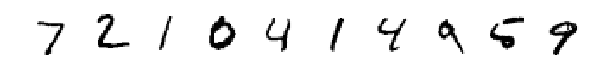

Iteration 0 Accuracy 0.1
Iteration 10 Accuracy 0.3
Iteration 20 Accuracy 0.3
Iteration 30 Accuracy 0.3
Iteration 40 Accuracy 0.3
Iteration 50 Accuracy 0.3
Iteration 60 Accuracy 0.3
Iteration 70 Accuracy 0.3
Iteration 80 Accuracy 0.3
Iteration 90 Accuracy 0.3
Iteration 100 Accuracy 0.3
Iteration 110 Accuracy 0.3
Iteration 120 Accuracy 0.3
Iteration 130 Accuracy 0.3
Iteration 140 Accuracy 0.3
Iteration 150 Accuracy 0.3
Iteration 160 Accuracy 0.3
Iteration 170 Accuracy 0.3
Iteration 180 Accuracy 0.3
Iteration 190 Accuracy 0.3
Iteration 200 Accuracy 0.3
Iteration 210 Accuracy 0.3
Iteration 220 Accuracy 0.3
Iteration 230 Accuracy 0.3
Iteration 240 Accuracy 0.3
Iteration 250 Accuracy 0.3
Iteration 260 Accuracy 0.3
Iteration 270 Accuracy 0.3
Iteration 280 Accuracy 0.3
Iteration 290 Accuracy 0.3
Iteration 300 Accuracy 0.3
Iteration 310 Accuracy 0.3
Iteration 320 Accuracy 0.3
Iteration 330 Accuracy 0.3
Iteration 340 Accuracy 0.3
Iteration 350 Accuracy 0.3
Iteration 360 Accuracy 0.3
Iteration 37

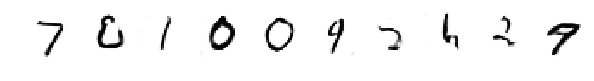

Iteration 0 Accuracy 0.2
Iteration 10 Accuracy 0.4
Iteration 20 Accuracy 0.4
Iteration 30 Accuracy 0.4
Iteration 40 Accuracy 0.4
Iteration 50 Accuracy 0.4
Iteration 60 Accuracy 0.4
Iteration 70 Accuracy 0.4
Iteration 80 Accuracy 0.4
Iteration 90 Accuracy 0.4
Iteration 100 Accuracy 0.4
Iteration 110 Accuracy 0.4
Iteration 120 Accuracy 0.4
Iteration 130 Accuracy 0.4
Iteration 140 Accuracy 0.4
Iteration 150 Accuracy 0.4
Iteration 160 Accuracy 0.4
Iteration 170 Accuracy 0.4
Iteration 180 Accuracy 0.4
Iteration 190 Accuracy 0.4
Iteration 200 Accuracy 0.4
Iteration 210 Accuracy 0.4
Iteration 220 Accuracy 0.4
Iteration 230 Accuracy 0.4
Iteration 240 Accuracy 0.4
Iteration 250 Accuracy 0.4
Iteration 260 Accuracy 0.4
Iteration 270 Accuracy 0.4
Iteration 280 Accuracy 0.4
Iteration 290 Accuracy 0.4
Iteration 300 Accuracy 0.4
Iteration 310 Accuracy 0.4
Iteration 320 Accuracy 0.4
Iteration 330 Accuracy 0.4
Iteration 340 Accuracy 0.4
Iteration 350 Accuracy 0.4
Iteration 360 Accuracy 0.4
Iteration 37

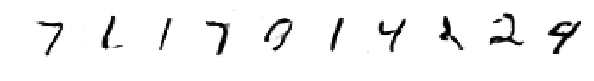

Iteration 0 Accuracy 0.1
Iteration 10 Accuracy 0.3
Iteration 20 Accuracy 0.3
Iteration 30 Accuracy 0.4
Iteration 40 Accuracy 0.5
Iteration 50 Accuracy 0.6
Iteration 60 Accuracy 0.6
Iteration 70 Accuracy 0.6
Iteration 80 Accuracy 0.6
Iteration 90 Accuracy 0.6
Iteration 100 Accuracy 0.6
Iteration 110 Accuracy 0.6
Iteration 120 Accuracy 0.6
Iteration 130 Accuracy 0.6
Iteration 140 Accuracy 0.6
Iteration 150 Accuracy 0.6
Iteration 160 Accuracy 0.6
Iteration 170 Accuracy 0.6
Iteration 180 Accuracy 0.6
Iteration 190 Accuracy 0.6
Iteration 200 Accuracy 0.6
Iteration 210 Accuracy 0.6
Iteration 220 Accuracy 0.6
Iteration 230 Accuracy 0.6
Iteration 240 Accuracy 0.6
Iteration 250 Accuracy 0.6
Iteration 260 Accuracy 0.6
Iteration 270 Accuracy 0.6
Iteration 280 Accuracy 0.6
Iteration 290 Accuracy 0.6
Iteration 300 Accuracy 0.6
Iteration 310 Accuracy 0.6
Iteration 320 Accuracy 0.6
Iteration 330 Accuracy 0.6
Iteration 340 Accuracy 0.6
Iteration 350 Accuracy 0.6
Iteration 360 Accuracy 0.6
Iteration 37

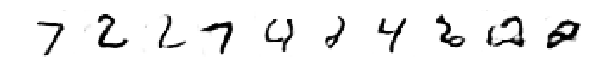

Iteration 0 Accuracy 0.1
Iteration 10 Accuracy 0.2
Iteration 20 Accuracy 0.2
Iteration 30 Accuracy 0.3
Iteration 40 Accuracy 0.3
Iteration 50 Accuracy 0.3
Iteration 60 Accuracy 0.3
Iteration 70 Accuracy 0.3
Iteration 80 Accuracy 0.3
Iteration 90 Accuracy 0.3
Iteration 100 Accuracy 0.3
Iteration 110 Accuracy 0.3
Iteration 120 Accuracy 0.3
Iteration 130 Accuracy 0.3
Iteration 140 Accuracy 0.3
Iteration 150 Accuracy 0.3
Iteration 160 Accuracy 0.3
Iteration 170 Accuracy 0.3
Iteration 180 Accuracy 0.3
Iteration 190 Accuracy 0.3
Iteration 200 Accuracy 0.3
Iteration 210 Accuracy 0.3
Iteration 220 Accuracy 0.3
Iteration 230 Accuracy 0.3
Iteration 240 Accuracy 0.3
Iteration 250 Accuracy 0.3
Iteration 260 Accuracy 0.3
Iteration 270 Accuracy 0.3
Iteration 280 Accuracy 0.3
Iteration 290 Accuracy 0.3
Iteration 300 Accuracy 0.3
Iteration 310 Accuracy 0.3
Iteration 320 Accuracy 0.3
Iteration 330 Accuracy 0.3
Iteration 340 Accuracy 0.3
Iteration 350 Accuracy 0.3
Iteration 360 Accuracy 0.3
Iteration 37

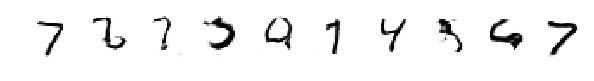

Iteration 0 Accuracy 0.4
Iteration 10 Accuracy 0.5
Iteration 20 Accuracy 0.5
Iteration 30 Accuracy 0.5
Iteration 40 Accuracy 0.5
Iteration 50 Accuracy 0.5
Iteration 60 Accuracy 0.5
Iteration 70 Accuracy 0.5
Iteration 80 Accuracy 0.5
Iteration 90 Accuracy 0.5
Iteration 100 Accuracy 0.5
Iteration 110 Accuracy 0.5
Iteration 120 Accuracy 0.5
Iteration 130 Accuracy 0.5
Iteration 140 Accuracy 0.5
Iteration 150 Accuracy 0.5
Iteration 160 Accuracy 0.5
Iteration 170 Accuracy 0.5
Iteration 180 Accuracy 0.5
Iteration 190 Accuracy 0.5
Iteration 200 Accuracy 0.5
Iteration 210 Accuracy 0.5
Iteration 220 Accuracy 0.5
Iteration 230 Accuracy 0.5
Iteration 240 Accuracy 0.5
Iteration 250 Accuracy 0.5
Iteration 260 Accuracy 0.5
Iteration 270 Accuracy 0.5
Iteration 280 Accuracy 0.5
Iteration 290 Accuracy 0.5
Iteration 300 Accuracy 0.5
Iteration 310 Accuracy 0.5
Iteration 320 Accuracy 0.5
Iteration 330 Accuracy 0.5
Iteration 340 Accuracy 0.5
Iteration 350 Accuracy 0.5
Iteration 360 Accuracy 0.5
Iteration 37

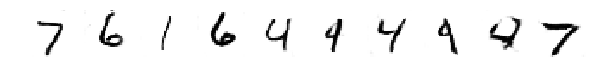

In [0]:
from tensorflow.keras.losses import binary_crossentropy

class AdversarialLatentCodes():
    def __init__(self, gan, classifier):
        self.gan = gan
        self.classifier = classifier
        
        g = gan.generator
        z = Input([gan.prior.d])
        target = Input([10])
        fakes = g(z)
        predictions = classifier(fakes)
        loss = binary_crossentropy(target, predictions)
        gradient = K.gradients(loss, z)[0]
        self.iterate = K.function([z, target], [loss, gradient])

    def change_label(self, x, target):
        # mask: one where we know the pixel, 0 where we don't
        z = self.gan.invert(x)
        lr = z*0+0.2
        momentum = 0.5
        old_gradient = 0
        for i in range(1000):
            loss, gradient = self.iterate([z, target])
            gradient = (1-momentum)*gradient + momentum*old_gradient
            old_gradient = gradient
            loss = loss[...,None]
            new_z = z - lr*gradient
            new_z = np.clip(new_z, -1, 1)
            new_loss, _ = self.iterate([new_z, target])
            new_loss = new_loss[...,None]
            #z = np.where(new_loss<loss, new_z, z+np.random.normal(0, 0.01, z.shape))
            z = new_z
            lr = np.where(new_loss>loss, lr/2, lr*1.1)*0.9
            
            # set learning rate to zero when the classification is now correct
            fakes = self.gan.generator.predict(z)
            predictions = self.classifier.predict(fakes)
            lr[predictions.argmax(1)==target.argmax(1)] = 0
                
        return self.gan.generator.predict(z)
    
samples = X_test[:10]
show(samples)
interpreter = AdversarialLatentCodes(aegan, classifier)
for i in range(5):
    target = np.zeros((10, 10))
    target[:,i] = 1
    modified = interpreter.change_label(samples, target)
    
    show(modified)
    
    

### Comparison of trained encoder vs Gradient Descent Inverter

[autoreload of callbacks failed: Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/IPython/extensions/autoreload.py", line 247, in check
    superreload(m, reload, self.old_objects)
AttributeError: 'NoneType' object has no attribute 'name'
]


Distance between found encodings 23.350234151047058
Gradient Based Reconstruction


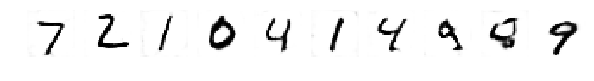

Autoencoder Based Reconstruction


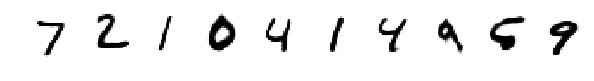

AE  MSE: 0.05514446788045608 
GAN MSE: 0.029878724954635852


In [0]:
# Compare GradientInverser and Encoder

gradient_inverter = GradientInverser(aegan)
samples = X_test[:10]
z_g = gradient_inverter.invert(samples)
z_ae = aegan.encode(samples)
print('Distance between found encodings', np.linalg.norm(z_g - z_ae))
print('Gradient Based Reconstruction')
x_g = aegan.generate(z_g)
show(x_g)
print('Autoencoder Based Reconstruction')
x_ae = aegan.generate(z_ae)
show(x_ae)
print(f"AE  MSE: {np.mean(np.square(x_ae-samples))} \nGAN MSE: {np.mean(np.square(x_g-samples))}")




Interpolation between reconstructions
------------------


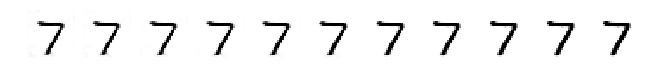

Distance in z/norm(z_g): 1.27
Distance in x/norm(x): 0.18
Distance after applying transformation to next sample 0.4839614553045071


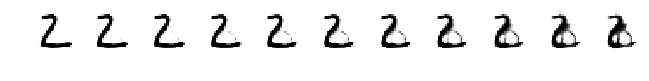

------------------


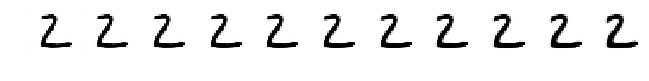

Distance in z/norm(z_g): 0.89
Distance in x/norm(x): 0.30
Distance after applying transformation to next sample 0.6211842953179838


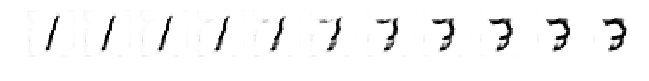

------------------


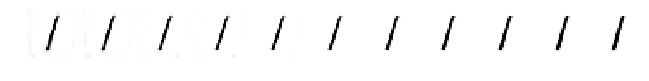

Distance in z/norm(z_g): 1.42
Distance in x/norm(x): 0.12
Distance after applying transformation to next sample 0.5537489646886539


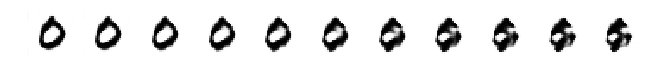

------------------


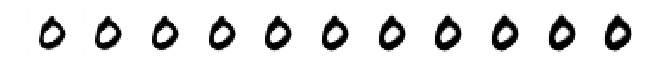

Distance in z/norm(z_g): 1.02
Distance in x/norm(x): 0.29
Distance after applying transformation to next sample 0.5788699017257543


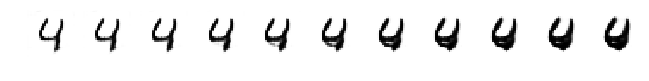

------------------


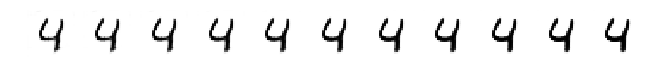

Distance in z/norm(z_g): 0.88
Distance in x/norm(x): 0.20
Distance after applying transformation to next sample 0.303711796027253


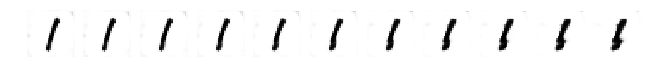

In [0]:
print("Interpolation between reconstructions")

def interpolate(generate, z0, z1):
    b = z0[None,...]
    a = z1[None,...] - b
    x = np.arange(0, 1.05, 0.1)[...,None]
    z = a*x + b
    show(generate(z))

for i in range(5):
    print("------------------")
    interpolate(aegan.generate, z_g[i], z_ae[i])
    print(f"Distance in z/norm(z_g): {np.linalg.norm(z_g[i] - z_ae[i])/np.linalg.norm(z_g[i]):.2f}\n"
         f"Distance in x/norm(x): {np.linalg.norm(x_g[i]-x_ae[i])/np.linalg.norm(samples[i]):.2f}\n"
         "Distance after applying transformation to next sample",
         np.linalg.norm(aegan.generate(z_g[i+1][None,...]) - 
                        aegan.generate((z_g[i+1] -  z_g[i] + z_ae[i])[None,...]))/np.linalg.norm(samples[i+1]))
    interpolate(aegan.generate, z_g[i+1],  z_g[i+1] -  z_g[i] + z_ae[i])
    

### Most discriminative 2D Embedding of x vs z representation

We can find the most discriminative 2D embedding for z or for x space by training a classifier that first projects into the 2D embedding space, and then classifies the labels of our images.

In order to proof the idea, we start with an embedding for x space.

[autoreload of callbacks failed: Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/IPython/extensions/autoreload.py", line 247, in check
    superreload(m, reload, self.old_objects)
AttributeError: 'NoneType' object has no attribute 'name'
]


Model: "sequential_20"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_10 (Flatten)         (None, 784)               0         
_________________________________________________________________
dense_20 (Dense)             (None, 2)                 1570      
_________________________________________________________________
dense_21 (Dense)             (None, 2048)              6144      
_________________________________________________________________
dense_22 (Dense)             (None, 10)                20490     
Total params: 28,204
Trainable params: 28,204
Non-trainable params: 0
_________________________________________________________________
Epoch 1/8
60000/60000 [==============================] - 5s 86us/sample - loss: 0.3323 - acc: 0.8946
Epoch 2/8
60000/60000 [==============================] - 5s 80us/sample - loss: 0.2845 - acc: 0.9048
Epoch 3/8
60000/60000 [======================

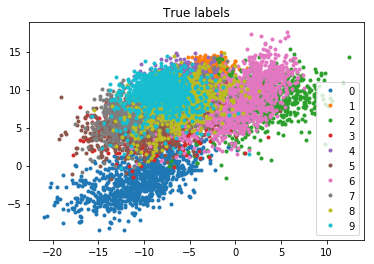

Accuracy 0.4777


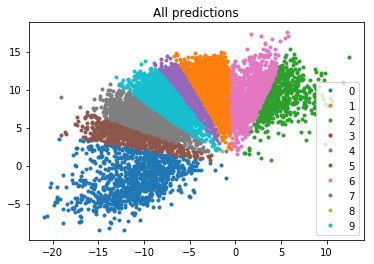

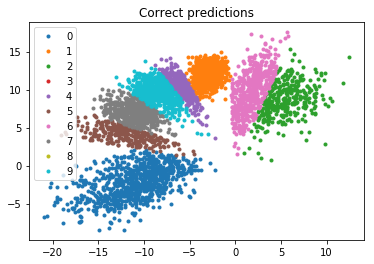

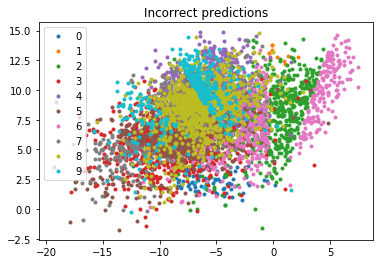

NameError: ignored

In [0]:
from tensorflow.keras.models import Model, Sequential, load_model
from tensorflow.keras.layers import Dense, Flatten


class Embedding():
    # 2D projection of a distribution that preserves label information
    def __init__(self, x, y, load_from=None, save_to=None):
        try:
            embedding_model = load_model(load_from)
        except Exception as e:
            embedding_model = Sequential()
            embedding_model.add(Flatten(input_shape=x.shape[1:]))
            embedding_model.add(Dense(2))
            embedding_model.add(Dense(2048, activation='relu'))
            embedding_model.add(Dense(10, activation='sigmoid'))
            embedding_model.summary()
            embedding_model.compile(loss='binary_crossentropy', optimizer='sgd',  metrics=['acc'])
            embedding_model.fit(x, y, epochs=8)
            if save_to is not None:
                embedding_model.save(save_to)
        self.to2d = Model(embedding_model.inputs[0], embedding_model.layers[1].output).predict
        self.predict = embedding_model.predict
        
    def plot_true_labels(self, x, y):
        x_2d = self.to2d(x)
        for digit in range(10):
            x_of_digit = x_2d[y.argmax(1)==digit]
            plt.plot(x_of_digit[:,0], x_of_digit[:,1], '.', label=digit)
        plt.title("True labels")
        plt.legend()
        plt.show()
        
    def plot_eval(self, x, y):
        x_2d = self.to2d(x)
        Y_pred = self.predict(x)
        print('Accuracy', (Y_pred.argmax(1)==y.argmax(1)).mean())
        for digit in range(10):
            x_of_digit = x_2d[Y_pred.argmax(1)==digit]
            plt.plot(x_of_digit[:,0], x_of_digit[:,1], '.', label=digit)
        plt.title('All predictions')
        plt.legend()
        plt.show()

        Y_pred = self.predict(x)
        correct = x[Y_pred.argmax(1)==y.argmax(1)]
        correct2d = self.to2d(correct)
        Y_pred = self.predict(correct)
        for digit in range(10):
            x_of_digit = correct2d[Y_pred.argmax(1)==digit]
            plt.plot(x_of_digit[:,0], x_of_digit[:,1], '.', label=digit)
        plt.title('Correct predictions')
        plt.legend()
        plt.show()

        Y_pred = self.predict(x)
        incorrect = x[Y_pred.argmax(1)!=y.argmax(1)]
        incorrect2d = self.to2d(incorrect)
        Y_true = y[Y_pred.argmax(1)!=y.argmax(1)]
        for digit in range(10):
            x_of_digit = incorrect2d[Y_true.argmax(1)==digit]
            plt.plot(x_of_digit[:,0], x_of_digit[:,1], '.', label=digit)
        plt.title('Incorrect predictions')
        plt.legend()
        plt.show()


x_embedding = Embedding(X_train, Y_train, load_from='x_embedding.h5', save_to='x_embedding.h5')
x_embedding.plot_true_labels(X_test, Y_test)
x_embedding.plot_eval(X_test, Y_test)

z = aegan.prior(10000)
fakes = aegan.generate(z)
mnist_predictor = load_model(f"{PROJECT_PATH}/mnist_predictor.h5")
labels = mnist_predictor.predict(fakes)
z_embedding = Embedding(z, labels, load_from='z_embedding.h5')
z_embedding.plot_true_labels(z, labels)
z_embedding.plot_eval(z, labels)

z = aegan.encode(X_train[:10000])
z_embedding = Embedding(z, Y_train[:10000], load_from='z_embedding.h5', save_to='z_embedding.h5')
z_embedding.plot_true_labels(z[:5000], Y_train[:5000])
z_embedding.plot_eval(z[:5000], Y_train[:5000])

In [0]:
(mnist_predictor.predict(X_test).argmax(1) == Y_test.argmax(1)).mean()

0.9917

### Exploration of the latent space

It seems that while in the image space, the problem is better solvable on a 2D projection than in z space. Let's explore the z space some more. Specifically, I want to find out, if the latent codes that belong to the same digit are a convex set - that is not the case, iff you can interpolate between codes of one class and end up with a code that does not belong to this class. 

In [77]:
digit = 8

aegan = AutoencodingGAN(Uniform(100), load_from='drive/My Drive/gan_tu/models/ae_gan')
def interpolate(self, x):
    # x: len 2
    z0, z1 = self.invert(x)
    
    i = np.arange(0, 1.05, 0.1)[...,None]
    z = z0*(1-i) + z1*i
    assert np.allclose(z[-1], z1)
    return self.generate(z)

samples = X_test[[134, 135]]
show(samples)
show(interpolate(aegan, samples))
show(interpolate(ae, samples))
show(interpolate(dcgan, samples))

samples[0] = X_test[np.random.choice(range(100))]
show(samples)
show(interpolate(aegan, samples))


ValueError: ignored

In [0]:
ae = aegan

Let's quantify it

Classifier got 0.9948979591836735 of digit 0 correct


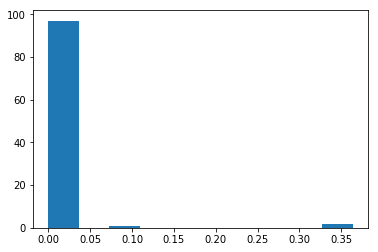

Classifier got 0.9982378854625551 of digit 1 correct
All interpolations were correct for digit 1
Classifier got 0.9922480620155039 of digit 2 correct


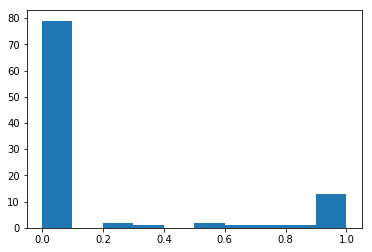

Classifier got 0.997029702970297 of digit 3 correct
All interpolations were correct for digit 3
Classifier got 0.9918533604887984 of digit 4 correct


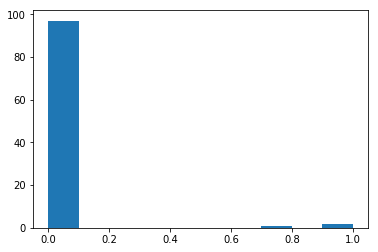

Classifier got 0.9854260089686099 of digit 5 correct


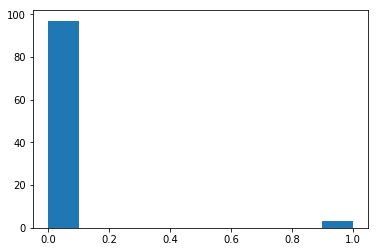

Classifier got 0.9916492693110647 of digit 6 correct
All interpolations were correct for digit 6
Classifier got 0.9902723735408561 of digit 7 correct
All interpolations were correct for digit 7
Classifier got 0.9917864476386037 of digit 8 correct
All interpolations were correct for digit 8
Classifier got 0.9821605550049554 of digit 9 correct


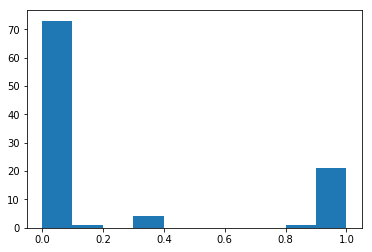

In [0]:
mnist_predictor = load_model(f"{PROJECT_PATH}/mnist_predictor.h5")

for digit in range(10):
    # measure how often an interpolated sample does not belong to this digit
    samples = X_test[Y_test[:,digit]==1]
    predictions = mnist_predictor.predict(samples)
    correct_samples=samples[predictions.argmax(1)==digit]
    print('Classifier got', len(correct_samples)/len(samples), 'of digit', digit, 'correct')
    errors = []
    for i in range(100):
        # choose two samples, interpolate, se what portion gets classified different
        # later plot a histogram of that portion
        samples = samples[np.random.randint(len(samples), size=2)]
        interpolated = interpolate(aegan, samples)
        predictions = mnist_predictor.predict(interpolated).argmax(1)
        errors += [(predictions!=digit).mean()]
    if(np.mean(errors)>0):
        plt.hist(errors)
        plt.show()
    else:
        print('All interpolations were correct for digit', digit)
        

## Train vanilla Autoencoder
The fit method takes values for the number of encoder, generator and discriminator updates per train step. If we set d_steps and g_steps to 0 this will train a regular autoencoder. The decoder does not act well as generator in that case.

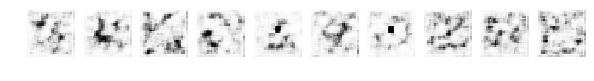

Train reconstruction


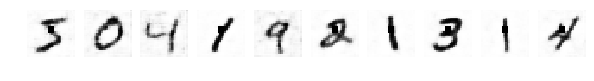

Original Train


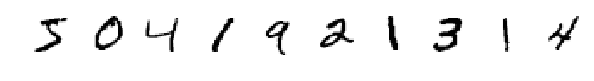

Test reconstruction


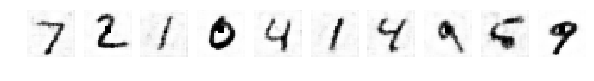

Original Test


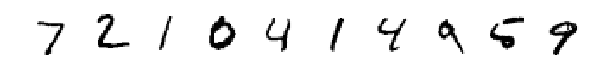

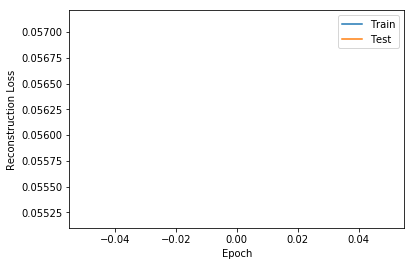

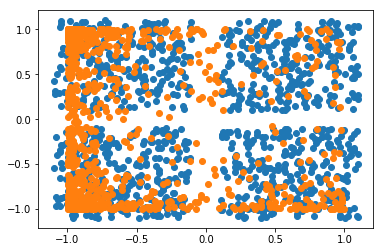

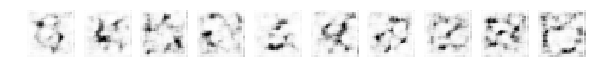

Train reconstruction


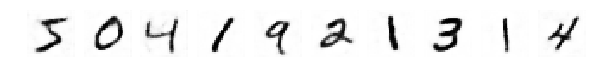

Original Train


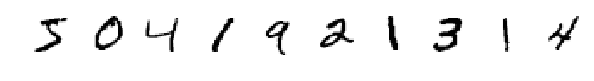

Test reconstruction


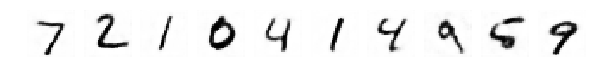

Original Test


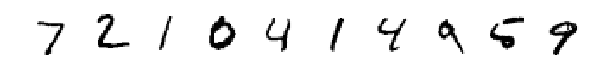

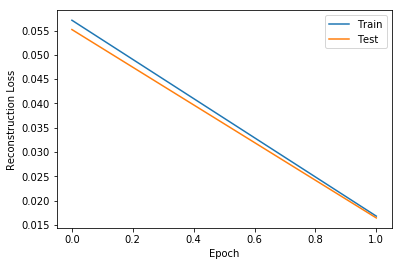

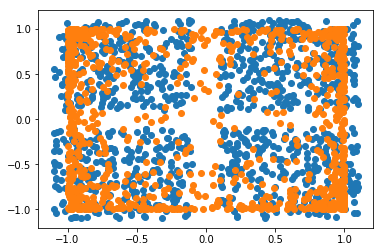

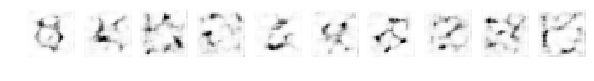

Train reconstruction


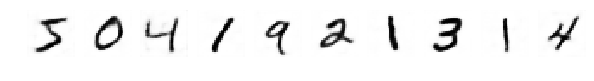

Original Train


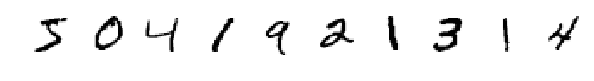

Test reconstruction


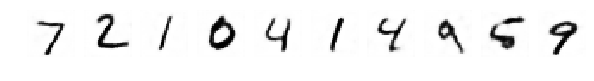

Original Test


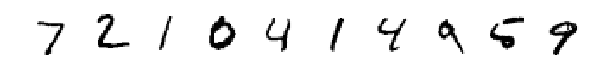

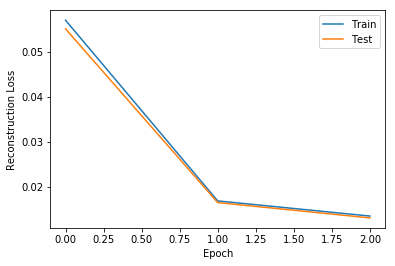

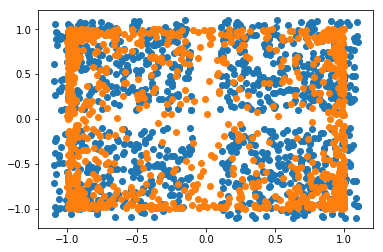

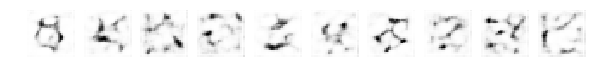

Train reconstruction


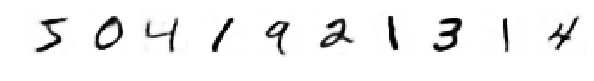

Original Train


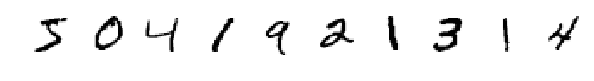

Test reconstruction


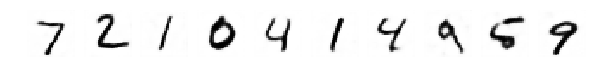

Original Test


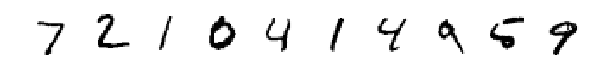

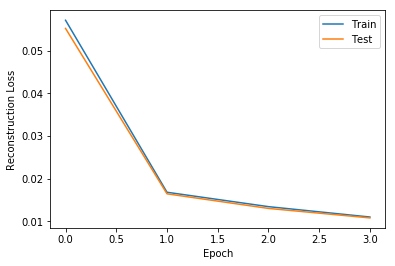

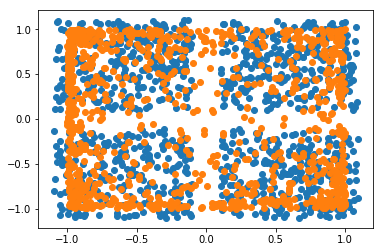

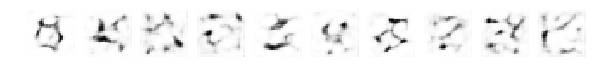

Train reconstruction


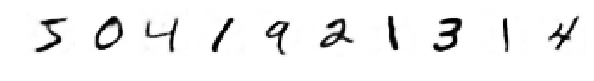

Original Train


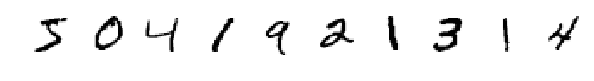

Test reconstruction


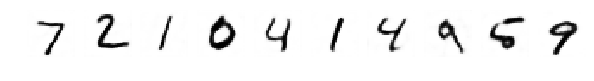

Original Test


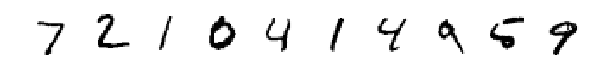

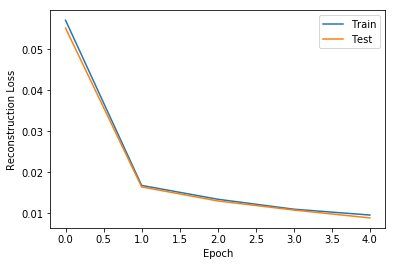

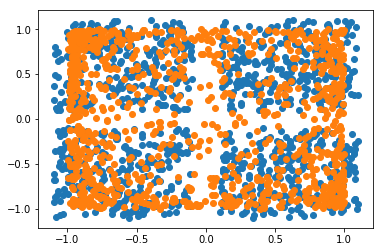

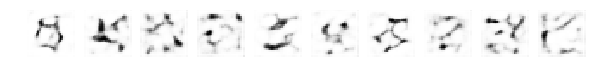

Train reconstruction


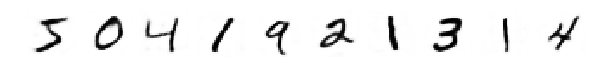

Original Train


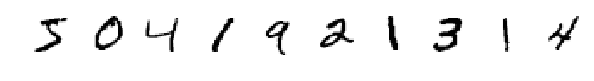

Test reconstruction


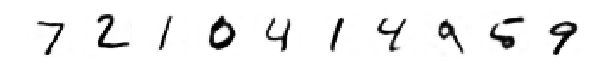

Original Test


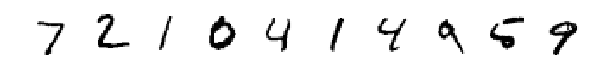

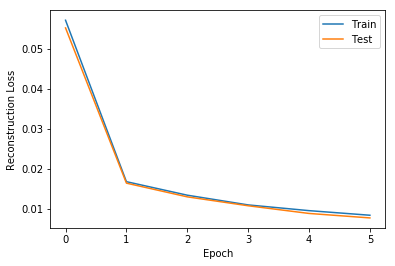

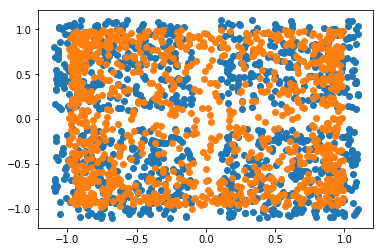

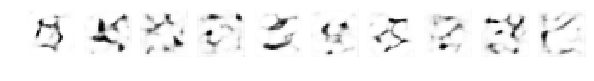

Train reconstruction


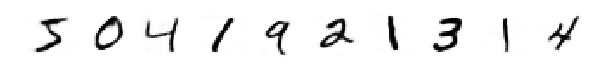

Original Train


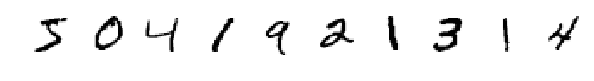

Test reconstruction


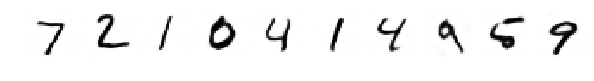

Original Test


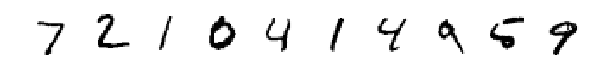

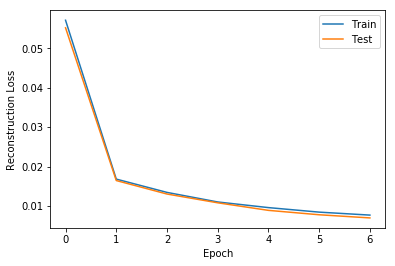

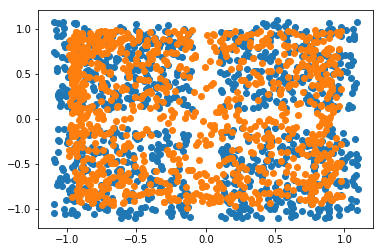

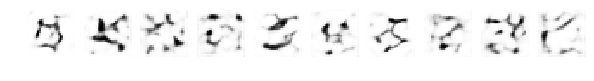

Train reconstruction


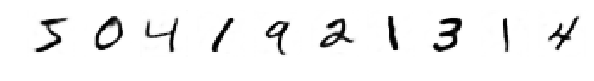

Original Train


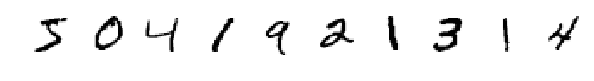

Test reconstruction


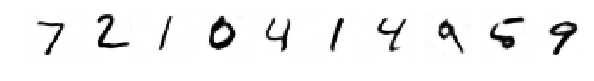

Original Test


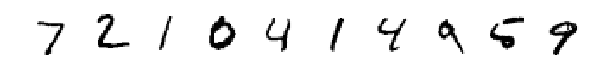

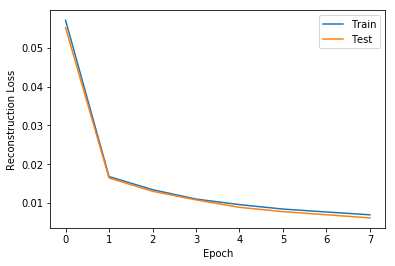

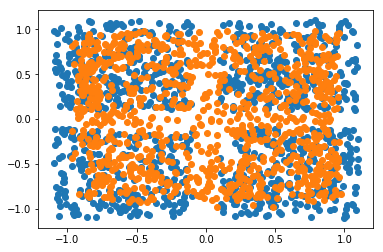

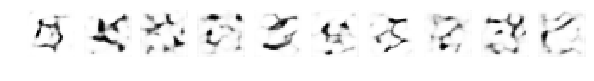

Train reconstruction


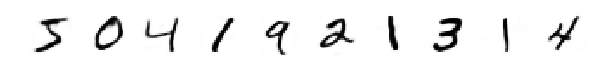

Original Train


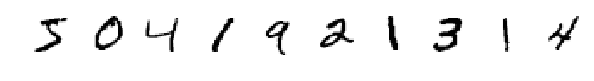

Test reconstruction


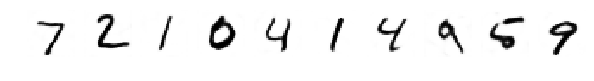

Original Test


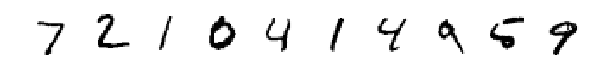

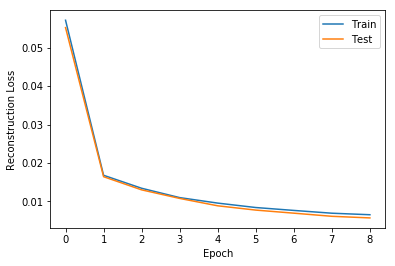

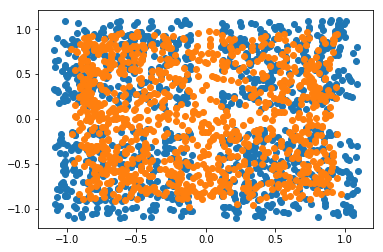

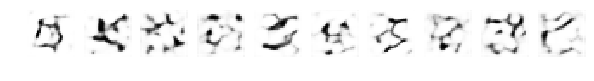

Train reconstruction


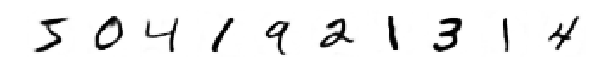

Original Train


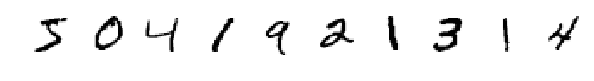

Test reconstruction


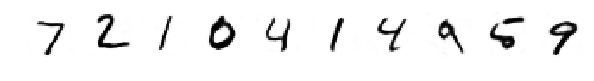

Original Test


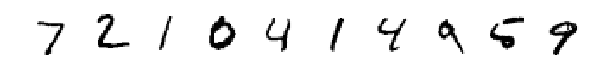

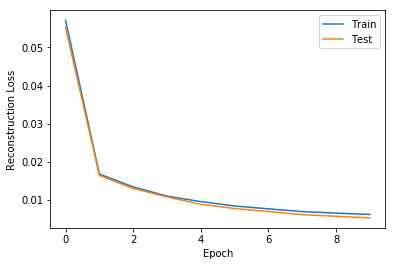

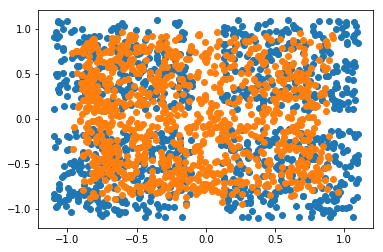

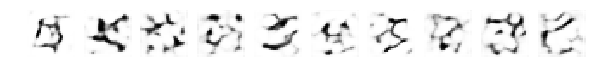

Train reconstruction


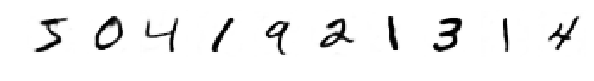

Original Train


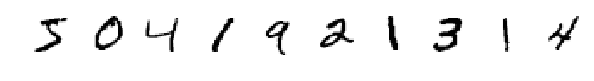

Test reconstruction


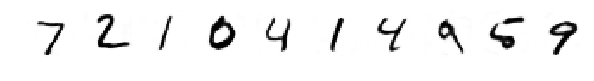

Original Test


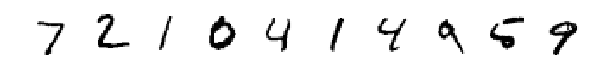

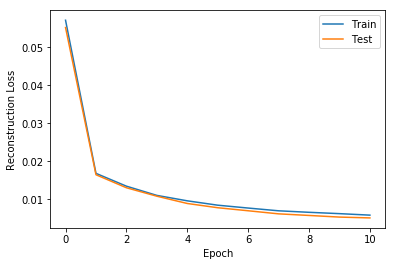

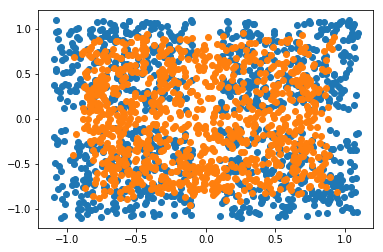

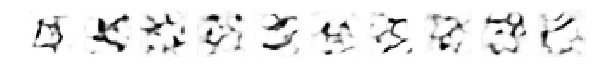

Train reconstruction


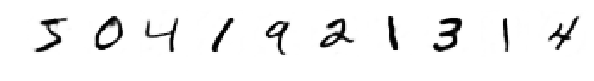

Original Train


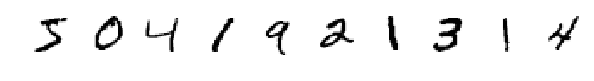

Test reconstruction


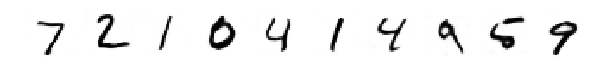

Original Test


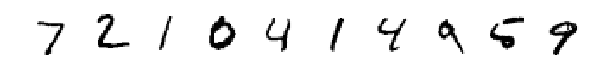

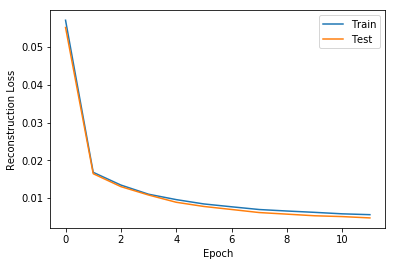

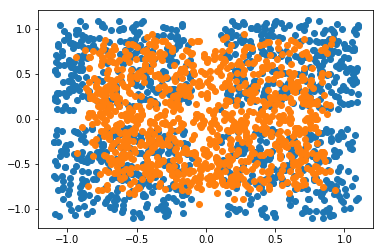

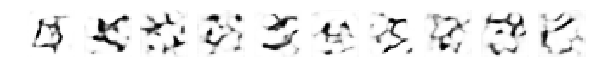

Train reconstruction


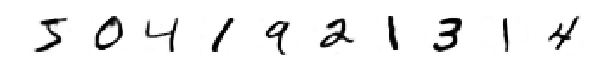

Original Train


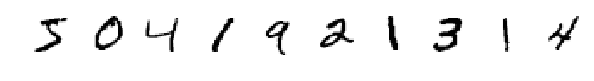

Test reconstruction


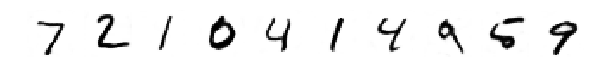

Original Test


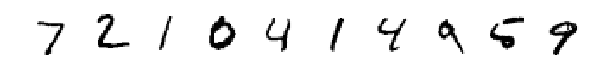

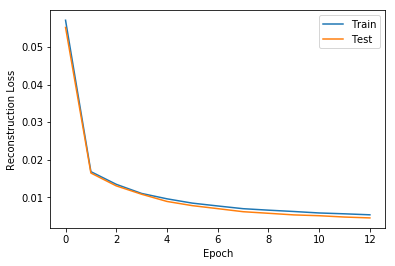

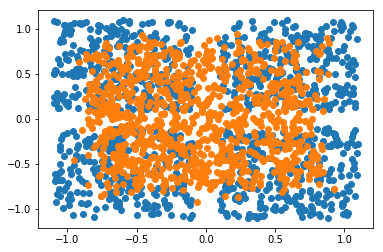

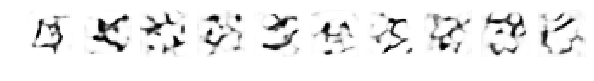

Train reconstruction


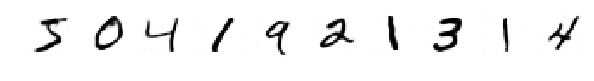

Original Train


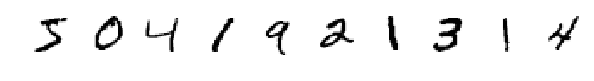

Test reconstruction


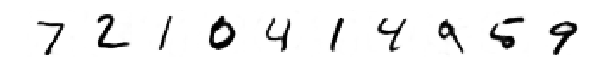

Original Test


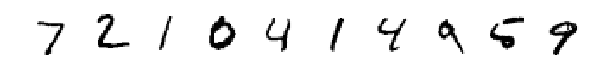

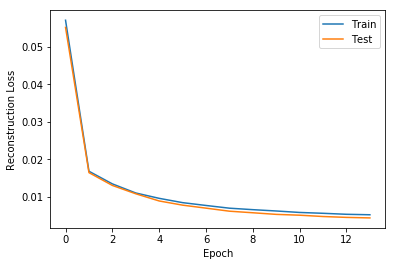

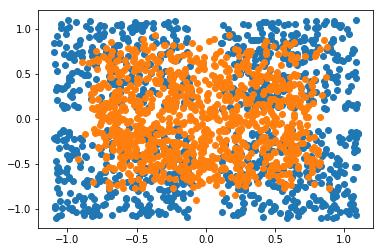

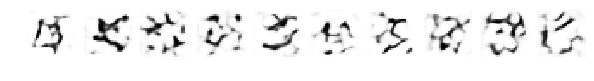

Train reconstruction


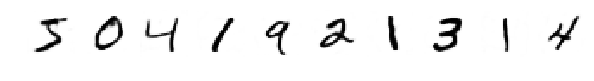

Original Train


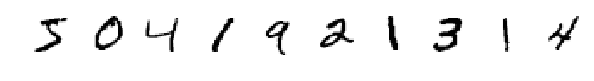

Test reconstruction


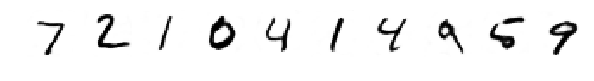

Original Test


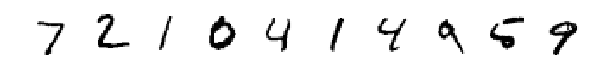

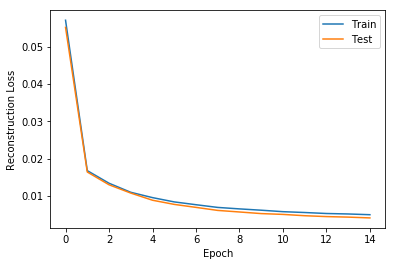

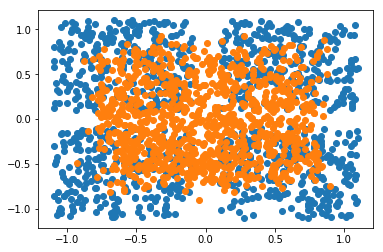

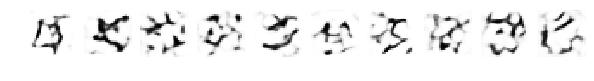

Train reconstruction


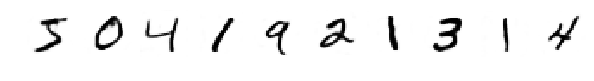

Original Train


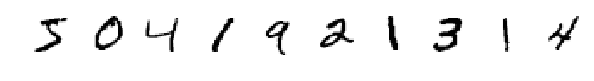

Test reconstruction


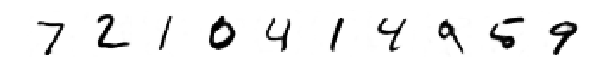

Original Test


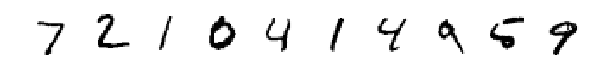

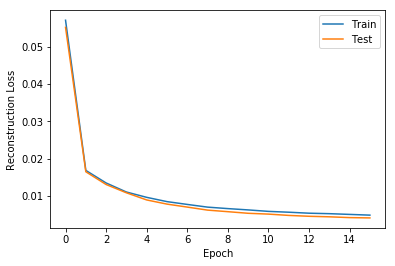

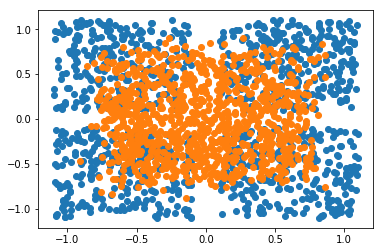

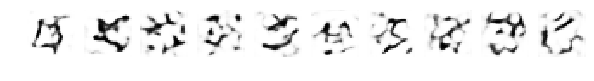

Train reconstruction


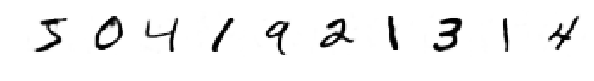

Original Train


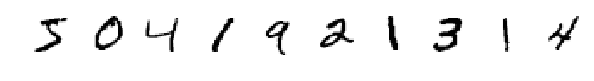

Test reconstruction


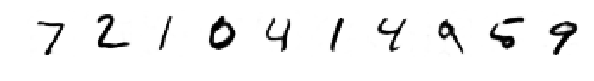

Original Test


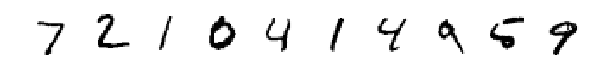

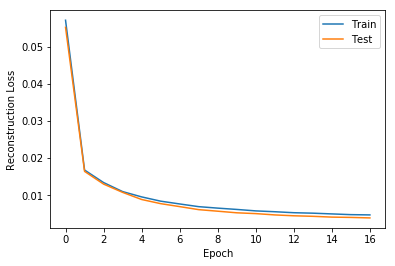

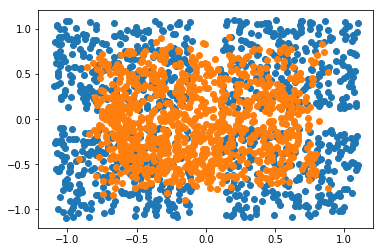

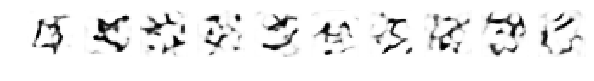

Train reconstruction


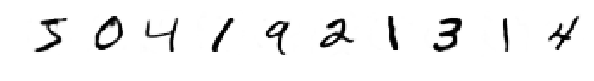

Original Train


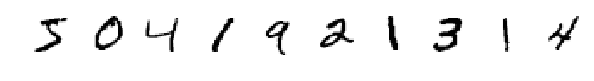

Test reconstruction


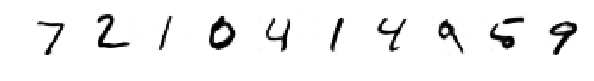

Original Test


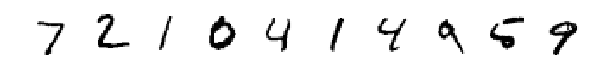

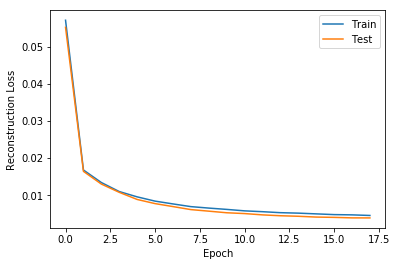

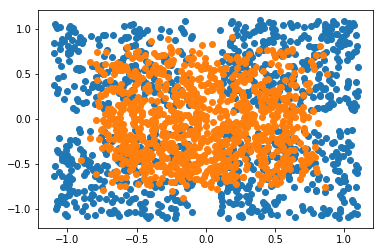

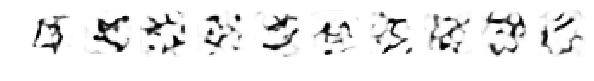

Train reconstruction


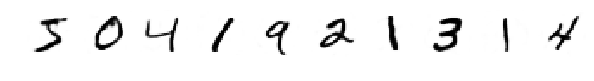

Original Train


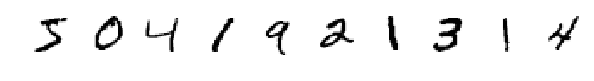

Test reconstruction


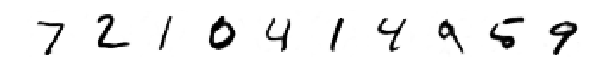

Original Test


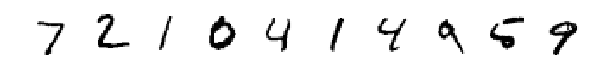

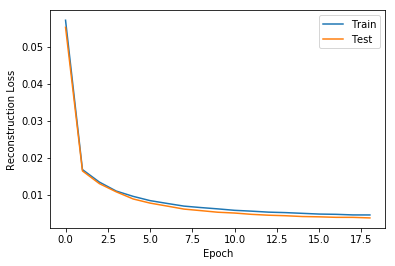

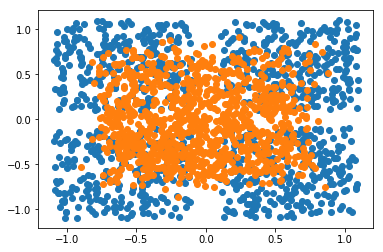

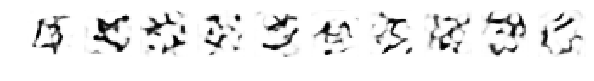

Train reconstruction


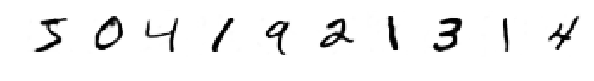

Original Train


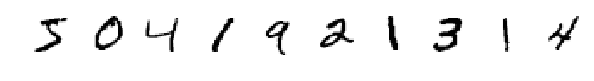

Test reconstruction


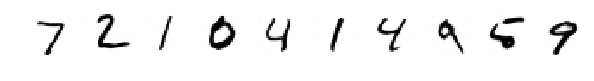

Original Test


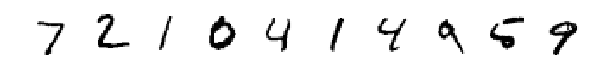

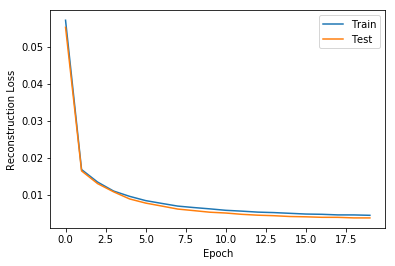

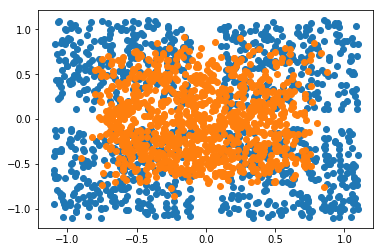

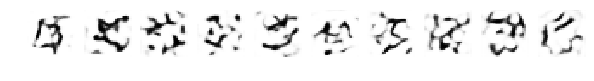

Train reconstruction


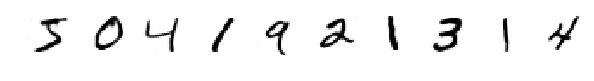

Original Train


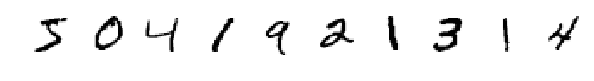

Test reconstruction


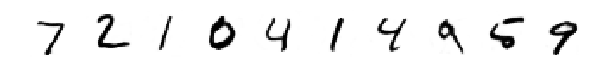

Original Test


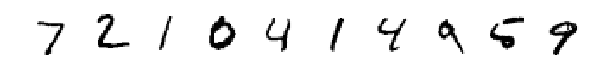

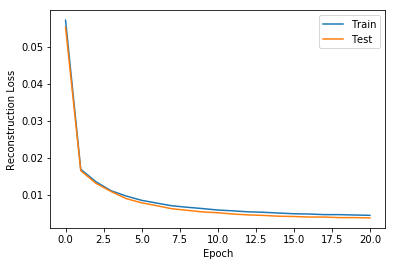

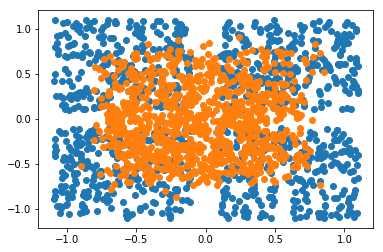

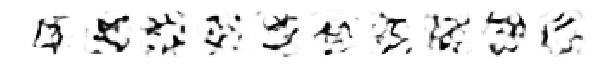

Train reconstruction


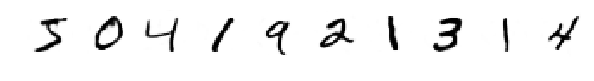

Original Train


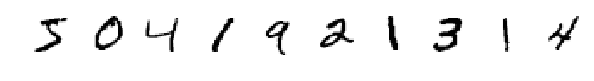

Test reconstruction


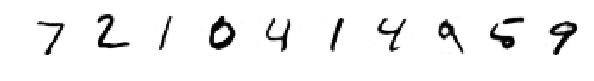

Original Test


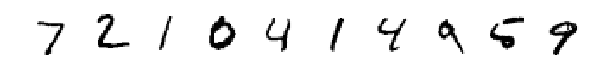

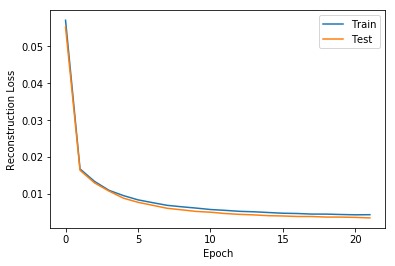

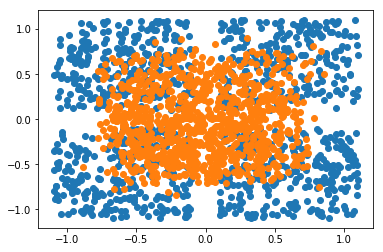

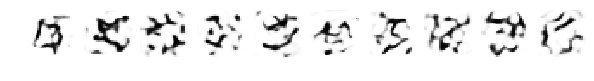

Train reconstruction


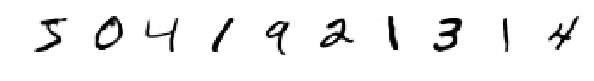

Original Train


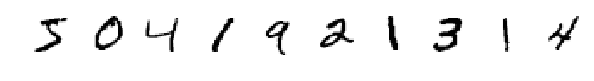

Test reconstruction


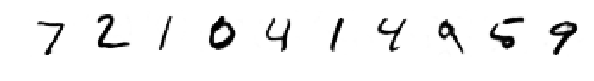

Original Test


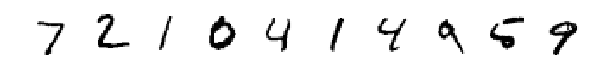

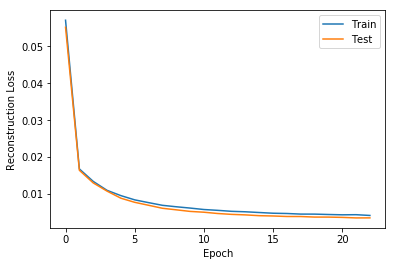

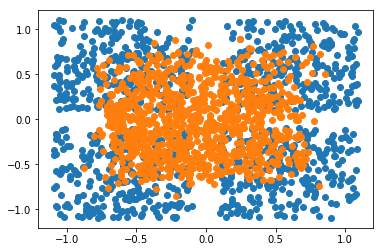

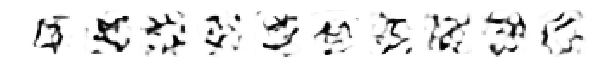

Train reconstruction


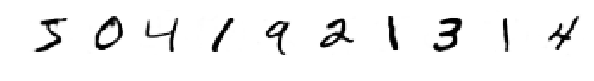

Original Train


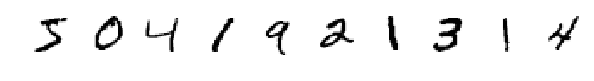

Test reconstruction


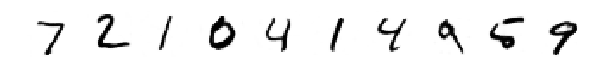

Original Test


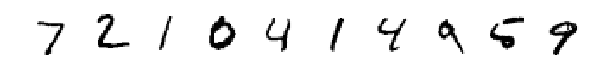

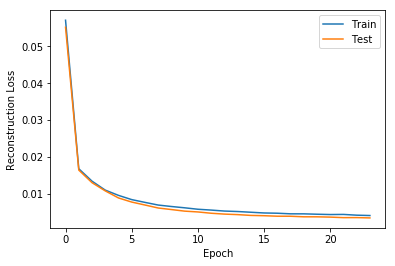

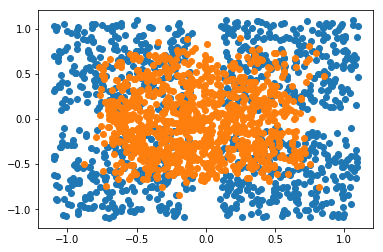

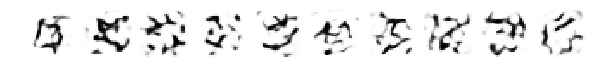

Train reconstruction


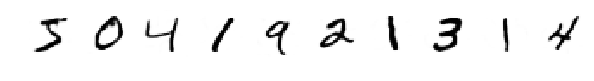

Original Train


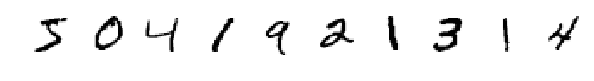

Test reconstruction


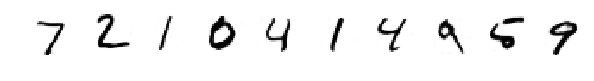

Original Test


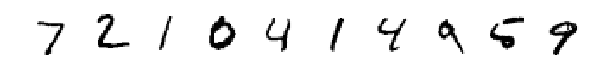

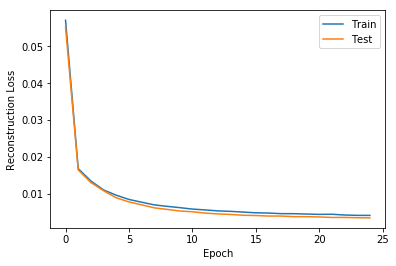

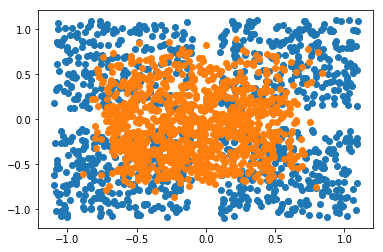

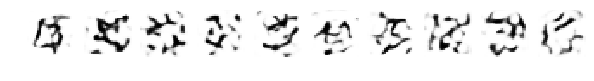

Train reconstruction


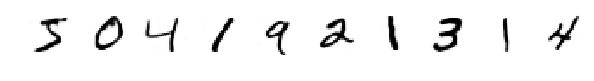

Original Train


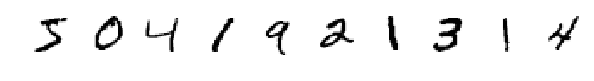

Test reconstruction


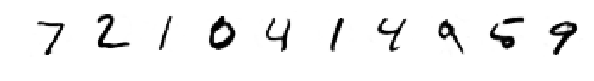

Original Test


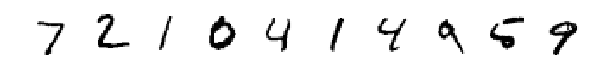

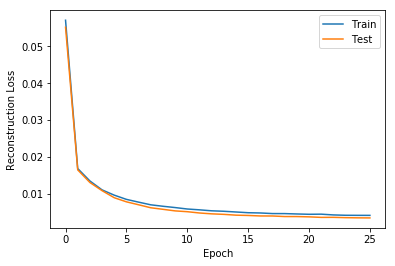

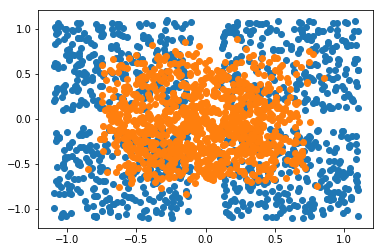

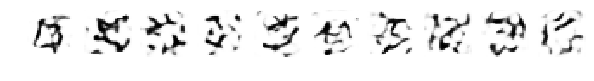

Train reconstruction


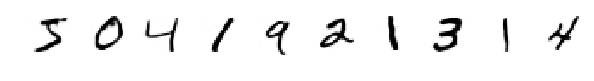

Original Train


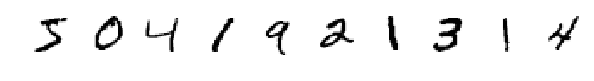

Test reconstruction


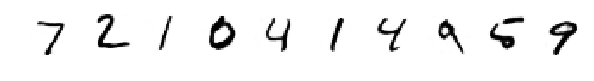

Original Test


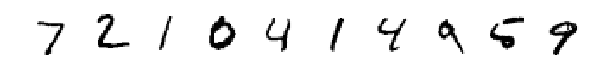

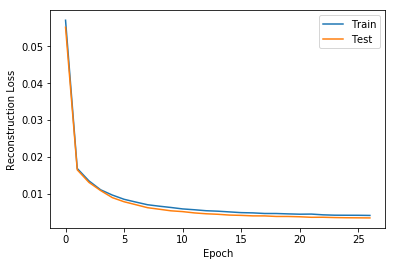

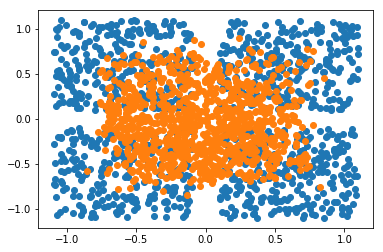

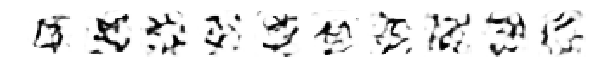

Train reconstruction


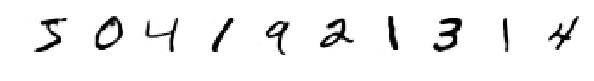

Original Train


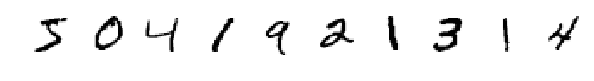

Test reconstruction


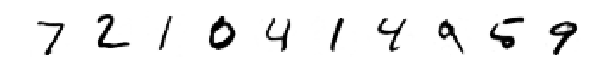

Original Test


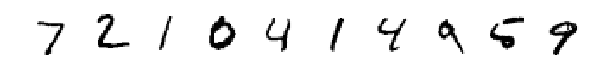

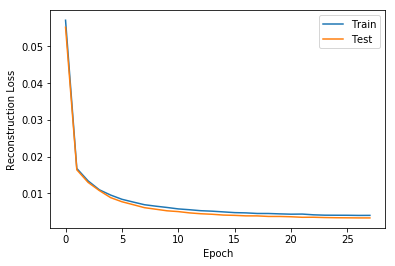

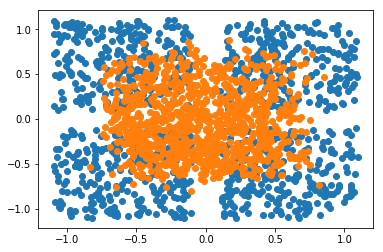

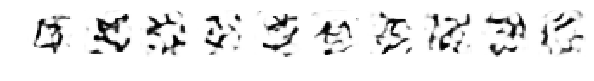

Train reconstruction


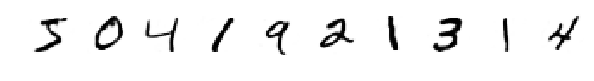

Original Train


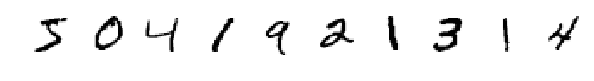

Test reconstruction


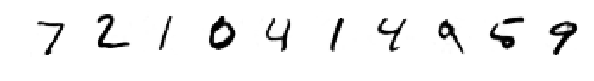

Original Test


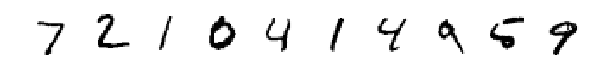

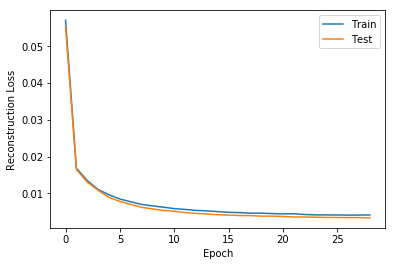

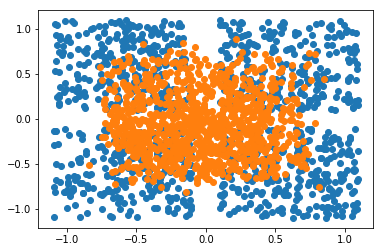

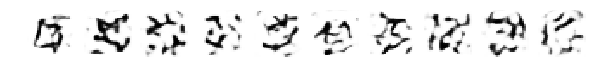

Train reconstruction


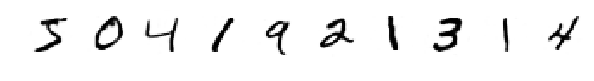

Original Train


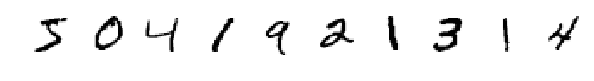

Test reconstruction


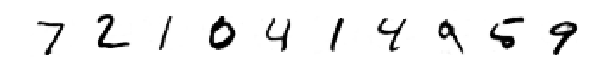

Original Test


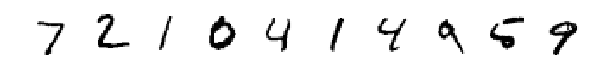

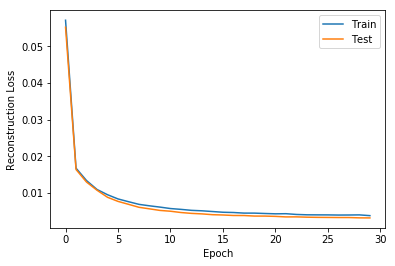

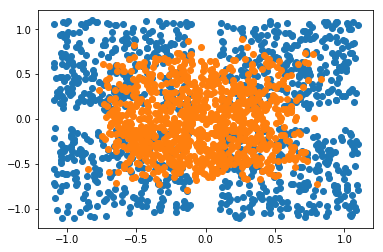

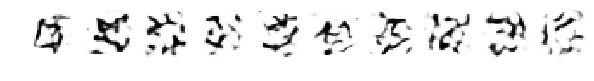

Train reconstruction


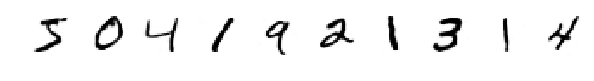

Original Train


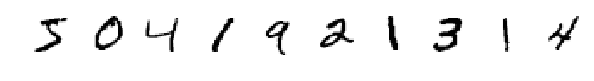

Test reconstruction


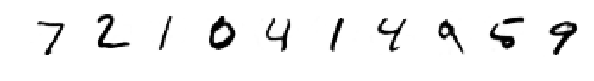

Original Test


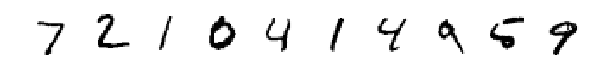

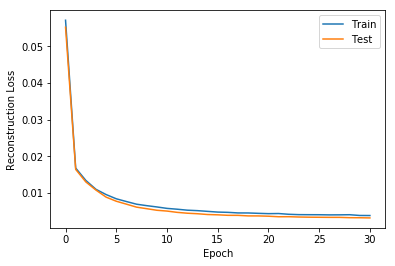

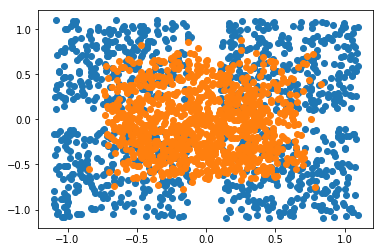

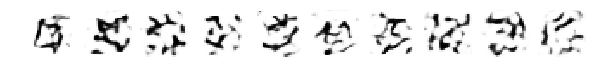

Train reconstruction


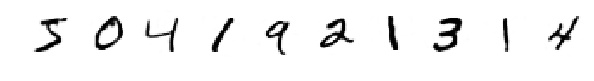

Original Train


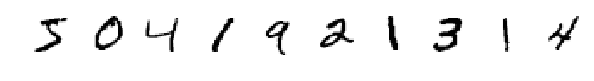

Test reconstruction


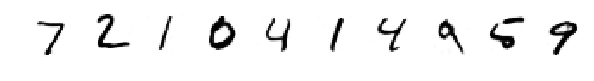

Original Test


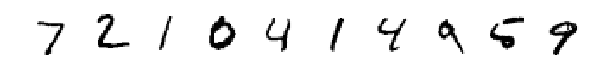

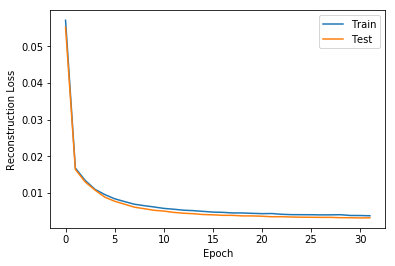

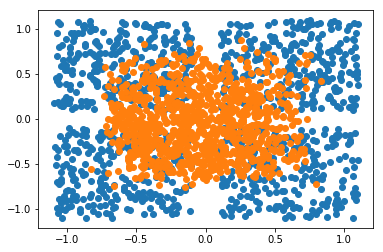

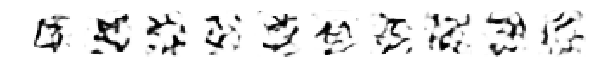

Train reconstruction


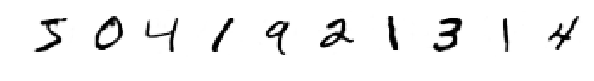

Original Train


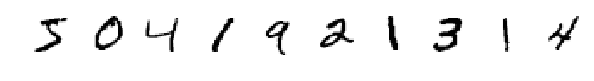

Test reconstruction


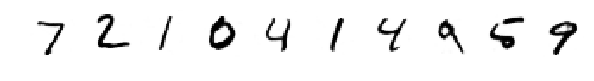

Original Test


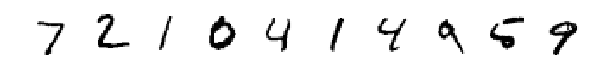

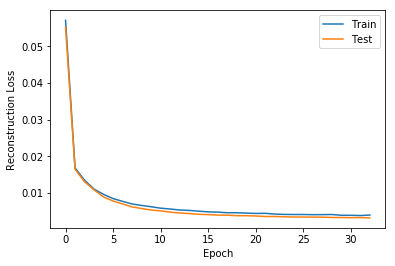

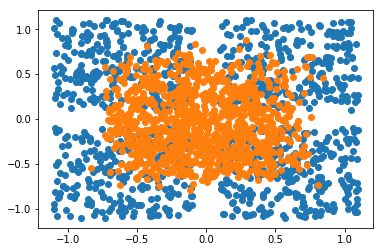

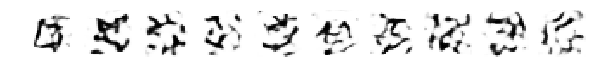

Train reconstruction


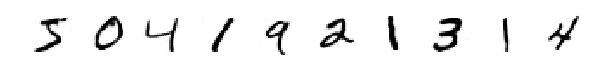

Original Train


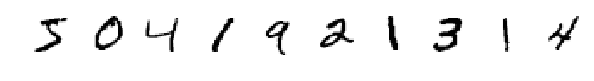

Test reconstruction


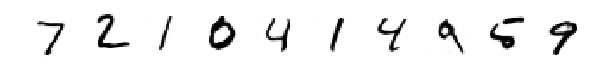

Original Test


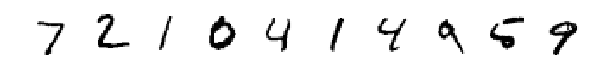

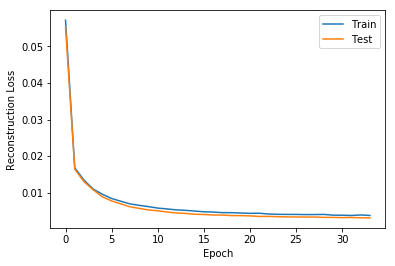

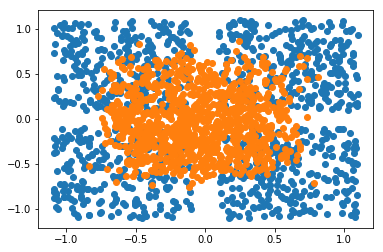

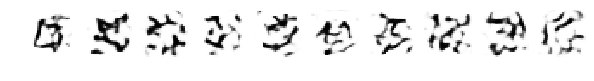

Train reconstruction


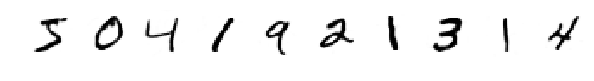

Original Train


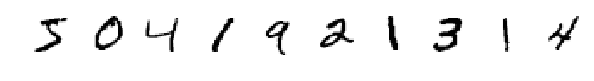

Test reconstruction


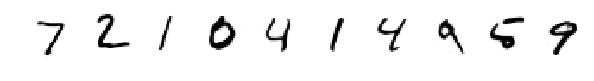

Original Test


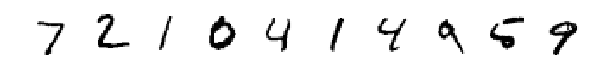

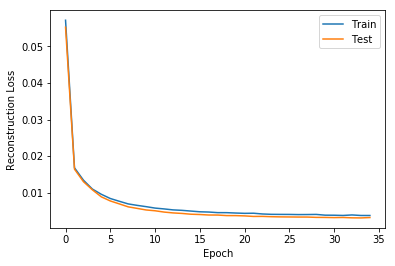

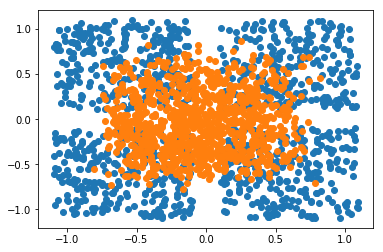

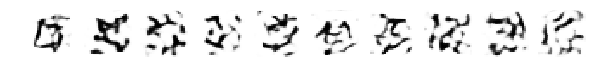

Train reconstruction


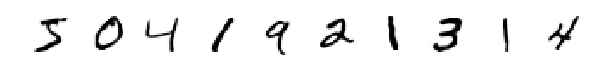

Original Train


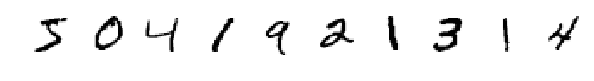

Test reconstruction


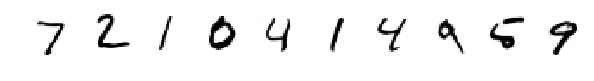

Original Test


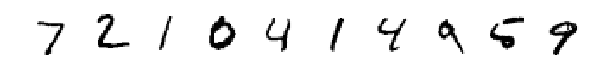

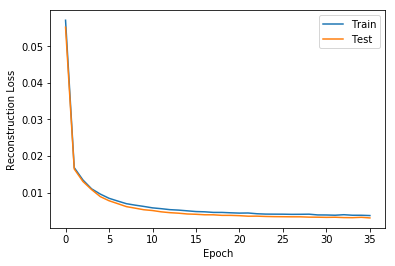

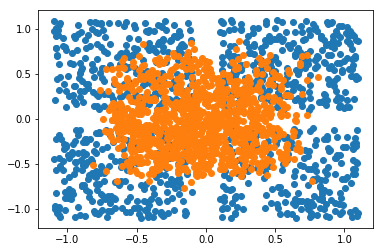

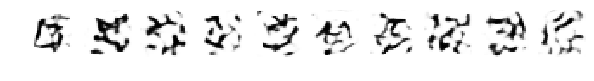

Train reconstruction


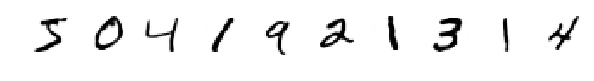

Original Train


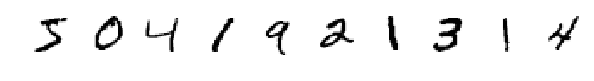

Test reconstruction


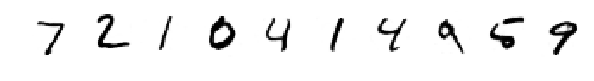

Original Test


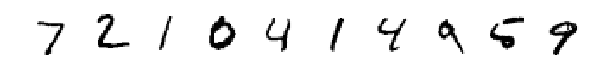

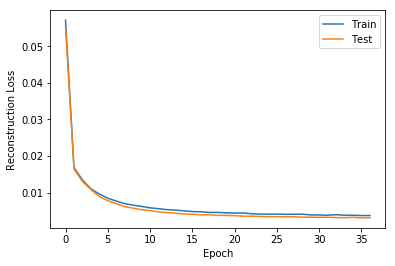

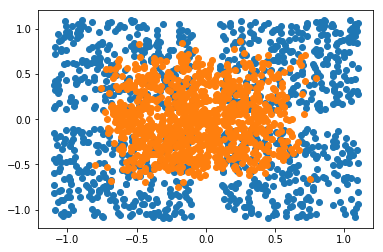

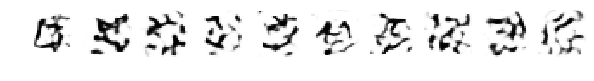

Train reconstruction


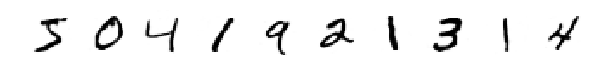

Original Train


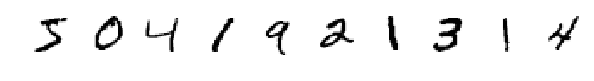

Test reconstruction


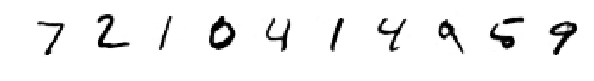

Original Test


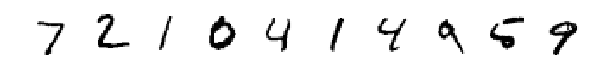

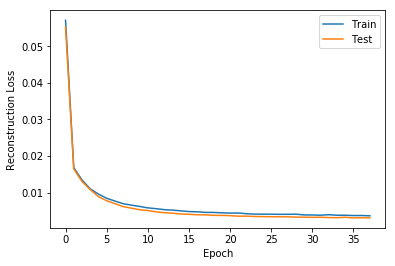

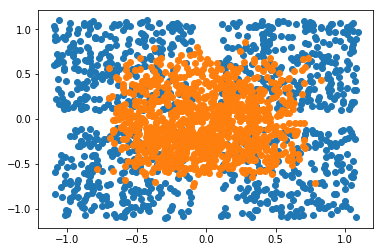

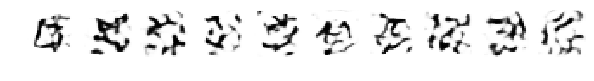

Train reconstruction


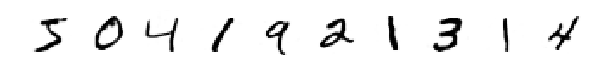

Original Train


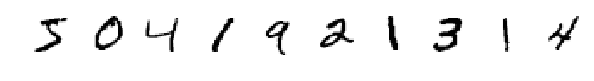

Test reconstruction


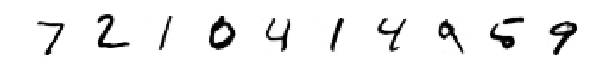

Original Test


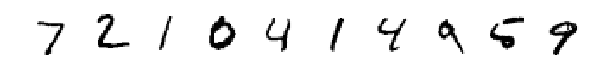

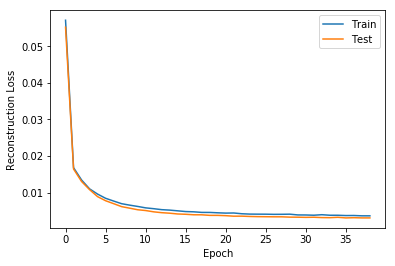

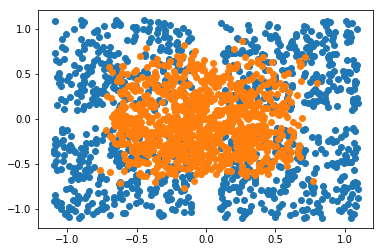

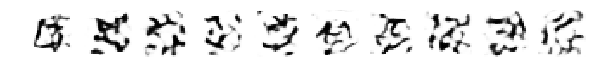

Train reconstruction


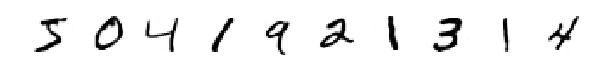

Original Train


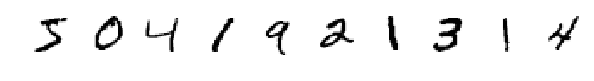

Test reconstruction


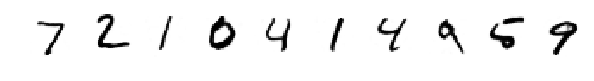

Original Test


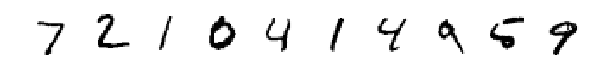

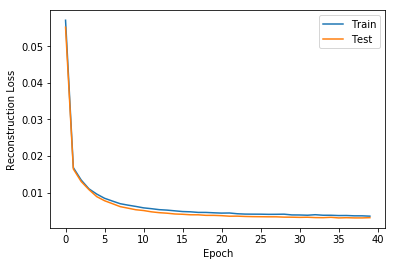

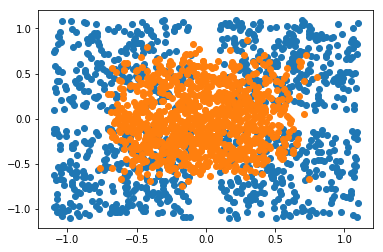

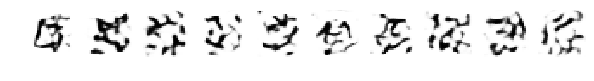

Train reconstruction


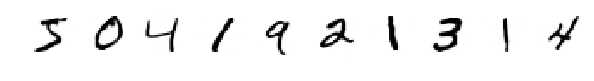

Original Train


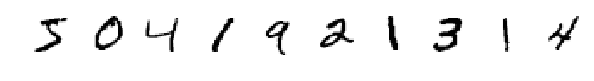

Test reconstruction


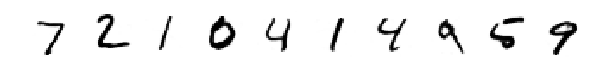

Original Test


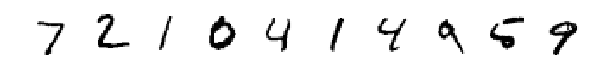

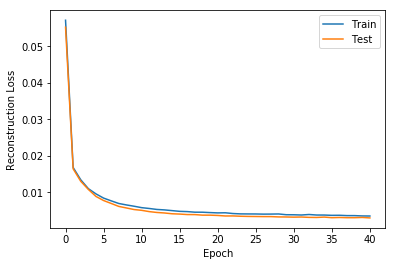

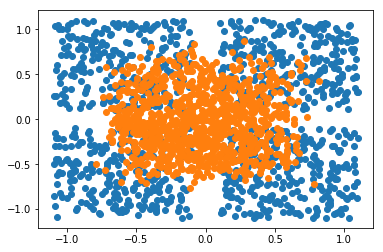

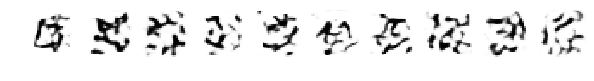

Train reconstruction


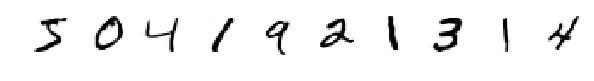

Original Train


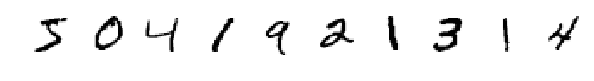

Test reconstruction


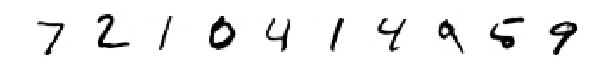

Original Test


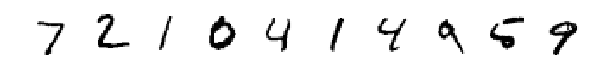

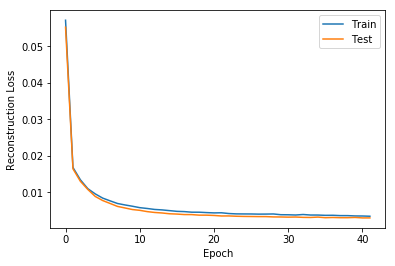

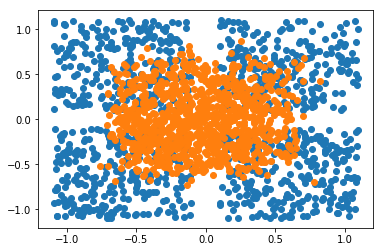

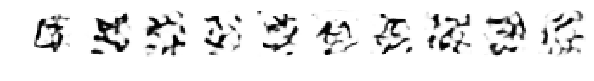

Train reconstruction


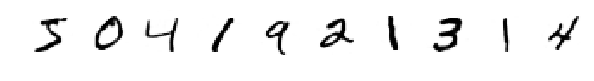

Original Train


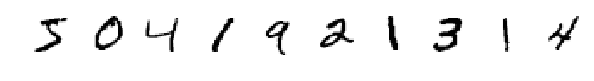

Test reconstruction


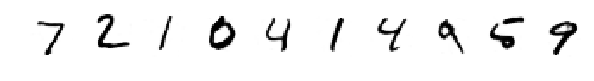

Original Test


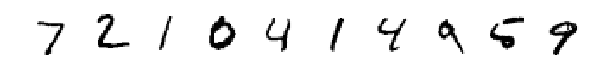

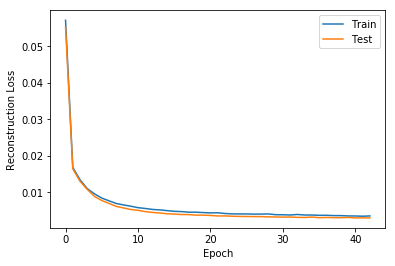

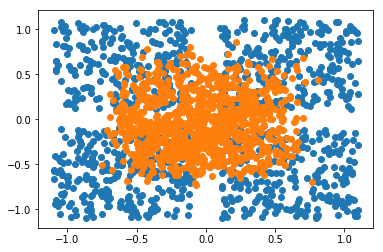

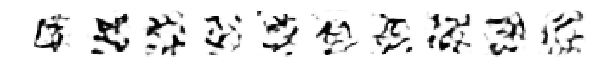

Train reconstruction


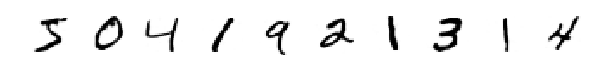

Original Train


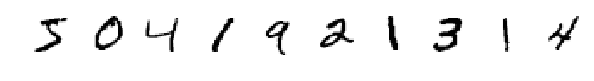

Test reconstruction


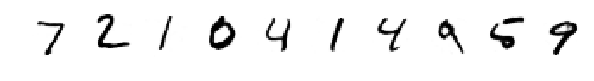

Original Test


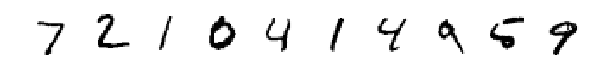

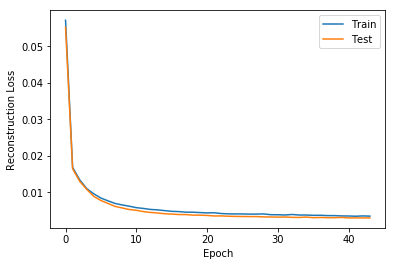

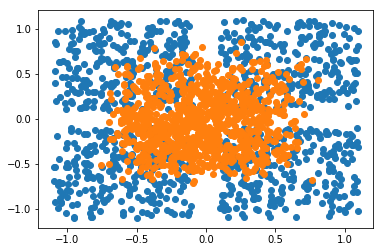

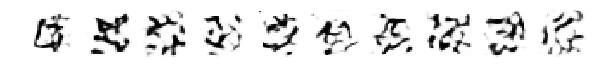

Train reconstruction


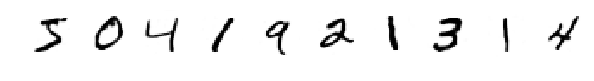

Original Train


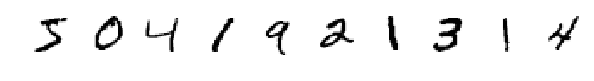

Test reconstruction


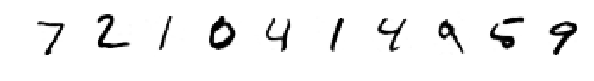

Original Test


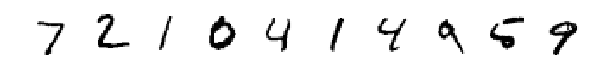

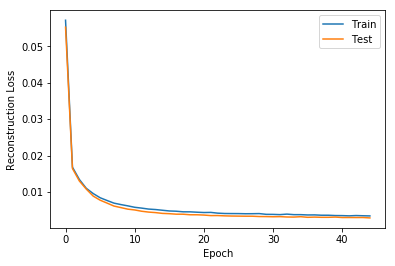

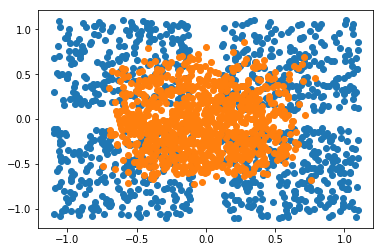

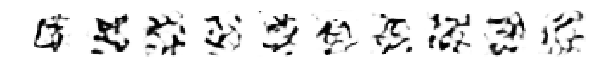

Train reconstruction


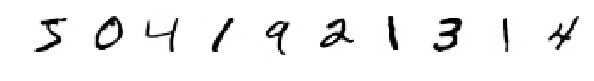

Original Train


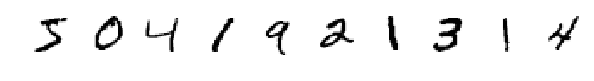

Test reconstruction


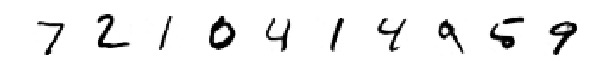

Original Test


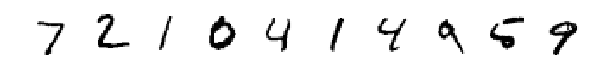

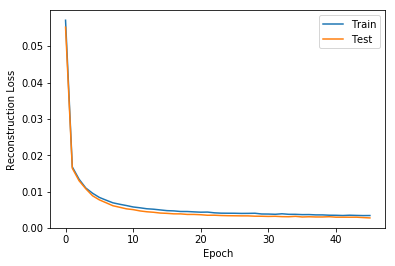

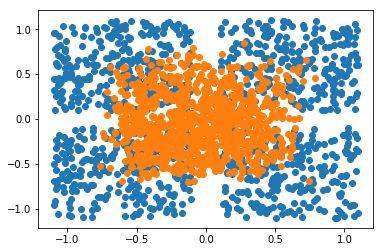

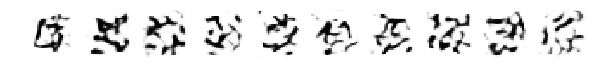

Train reconstruction


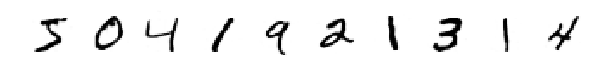

Original Train


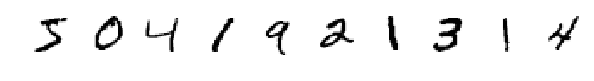

Test reconstruction


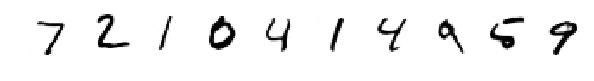

Original Test


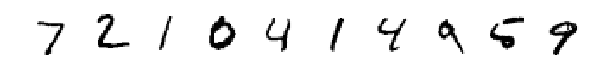

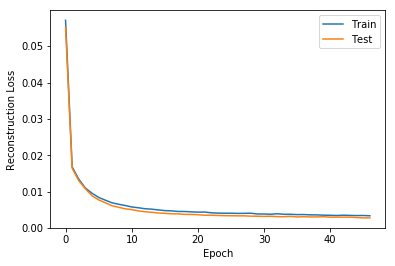

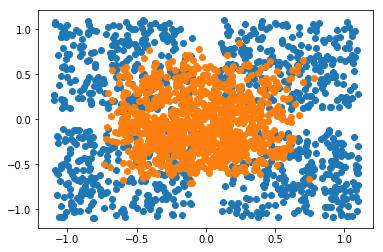

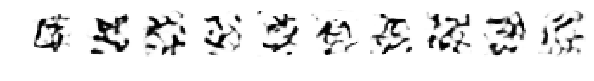

Train reconstruction


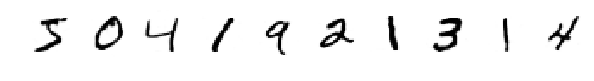

Original Train


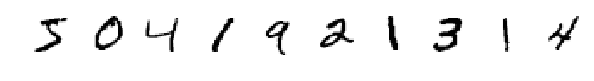

Test reconstruction


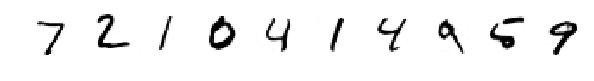

Original Test


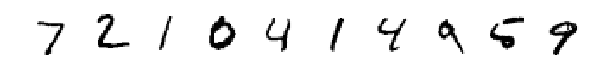

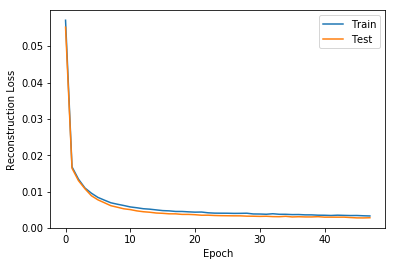

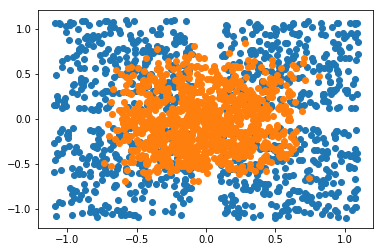

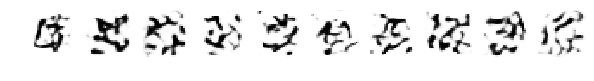

Train reconstruction


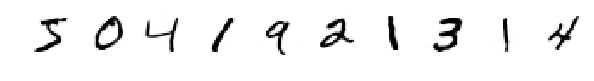

Original Train


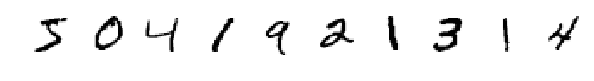

Test reconstruction


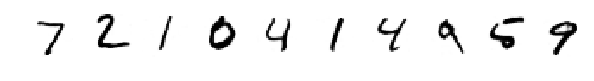

Original Test


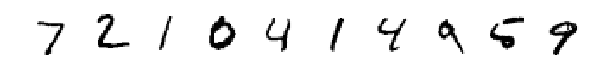

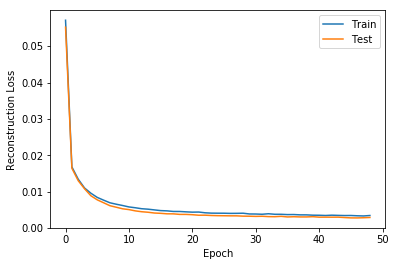

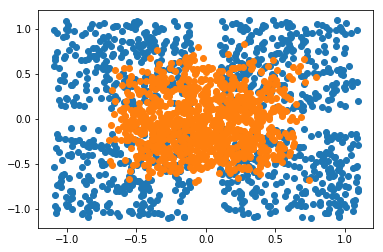

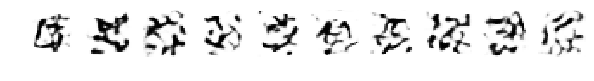

Train reconstruction


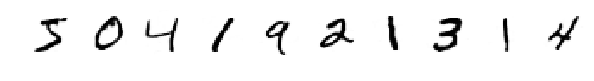

Original Train


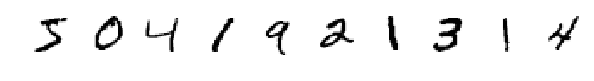

Test reconstruction


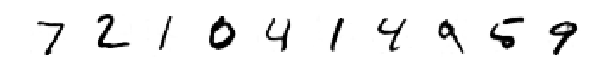

Original Test


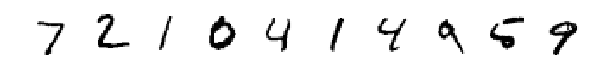

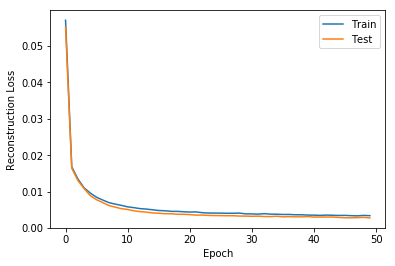

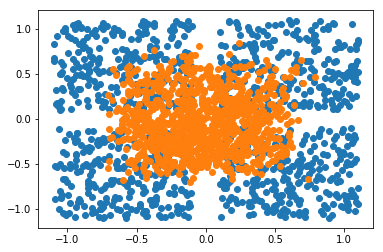

In [73]:
aegan = AutoencodingGAN(gan.Unconnected(100), train_decoder=True)

period = 10
overfitting_measure = OverfittingCallback(aegan, X_train[:100], X_test[:100], Inverser=aegan.encode)
inverse_distribution = InverseDistributionCallback(aegan, X_test[:1000], inverse=aegan.encode, show_samples=False)

train_callbacks = [
    (callbacks.EvolvingImageCallback(aegan).plot, 1),
    (overfitting_measure.track, 1),
    (overfitting_measure.plot, 1),
    (inverse_distribution.plot, 1)
]

aegan.train(X_train, epochs=50, batch_size=128, callbacks=train_callbacks, d_steps=0, g_steps=0)